# Leakage-Safe Hierarchical Brain Tumor MRI Classification

This notebook implements a reproducible two-stage hierarchical framework for brain tumor MRI classification. The pipeline first separates Normal and Abnormal scans using a binary router, then classifies abnormal scans into 14 tumor subtypes using an abnormal-only expert model.

The notebook includes dataset preparation, leakage-safe splitting, model training, evaluation, baseline comparison, ablation analysis, explainability, uncertainty, calibration, robustness testing, latency analysis, and external validation.

## 1. Environment Setup and Reproducibility

In [ ]:
import os

os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
os.environ["PYTHONHASHSEED"] = "42"

from google.colab import drive
drive.mount("/content/drive")

import random
import json
import shutil
import hashlib
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from collections import Counter, defaultdict
from tqdm import tqdm

import cv2

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR, ReduceLROnPlateau
from torch.cuda.amp import GradScaler, autocast

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

SEED = 42

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    torch.backends.cuda.matmul.allow_tf32 = False
    torch.backends.cudnn.allow_tf32 = False

    try:
        torch.use_deterministic_algorithms(True, warn_only=True)
    except Exception as e:
        print(f"Deterministic warning: {e}")

set_seed(SEED)

def seed_worker(worker_id):
    worker_seed = SEED + worker_id
    np.random.seed(worker_seed)
    random.seed(worker_seed)

g = torch.Generator()
g.manual_seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Using device: {device}")
print(f"GPU count: {torch.cuda.device_count()}")

if torch.cuda.is_available():
    print(f"GPU name: {torch.cuda.get_device_name(0)}")


PROJECT_DIR = "/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project"

DATA_DIR_DRIVE = os.path.join(PROJECT_DIR, "data")
RAW_DATA_DIR = os.path.join(DATA_DIR_DRIVE, "raw")
SPLIT_DIR = os.path.join(DATA_DIR_DRIVE, "splits")
METADATA_DIR = os.path.join(DATA_DIR_DRIVE, "metadata")

CHECKPOINT_DIR = os.path.join(PROJECT_DIR, "checkpoints")
ROUTER_CKPT_DIR = os.path.join(CHECKPOINT_DIR, "router")
EXPERT_CKPT_DIR = os.path.join(CHECKPOINT_DIR, "expert")
BASELINE_CKPT_DIR = os.path.join(CHECKPOINT_DIR, "baselines")
ABLATION_CKPT_DIR = os.path.join(CHECKPOINT_DIR, "ablations")

RESULTS_DIR = os.path.join(PROJECT_DIR, "results")
PLOTS_DIR = os.path.join(RESULTS_DIR, "plots")
METRICS_DIR = os.path.join(RESULTS_DIR, "metrics")
CM_DIR = os.path.join(RESULTS_DIR, "confusion_matrices")
XAI_DIR = os.path.join(RESULTS_DIR, "explainability")

for folder in [
    PROJECT_DIR,
    DATA_DIR_DRIVE,
    RAW_DATA_DIR,
    SPLIT_DIR,
    METADATA_DIR,
    CHECKPOINT_DIR,
    ROUTER_CKPT_DIR,
    EXPERT_CKPT_DIR,
    BASELINE_CKPT_DIR,
    ABLATION_CKPT_DIR,
    RESULTS_DIR,
    PLOTS_DIR,
    METRICS_DIR,
    CM_DIR,
    XAI_DIR
]:
    os.makedirs(folder, exist_ok=True)

print("\n✅ Drive mounted")
print(f"✅ Project folder ready: {PROJECT_DIR}")
print("✅ Seeds fixed")
print("✅ Reproducibility mode enabled")

Mounted at /content/drive
Using device: cuda
GPU count: 1
GPU name: Tesla T4

✅ Drive mounted
✅ Project folder ready: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project
✅ Seeds fixed
✅ Reproducibility mode enabled


## 2. Dataset Download and Loading


In [ ]:
import os
import zipfile
import shutil
from pathlib import Path

DATASET_SLUG = "waseemnagahhenes/brain-tumor-for-14-classes"

DATASET_ROOT = os.path.join(RAW_DATA_DIR, "brain-tumor-for-14-classes")
DATA_DIR = os.path.join(DATASET_ROOT, "BrainTumor")

print("Target dataset folder:")
print(DATASET_ROOT)

def find_brain_tumor_folder(root_dir):
    for root, dirs, files in os.walk(root_dir):
        if os.path.basename(root) == "BrainTumor":
            return root
    return None

existing_data_dir = find_brain_tumor_folder(DATASET_ROOT)

if existing_data_dir is not None:
    DATA_DIR = existing_data_dir
    print("✅ Dataset already found in Drive. No download needed.")
    print(f"✅ DATA_DIR = {DATA_DIR}")

else:
    print("Dataset not found in Drive. Downloading from Kaggle...")

    KAGGLE_JSON_DRIVE = "/content/drive/MyDrive/kaggle.json"
    KAGGLE_JSON_LOCAL = "/content/kaggle.json"

    if not os.path.exists(KAGGLE_JSON_DRIVE):
        print("\n⚠️ kaggle.json not found in Drive.")
        print("Upload kaggle.json when prompted.")
        from google.colab import files
        uploaded = files.upload()

        if "kaggle.json" not in uploaded:
            raise FileNotFoundError("kaggle.json was not uploaded.")

        shutil.move(KAGGLE_JSON_LOCAL, KAGGLE_JSON_DRIVE)
        print("✅ kaggle.json saved to Drive for future use.")

    os.makedirs("/root/.kaggle", exist_ok=True)
    shutil.copy(KAGGLE_JSON_DRIVE, "/root/.kaggle/kaggle.json")
    os.chmod("/root/.kaggle/kaggle.json", 600)

    !pip -q install kaggle

    os.makedirs(DATASET_ROOT, exist_ok=True)

    zip_path = os.path.join(DATASET_ROOT, "dataset.zip")

    !kaggle datasets download -d {DATASET_SLUG} -p {DATASET_ROOT} --force

    # Find downloaded zip
    zip_files = [f for f in os.listdir(DATASET_ROOT) if f.endswith(".zip")]

    if len(zip_files) == 0:
        raise FileNotFoundError("No zip file downloaded from Kaggle.")

    zip_path = os.path.join(DATASET_ROOT, zip_files[0])

    print(f"Extracting: {zip_path}")

    with zipfile.ZipFile(zip_path, "r") as zip_ref:
        zip_ref.extractall(DATASET_ROOT)

    os.remove(zip_path)

    DATA_DIR = find_brain_tumor_folder(DATASET_ROOT)

    if DATA_DIR is None:
        raise FileNotFoundError("BrainTumor folder not found after extraction.")

    print("✅ Dataset downloaded and extracted to Drive.")
    print(f"✅ DATA_DIR = {DATA_DIR}")

print("\nFolders inside DATA_DIR:")
print(sorted(os.listdir(DATA_DIR))[:20])

print("\n✅ Cell 2 complete")

Target dataset folder:
/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes
✅ Dataset already found in Drive. No download needed.
✅ DATA_DIR = /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor

Folders inside DATA_DIR:
['Astrocitoma', 'Carcinoma', 'Ependimoma', 'Ganglioglioma', 'Germinoma', 'Glioblastoma', 'Granuloma', 'Meduloblastoma', 'Meningioma', 'Neurocitoma', 'Normal', 'Oligodendroglioma', 'Papiloma', 'Schwannoma', 'Tuberculoma']

✅ Cell 2 complete


## 3. Dataset Metadata and Initial Audit


In [ ]:
import os
import hashlib
import cv2
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
from collections import Counter

CLASS_NAMES = sorted([
    "Astrocitoma",
    "Carcinoma",
    "Ependimoma",
    "Ganglioglioma",
    "Germinoma",
    "Glioblastoma",
    "Granuloma",
    "Meduloblastoma",
    "Meningioma",
    "Neurocitoma",
    "Normal",
    "Oligodendroglioma",
    "Papiloma",
    "Schwannoma",
    "Tuberculoma"
])

NUM_CLASSES = len(CLASS_NAMES)

class_to_idx = {cls_name: idx for idx, cls_name in enumerate(CLASS_NAMES)}
idx_to_class = {idx: cls_name for cls_name, idx in class_to_idx.items()}

NORMAL_CLASS = "Normal"
NORMAL_IDX = class_to_idx[NORMAL_CLASS]

metadata_csv = os.path.join(METADATA_DIR, "brain_tumor_metadata_with_hashes.csv")

print(f"Number of classes: {NUM_CLASSES}")
print("Classes:")
for i, cls in enumerate(CLASS_NAMES):
    print(f"{i:02d}: {cls}")

def file_sha256(path):
    """Exact file hash. Detects identical files."""
    h = hashlib.sha256()
    with open(path, "rb") as f:
        for chunk in iter(lambda: f.read(8192), b""):
            h.update(chunk)
    return h.hexdigest()

def image_phash(path):
    """
    Simple perceptual hash using DCT.
    Helps detect visually similar duplicate images.
    """
    img = Image.open(path).convert("L").resize((32, 32))
    img = np.array(img, dtype=np.float32)

    dct = cv2.dct(img)
    dct_low = dct[:8, :8]

    med = np.median(dct_low[1:, 1:])
    bits = dct_low > med

    bit_string = "".join(["1" if b else "0" for b in bits.flatten()])
    return hex(int(bit_string, 2))[2:].zfill(16)

if os.path.exists(metadata_csv):
    df = pd.read_csv(metadata_csv)
    print("\n✅ Existing metadata found. Loaded from Drive.")
    print(metadata_csv)

else:
    records = []
    corrupted = []

    image_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")

    for class_name in CLASS_NAMES:
        class_dir = os.path.join(DATA_DIR, class_name)

        if not os.path.exists(class_dir):
            raise FileNotFoundError(f"Missing class folder: {class_dir}")

        image_files = [
            f for f in os.listdir(class_dir)
            if f.lower().endswith(image_extensions)
        ]

        for fname in tqdm(image_files, desc=f"Scanning {class_name}"):
            path = os.path.join(class_dir, fname)

            try:
                with Image.open(path) as img:
                    width, height = img.size
                    mode = img.mode

                exact_hash = file_sha256(path)
                perceptual_hash = image_phash(path)

                records.append({
                    "path": path,
                    "filename": fname,
                    "class_name": class_name,
                    "label": class_to_idx[class_name],
                    "binary_label": 0 if class_name == NORMAL_CLASS else 1,
                    "binary_name": "normal" if class_name == NORMAL_CLASS else "abnormal",
                    "width": width,
                    "height": height,
                    "mode": mode,
                    "exact_hash": exact_hash,
                    "perceptual_hash": perceptual_hash
                })

            except Exception as e:
                corrupted.append({
                    "path": path,
                    "class_name": class_name,
                    "error": str(e)
                })

    df = pd.DataFrame(records)
    df.to_csv(metadata_csv, index=False)

    corrupted_csv = os.path.join(METADATA_DIR, "corrupted_images.csv")
    pd.DataFrame(corrupted).to_csv(corrupted_csv, index=False)

    print("\n✅ Metadata created and saved to Drive.")
    print(metadata_csv)
    print(f"Corrupted images found: {len(corrupted)}")

print("\n================ Dataset Summary ================")
print(f"Total valid images: {len(df)}")
print(f"Total classes: {df['class_name'].nunique()}")

print("\nClass distribution:")
display(
    df["class_name"]
    .value_counts()
    .rename_axis("class_name")
    .reset_index(name="count")
)

print("\nBinary distribution:")
display(
    df["binary_name"]
    .value_counts()
    .rename_axis("binary_name")
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    df["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

print("\nImage size summary:")
display(df[["width", "height"]].describe())

exact_duplicate_groups = df[df.duplicated("exact_hash", keep=False)]
visual_duplicate_groups = df[df.duplicated("perceptual_hash", keep=False)]

print("\n================ Leakage / Duplicate Risk Check ================")
print(f"Exact duplicate images: {len(exact_duplicate_groups)}")
print(f"Visual near-duplicate candidates by perceptual hash: {len(visual_duplicate_groups)}")

if len(exact_duplicate_groups) > 0:
    print("\nExact duplicate examples:")
    display(
        exact_duplicate_groups
        .sort_values("exact_hash")
        [["class_name", "filename", "exact_hash", "path"]]
        .head(20)
    )

if len(visual_duplicate_groups) > 0:
    print("\nVisual duplicate candidate examples:")
    display(
        visual_duplicate_groups
        .sort_values("perceptual_hash")
        [["class_name", "filename", "perceptual_hash", "path"]]
        .head(20)
    )

print("\n✅ Cell 3 complete")
print("Next cell will create fixed train/val/test splits with leakage control.")

Number of classes: 15
Classes:
00: Astrocitoma
01: Carcinoma
02: Ependimoma
03: Ganglioglioma
04: Germinoma
05: Glioblastoma
06: Granuloma
07: Meduloblastoma
08: Meningioma
09: Neurocitoma
10: Normal
11: Oligodendroglioma
12: Papiloma
13: Schwannoma
14: Tuberculoma

✅ Existing metadata found. Loaded from Drive.
/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/metadata/brain_tumor_metadata_with_hashes.csv

================ Dataset Summary ================
Total valid images: 4455
Total classes: 15

Class distribution:


,class_name,count
0,Meningioma,874
1,Astrocitoma,579
2,Normal,522
3,Schwannoma,465
4,Neurocitoma,457
5,Carcinoma,251
6,Papiloma,237
7,Oligodendroglioma,224
8,Glioblastoma,204
9,Ependimoma,150



Binary distribution:


,binary_name,count
0,abnormal,3933
1,normal,522



Image modes:


,mode,count
0,L,2396
1,RGB,2059



Image size summary:


,width,height
count,4455.000000,4455.000000
mean,566.947250,607.226712
std,82.044914,48.501064
min,305.000000,347.000000
25%,512.000000,630.000000
50%,630.000000,630.000000
75%,630.000000,630.000000
max,630.000000,630.000000



================ Leakage / Duplicate Risk Check ================
Exact duplicate images: 72
Visual near-duplicate candidates by perceptual hash: 571

Exact duplicate examples:


,class_name,filename,exact_hash,path
1958,Meningioma,2022-05-30 16_59_55-Intraventricular meningiom...,03f92aa823e9cfe7501af89a887719d118ecda40207148...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
1952,Meningioma,2022-05-30 16_59_45-Intraventricular meningiom...,03f92aa823e9cfe7501af89a887719d118ecda40207148...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
1563,Meningioma,11._big_gallery (1).jpeg,0527459ecad084cf28b6e2b3b119870800935641f42628...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2398,Meningioma,fg.jpeg,0527459ecad084cf28b6e2b3b119870800935641f42628...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
3438,Oligodendroglioma,27b75e3f31652bf47098214fc16c9e_big_gallery.jpeg,054d8adcdb6bedeb44dd5e47664d7dcfeae9f0664dd718...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
3436,Oligodendroglioma,246b895d3295c19593ec425e53a077_big_gallery.jpeg,054d8adcdb6bedeb44dd5e47664d7dcfeae9f0664dd718...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2402,Meningioma,sgkm.jpeg,119a28044b128dfc384b84f4e33ff77d72245c045d6fe5...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
1564,Meningioma,11._big_gallery.jpeg,119a28044b128dfc384b84f4e33ff77d72245c045d6fe5...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2401,Meningioma,lknef.jpeg,11c5c7afde207d9ccf4fd67c8c1dfb2567751f21522889...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2191,Meningioma,8._big_gallery (1).jpeg,11c5c7afde207d9ccf4fd67c8c1dfb2567751f21522889...,/content/drive/MyDrive/Brain_Tumor_Hierarchica...



Visual duplicate candidate examples:


,class_name,filename,perceptual_hash,path
3650,Papiloma,2022-06-13 12_39_45-Choroid plexus papilloma _...,80c24fa93a87681d,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
3651,Papiloma,2022-06-13 12_39_46-Choroid plexus papilloma _...,80c24fa93a87681d,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2724,Neurocitoma,T1_C__AX_098_big_gallery.jpeg,81074c7a3ae039d1,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2723,Neurocitoma,T1_C__AX_097_big_gallery.jpeg,81074c7a3ae039d1,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2742,Neurocitoma,T1_C__AX_117_big_gallery.jpeg,811e5ef82be02d81,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2743,Neurocitoma,T1_C__AX_118_big_gallery.jpeg,811e5ef82be02d81,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2744,Neurocitoma,T1_C__AX_119_big_gallery.jpeg,811e5ef82be02d81,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2745,Neurocitoma,T1_C__AX_120_big_gallery.jpeg,811e5ef82be02d81,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
1913,Meningioma,2022-05-30 16_47_22-Angiomatous meningioma _ R...,814a1eb97a852817,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
1911,Meningioma,2022-05-30 16_47_04-Angiomatous meningioma _ R...,814a1eb97a852817,/content/drive/MyDrive/Brain_Tumor_Hierarchica...



✅ Cell 3 complete
Next cell will create fixed train/val/test splits with leakage control.


## 4. Leakage-Safe Fixed Train/Validation/Test Split


In [ ]:
import os
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedGroupKFold
from collections import Counter

set_seed(SEED)

SPLIT_METADATA_CSV = os.path.join(SPLIT_DIR, "fixed_leakage_safe_splits.csv")

TRAIN_CSV = os.path.join(SPLIT_DIR, "train.csv")
VAL_CSV   = os.path.join(SPLIT_DIR, "val.csv")
TEST_CSV  = os.path.join(SPLIT_DIR, "test.csv")

if os.path.exists(SPLIT_METADATA_CSV):
    split_df = pd.read_csv(SPLIT_METADATA_CSV)

    train_df = split_df[split_df["split"] == "train"].reset_index(drop=True)
    val_df   = split_df[split_df["split"] == "val"].reset_index(drop=True)
    test_df  = split_df[split_df["split"] == "test"].reset_index(drop=True)

    print("✅ Existing fixed leakage-safe splits loaded from Drive.")
    print(SPLIT_METADATA_CSV)

else:
    print("Creating new fixed leakage-safe splits...")

    df = df.copy().reset_index(drop=True)

    df["leakage_group"] = df["perceptual_hash"].astype(str)

    group_class_counts = (
        df.groupby("leakage_group")["class_name"]
        .nunique()
        .reset_index(name="num_classes_in_group")
    )

    mixed_groups = group_class_counts[group_class_counts["num_classes_in_group"] > 1]

    print(f"Total perceptual-hash groups: {df['leakage_group'].nunique()}")
    print(f"Mixed-class perceptual-hash groups: {len(mixed_groups)}")

    if len(mixed_groups) > 0:
        mixed_groups_csv = os.path.join(METADATA_DIR, "mixed_class_perceptual_hash_groups.csv")
        mixed_details = df[df["leakage_group"].isin(mixed_groups["leakage_group"])]
        mixed_details.to_csv(mixed_groups_csv, index=False)
        print(f"⚠️ Mixed-class pHash groups saved for audit: {mixed_groups_csv}")

    y = df["label"].values
    groups = df["leakage_group"].values

    sgkf_outer = StratifiedGroupKFold(
        n_splits=10,
        shuffle=True,
        random_state=SEED
    )

    outer_folds = list(sgkf_outer.split(df, y, groups))

    temp_fold_ids = [0, 1, 2]

    temp_indices = np.concatenate([outer_folds[i][1] for i in temp_fold_ids])
    train_indices = np.array(
        sorted(list(set(range(len(df))) - set(temp_indices)))
    )

    train_df = df.iloc[train_indices].copy().reset_index(drop=True)
    temp_df  = df.iloc[temp_indices].copy().reset_index(drop=True)

    y_temp = temp_df["label"].values
    groups_temp = temp_df["leakage_group"].values

    sgkf_inner = StratifiedGroupKFold(
        n_splits=2,
        shuffle=True,
        random_state=SEED
    )

    inner_train_idx, inner_test_idx = next(
        sgkf_inner.split(temp_df, y_temp, groups_temp)
    )

    val_df  = temp_df.iloc[inner_train_idx].copy().reset_index(drop=True)
    test_df = temp_df.iloc[inner_test_idx].copy().reset_index(drop=True)

    train_df["split"] = "train"
    val_df["split"] = "val"
    test_df["split"] = "test"

    split_df = pd.concat([train_df, val_df, test_df], axis=0).reset_index(drop=True)

    split_df.to_csv(SPLIT_METADATA_CSV, index=False)
    train_df.to_csv(TRAIN_CSV, index=False)
    val_df.to_csv(VAL_CSV, index=False)
    test_df.to_csv(TEST_CSV, index=False)

    print("✅ New fixed leakage-safe splits created and saved to Drive.")

def leakage_check(a_df, b_df, group_col="leakage_group"):
    a_groups = set(a_df[group_col].astype(str))
    b_groups = set(b_df[group_col].astype(str))
    return len(a_groups.intersection(b_groups))

train_val_leak = leakage_check(train_df, val_df)
train_test_leak = leakage_check(train_df, test_df)
val_test_leak = leakage_check(val_df, test_df)

print("\n================ Split Sizes ================")
print(f"Train: {len(train_df)}")
print(f"Val:   {len(val_df)}")
print(f"Test:  {len(test_df)}")
print(f"Total: {len(train_df) + len(val_df) + len(test_df)}")

print("\n================ Leakage Check ================")
print(f"Train-Val shared leakage groups:  {train_val_leak}")
print(f"Train-Test shared leakage groups: {train_test_leak}")
print(f"Val-Test shared leakage groups:   {val_test_leak}")

if train_val_leak == 0 and train_test_leak == 0 and val_test_leak == 0:
    print("✅ No perceptual-hash leakage across splits.")
else:
    print("⚠️ Leakage detected. Splits need correction.")

print("\n================ Class Distribution ================")

def show_distribution(name, part_df):
    counts = part_df["class_name"].value_counts().reindex(CLASS_NAMES, fill_value=0)
    perc = (counts / len(part_df) * 100).round(2)

    out = pd.DataFrame({
        "class_name": CLASS_NAMES,
        f"{name}_count": counts.values,
        f"{name}_percent": perc.values
    })

    return out

dist_table = show_distribution("train", train_df)
dist_table = dist_table.merge(show_distribution("val", val_df), on="class_name")
dist_table = dist_table.merge(show_distribution("test", test_df), on="class_name")

display(dist_table)

print("\n================ Binary Distribution ================")

binary_dist = pd.DataFrame({
    "split": ["train", "val", "test"],
    "normal": [
        (train_df["binary_name"] == "normal").sum(),
        (val_df["binary_name"] == "normal").sum(),
        (test_df["binary_name"] == "normal").sum()
    ],
    "abnormal": [
        (train_df["binary_name"] == "abnormal").sum(),
        (val_df["binary_name"] == "abnormal").sum(),
        (test_df["binary_name"] == "abnormal").sum()
    ],
    "total": [len(train_df), len(val_df), len(test_df)]
})

display(binary_dist)

print("\n✅ Cell 4 complete")
print("Next cell will define transforms + Dataset/DataLoader.")

✅ Existing fixed leakage-safe splits loaded from Drive.
/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/splits/fixed_leakage_safe_splits.csv

================ Split Sizes ================
Train: 3092
Val:   683
Test:  680
Total: 4455

================ Leakage Check ================
Train-Val shared leakage groups:  0
Train-Test shared leakage groups: 0
Val-Test shared leakage groups:   0
✅ No perceptual-hash leakage across splits.

================ Class Distribution ================


,class_name,train_count,train_percent,val_count,val_percent,test_count,test_percent
0,Astrocitoma,403,13.03,91,13.32,85,12.50
1,Carcinoma,169,5.47,37,5.42,45,6.62
2,Ependimoma,106,3.43,24,3.51,20,2.94
3,Ganglioglioma,24,0.78,8,1.17,6,0.88
4,Germinoma,62,2.01,23,3.37,15,2.21
5,Glioblastoma,160,5.17,25,3.66,19,2.79
6,Granuloma,48,1.55,13,1.90,17,2.50
7,Meduloblastoma,88,2.85,22,3.22,21,3.09
8,Meningioma,604,19.53,137,20.06,133,19.56
9,Neurocitoma,308,9.96,74,10.83,75,11.03



================ Binary Distribution ================


,split,normal,abnormal,total
0,train,351,2741,3092
1,val,85,598,683
2,test,86,594,680



✅ Cell 4 complete
Next cell will define transforms + Dataset/DataLoader.


## 5. Data Preprocessing and DataLoaders

This section defines image transformations, dataset classes, weighted sampling, and PyTorch DataLoaders.

The hierarchy uses two different label spaces:

- **Stage 1 Router:** Binary classification  
  - Normal = 0  
  - Abnormal = 1  

- **Stage 2 Expert:** Abnormal-only 14-class classification  
  - Normal is removed from Stage 2  
  - Abnormal classes are remapped to local labels from 0 to 13  

The full pipeline evaluation loader keeps the original 15-class labels so that final predictions can be evaluated against the complete label space.

In [ ]:
import os
import cv2
import torch
import numpy as np
import pandas as pd
from PIL import Image

from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms

set_seed(SEED)

IMG_SIZE = 224
BATCH_SIZE = 16
NUM_WORKERS = 2

train_df = pd.read_csv(TRAIN_CSV)
val_df   = pd.read_csv(VAL_CSV)
test_df  = pd.read_csv(TEST_CSV)

print(f"Train samples: {len(train_df)}")
print(f"Val samples:   {len(val_df)}")
print(f"Test samples:  {len(test_df)}")

# -------------------------
# Safety checks / normal class setup
# -------------------------

if "NORMAL_CLASS" not in globals():
    NORMAL_CLASS = "Normal"

if "NORMAL_IDX" not in globals():
    NORMAL_IDX = class_to_idx[NORMAL_CLASS]

print(f"\nNormal class: {NORMAL_CLASS}")
print(f"Normal global index: {NORMAL_IDX}")

# -------------------------
# ImageNet normalization
# -------------------------

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

# -------------------------
# Stage 1 transforms: Router normal vs abnormal
# -------------------------

router_train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.RandomAffine(
        degrees=0,
        translate=(0.05, 0.05),
        scale=(0.95, 1.05)
    ),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

router_eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

# -------------------------
# Stage 2 transforms: Expert abnormal-only classifier
# -------------------------

expert_train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(
        degrees=0,
        translate=(0.08, 0.08),
        scale=(0.90, 1.10)
    ),
    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10
    ),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

expert_eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

# Set this False later if you want no augmentation for Stage 2
USE_STAGE2_AUGMENTATION = True
stage2_train_transform = expert_train_transform if USE_STAGE2_AUGMENTATION else expert_eval_transform

print(f"\nStage 2 augmentation enabled: {USE_STAGE2_AUGMENTATION}")

# -------------------------
# Dataset class
# -------------------------

class BrainTumorDataset(Dataset):
    def __init__(self, dataframe, transform=None, target_col="label"):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform
        self.target_col = target_col

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_path = row["path"]

        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        label = int(row[self.target_col])
        return image, label

# -------------------------
# Weighted sampler helper
# -------------------------

def make_weighted_sampler(labels):
    labels = np.array(labels)
    class_counts = np.bincount(labels)
    class_counts = np.where(class_counts == 0, 1, class_counts)

    class_weights = 1.0 / class_counts
    sample_weights = class_weights[labels]

    sampler = WeightedRandomSampler(
        weights=torch.DoubleTensor(sample_weights),
        num_samples=len(sample_weights),
        replacement=True,
        generator=g
    )

    return sampler

# ============================================================
# Stage 1 datasets/loaders
# Target: binary_label
# 0 = Normal, 1 = Abnormal
# ============================================================

router_train_dataset = BrainTumorDataset(
    train_df,
    transform=router_train_transform,
    target_col="binary_label"
)

router_val_dataset = BrainTumorDataset(
    val_df,
    transform=router_eval_transform,
    target_col="binary_label"
)

router_test_dataset = BrainTumorDataset(
    test_df,
    transform=router_eval_transform,
    target_col="binary_label"
)

router_train_sampler = make_weighted_sampler(train_df["binary_label"].values)

router_train_loader = DataLoader(
    router_train_dataset,
    batch_size=BATCH_SIZE,
    sampler=router_train_sampler,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

router_val_loader = DataLoader(
    router_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

router_test_loader = DataLoader(
    router_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

# ============================================================
# Stage 2 abnormal-only setup
# Normal is removed from Stage 2
# ============================================================

ABNORMAL_CLASS_NAMES = [cls for cls in CLASS_NAMES if cls != NORMAL_CLASS]
ABNORMAL_NUM_CLASSES = len(ABNORMAL_CLASS_NAMES)

abnormal_class_to_local_idx = {
    cls_name: idx for idx, cls_name in enumerate(ABNORMAL_CLASS_NAMES)
}

abnormal_local_idx_to_class = {
    idx: cls_name for cls_name, idx in abnormal_class_to_local_idx.items()
}

# local 14-class label -> original global 15-class label
abnormal_local_to_global = {
    local_idx: class_to_idx[cls_name]
    for cls_name, local_idx in abnormal_class_to_local_idx.items()
}

# original global 15-class label -> local 14-class label
abnormal_global_to_local = {
    class_to_idx[cls_name]: local_idx
    for cls_name, local_idx in abnormal_class_to_local_idx.items()
}

print("\n================ Stage 2 Abnormal-Only Setup ================")
print(f"Original classes: {NUM_CLASSES}")
print(f"Stage 2 abnormal classes: {ABNORMAL_NUM_CLASSES}")

for local_idx, cls_name in enumerate(ABNORMAL_CLASS_NAMES):
    global_idx = class_to_idx[cls_name]
    print(f"Local {local_idx:02d} -> Global {global_idx:02d}: {cls_name}")

print(f"\nRemoved from Stage 2: {NORMAL_CLASS} | global index {NORMAL_IDX}")

# -------------------------
# Build abnormal-only dataframes
# -------------------------

def make_abnormal_df(input_df):
    abnormal_df = input_df[input_df["class_name"] != NORMAL_CLASS].copy().reset_index(drop=True)

    # Keep original global 15-class label
    abnormal_df["global_label"] = abnormal_df["label"]

    # New local 14-class label for Stage 2
    abnormal_df["expert_label"] = abnormal_df["class_name"].map(abnormal_class_to_local_idx).astype(int)

    return abnormal_df

expert_train_df = make_abnormal_df(train_df)
expert_val_df   = make_abnormal_df(val_df)
expert_test_df  = make_abnormal_df(test_df)

print("\n================ Stage 2 Abnormal-Only Split Sizes ================")
print(f"Expert train samples: {len(expert_train_df)}")
print(f"Expert val samples:   {len(expert_val_df)}")
print(f"Expert test samples:  {len(expert_test_df)}")

print("\nNormal samples in Stage 2:")
print("Train:", (expert_train_df["class_name"] == NORMAL_CLASS).sum())
print("Val:  ", (expert_val_df["class_name"] == NORMAL_CLASS).sum())
print("Test: ", (expert_test_df["class_name"] == NORMAL_CLASS).sum())

print("\nStage 2 train class distribution:")
print(expert_train_df["class_name"].value_counts())

# ============================================================
# Stage 2 datasets/loaders
# Target: expert_label, 0 to 13
# ============================================================

expert_train_dataset = BrainTumorDataset(
    expert_train_df,
    transform=stage2_train_transform,
    target_col="expert_label"
)

expert_val_dataset = BrainTumorDataset(
    expert_val_df,
    transform=expert_eval_transform,
    target_col="expert_label"
)

expert_test_dataset = BrainTumorDataset(
    expert_test_df,
    transform=expert_eval_transform,
    target_col="expert_label"
)

expert_train_sampler = make_weighted_sampler(expert_train_df["expert_label"].values)

expert_train_loader = DataLoader(
    expert_train_dataset,
    batch_size=BATCH_SIZE,
    sampler=expert_train_sampler,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

expert_val_loader = DataLoader(
    expert_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

expert_test_loader = DataLoader(
    expert_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

# ============================================================
# Full pipeline loaders
# These keep original 15-class labels.
# Use these for final hierarchical evaluation.
# ============================================================

pipeline_val_dataset = BrainTumorDataset(
    val_df,
    transform=expert_eval_transform,
    target_col="label"
)

pipeline_test_dataset = BrainTumorDataset(
    test_df,
    transform=expert_eval_transform,
    target_col="label"
)

pipeline_val_loader = DataLoader(
    pipeline_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

pipeline_test_loader = DataLoader(
    pipeline_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

# ============================================================
# Quick batch check
# ============================================================

router_images, router_labels = next(iter(router_train_loader))
expert_images, expert_labels = next(iter(expert_train_loader))
pipeline_images, pipeline_labels = next(iter(pipeline_test_loader))

print("\n================ Loader Check ================")
print(f"Router batch image shape: {router_images.shape}")
print(f"Router batch labels shape: {router_labels.shape}")
print(f"Router labels example: {router_labels[:10].tolist()}")

print(f"\nExpert batch image shape: {expert_images.shape}")
print(f"Expert batch labels shape: {expert_labels.shape}")
print(f"Expert local labels example: {expert_labels[:10].tolist()}")
print(f"Expert local label min/max: {expert_labels.min().item()} / {expert_labels.max().item()}")

print(f"\nPipeline batch image shape: {pipeline_images.shape}")
print(f"Pipeline original labels example: {pipeline_labels[:10].tolist()}")

print("\n✅ Cell 5 complete")
print("✅ Stage 2 is now abnormal-only with 14 classes")
print("Next cell will define evaluation utilities and reusable training helpers.")

Train samples: 3092
Val samples:   683
Test samples:  680

Normal class: Normal
Normal global index: 10

Stage 2 augmentation enabled: True

================ Stage 2 Abnormal-Only Setup ================
Original classes: 15
Stage 2 abnormal classes: 14
Local 00 -> Global 00: Astrocitoma
Local 01 -> Global 01: Carcinoma
Local 02 -> Global 02: Ependimoma
Local 03 -> Global 03: Ganglioglioma
Local 04 -> Global 04: Germinoma
Local 05 -> Global 05: Glioblastoma
Local 06 -> Global 06: Granuloma
Local 07 -> Global 07: Meduloblastoma
Local 08 -> Global 08: Meningioma
Local 09 -> Global 09: Neurocitoma
Local 10 -> Global 11: Oligodendroglioma
Local 11 -> Global 12: Papiloma
Local 12 -> Global 13: Schwannoma
Local 13 -> Global 14: Tuberculoma

Removed from Stage 2: Normal | global index 10

================ Stage 2 Abnormal-Only Split Sizes ================
Expert train samples: 2741
Expert val samples:   598
Expert test samples:  594

Normal samples in Stage 2:
Train: 0
Val:   0
Test:  0

Stage

## 6. Training and Evaluation Utilities

This section defines reusable training, evaluation, checkpoint loading, metric computation, class weighting, and early stopping utilities. These functions are used consistently across the router, expert, baselines, and ablation experiments.

In [ ]:
# ============================================================
# Cell 6: Evaluation + Training Utilities
# ============================================================

import os
import copy
import json
import time
import numpy as np
import pandas as pd

from tqdm import tqdm
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

set_seed(SEED)

# ------------------------------------------------------------
# Metric helper
# ------------------------------------------------------------

def compute_metrics(y_true, y_pred):
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "macro_precision": precision_score(y_true, y_pred, average="macro", zero_division=0),
        "macro_recall": recall_score(y_true, y_pred, average="macro", zero_division=0),
        "macro_f1": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "weighted_f1": f1_score(y_true, y_pred, average="weighted", zero_division=0),
    }


# ------------------------------------------------------------
# Class weights helper
# ------------------------------------------------------------

def get_class_weights(labels, num_classes):
    labels = np.array(labels)
    counts = np.bincount(labels, minlength=num_classes)

    counts = np.where(counts == 0, 1, counts)

    total = counts.sum()
    weights = total / (num_classes * counts)

    return torch.tensor(weights, dtype=torch.float32).to(device)


# ------------------------------------------------------------
# Evaluation helper
# ------------------------------------------------------------

@torch.no_grad()
def evaluate_model(model, dataloader, criterion=None):
    model.eval()

    all_labels = []
    all_preds = []
    total_loss = 0.0

    for images, labels in dataloader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        outputs = model(images)

        if criterion is not None:
            loss = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)

        preds = torch.argmax(outputs, dim=1)

        all_labels.extend(labels.detach().cpu().numpy())
        all_preds.extend(preds.detach().cpu().numpy())

    avg_loss = total_loss / len(dataloader.dataset) if criterion is not None else None

    metrics = compute_metrics(all_labels, all_preds)

    if avg_loss is not None:
        metrics["loss"] = avg_loss

    return metrics, np.array(all_labels), np.array(all_preds)


# ------------------------------------------------------------
# Checkpoint helpers
# ------------------------------------------------------------

def save_checkpoint(path, model, optimizer, scheduler, epoch, best_metric, history, extra=None):
    os.makedirs(os.path.dirname(path), exist_ok=True)

    checkpoint = {
        "epoch": epoch,
        "model_state_dict": model.module.state_dict() if isinstance(model, nn.DataParallel) else model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict() if optimizer is not None else None,
        "scheduler_state_dict": scheduler.state_dict() if scheduler is not None else None,
        "best_metric": best_metric,
        "history": history,
        "seed": SEED,
        "extra": extra or {}
    }

    torch.save(checkpoint, path)


def load_model_weights(model, checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)

    state_dict = checkpoint["model_state_dict"]

    if isinstance(model, nn.DataParallel):
        model.module.load_state_dict(state_dict)
    else:
        model.load_state_dict(state_dict)

    return model


# ------------------------------------------------------------
# Generic training function
# Supports:
# - mixed precision
# - early stopping
# - correct best model saving
# - gradient clipping
# - scheduler
# ------------------------------------------------------------

def train_model(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler=None,
    epochs=10,
    checkpoint_path=None,
    history_path=None,
    monitor="macro_f1",
    mode="max",
    early_stopping=False,
    patience=10,
    grad_clip=1.0,
    use_amp=True,
    scheduler_step_on="epoch",
    model_name="model"
):
    set_seed(SEED)

    model = model.to(device)

    scaler = GradScaler(enabled=(use_amp and device.type == "cuda"))

    history = []
    best_metric = -np.inf if mode == "max" else np.inf
    best_epoch = -1
    patience_counter = 0

    print(f"\n🚀 Training {model_name}")
    print(f"Epochs: {epochs}")
    print(f"Monitor: val_{monitor} | Mode: {mode}")
    print(f"AMP enabled: {use_amp and device.type == 'cuda'}")
    print(f"Early stopping: {early_stopping}")

    for epoch in range(1, epochs + 1):
        model.train()

        running_loss = 0.0
        train_labels = []
        train_preds = []

        progress_bar = tqdm(
            train_loader,
            desc=f"{model_name} Epoch {epoch}/{epochs}",
            leave=True
        )

        for images, labels in progress_bar:
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            with autocast(enabled=(use_amp and device.type == "cuda")):
                outputs = model(images)
                loss = criterion(outputs, labels)

            scaler.scale(loss).backward()

            if grad_clip is not None:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip)

            scaler.step(optimizer)
            scaler.update()

            running_loss += loss.item() * images.size(0)

            preds = torch.argmax(outputs, dim=1)
            train_labels.extend(labels.detach().cpu().numpy())
            train_preds.extend(preds.detach().cpu().numpy())

            progress_bar.set_postfix(loss=loss.item())

        train_loss = running_loss / len(train_loader.dataset)
        train_metrics = compute_metrics(train_labels, train_preds)

        val_metrics, _, _ = evaluate_model(model, val_loader, criterion)

        current_metric = val_metrics[monitor]

        row = {
            "epoch": epoch,
            "train_loss": train_loss,
            "train_accuracy": train_metrics["accuracy"],
            "train_macro_f1": train_metrics["macro_f1"],
            "val_loss": val_metrics["loss"],
            "val_accuracy": val_metrics["accuracy"],
            "val_macro_precision": val_metrics["macro_precision"],
            "val_macro_recall": val_metrics["macro_recall"],
            "val_macro_f1": val_metrics["macro_f1"],
            "val_weighted_f1": val_metrics["weighted_f1"],
            "lr": optimizer.param_groups[0]["lr"]
        }

        history.append(row)

        print(
            f"Epoch {epoch:03d} | "
            f"Train Loss: {train_loss:.4f} | "
            f"Train Acc: {train_metrics['accuracy']:.4f} | "
            f"Train Macro-F1: {train_metrics['macro_f1']:.4f} | "
            f"Val Loss: {val_metrics['loss']:.4f} | "
            f"Val Acc: {val_metrics['accuracy']:.4f} | "
            f"Val Macro-F1: {val_metrics['macro_f1']:.4f}"
        )

        # Scheduler step
        if scheduler is not None:
            if scheduler_step_on == "val_loss":
                scheduler.step(val_metrics["loss"])
            elif scheduler_step_on == "val_metric":
                scheduler.step(current_metric)
            else:
                scheduler.step()

        # Best model check
        improved = current_metric > best_metric if mode == "max" else current_metric < best_metric

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            patience_counter = 0

            if checkpoint_path is not None:
                save_checkpoint(
                    path=checkpoint_path,
                    model=model,
                    optimizer=optimizer,
                    scheduler=scheduler,
                    epoch=epoch,
                    best_metric=best_metric,
                    history=history,
                    extra={
                        "model_name": model_name,
                        "monitor": monitor,
                        "mode": mode,
                        "img_size": IMG_SIZE,
                        "batch_size": BATCH_SIZE
                    }
                )

                print(f"💾 Best {model_name} saved | Val {monitor}: {best_metric:.4f}")

        else:
            patience_counter += 1

            if early_stopping:
                print(f"Early stopping patience: {patience_counter}/{patience}")

                if patience_counter >= patience:
                    print(f"🛑 Early stopping triggered at epoch {epoch}")
                    break

        # Save history every epoch
        if history_path is not None:
            pd.DataFrame(history).to_csv(history_path, index=False)

    print(f"\n✅ Training complete for {model_name}")
    print(f"Best epoch: {best_epoch}")
    print(f"Best val_{monitor}: {best_metric:.4f}")

    return model, pd.DataFrame(history)


print("✅ Cell 6 complete")
print("Next cell will define Stage 1 router model using EfficientNetB0 and train for 15 epochs.")

✅ Cell 6 complete
Next cell will define Stage 1 router model using EfficientNetB0 and train for 15 epochs.


## 7. Stage 1 Router Training: Normal vs Abnormal

This section trains the Stage 1 router using ResNet18. The router learns to separate Normal scans from Abnormal tumor scans. Its role is to stop Normal cases early and route only abnormal cases to the Stage 2 expert.

The router is trained using class-weighted loss to address class imbalance.

In [ ]:
# ============================================================
# Cell 7: Stage 1 Router - ResNet Normal vs Abnormal
# ============================================================

import os
import torch
import torch.nn as nn
from torchvision import models
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR

set_seed(SEED)

# -------------------------
# Choose ResNet backbone
# -------------------------
# Keep ResNet50 for stronger router.
# Change to "resnet18" only if you want a lighter/faster router.

STAGE1_RESNET_BACKBONE = "resnet18"   # options: "resnet50", "resnet18"

# -------------------------
# Paths
# -------------------------

ROUTER_BEST_PATH = os.path.join(
    ROUTER_CKPT_DIR,
    f"best_stage1_router_{STAGE1_RESNET_BACKBONE}_leakage_safe.pth"
)

ROUTER_HISTORY_PATH = os.path.join(
    METRICS_DIR,
    f"stage1_router_{STAGE1_RESNET_BACKBONE}_training_history.csv"
)

# -------------------------
# Stage 1 Router Model
# 2 classes:
# 0 = Normal
# 1 = Abnormal
# -------------------------

class RouterResNet(nn.Module):
    def __init__(self, backbone_name="resnet50", num_classes=2, dropout=0.3):
        super().__init__()

        if backbone_name == "resnet50":
            weights = models.ResNet50_Weights.IMAGENET1K_V2
            self.backbone = models.resnet50(weights=weights)
        elif backbone_name == "resnet18":
            weights = models.ResNet18_Weights.IMAGENET1K_V1
            self.backbone = models.resnet18(weights=weights)
        else:
            raise ValueError("backbone_name must be either 'resnet50' or 'resnet18'")

        in_features = self.backbone.fc.in_features

        self.backbone.fc = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(in_features, num_classes)
        )

    def forward(self, x):
        return self.backbone(x)


router = RouterResNet(
    backbone_name=STAGE1_RESNET_BACKBONE,
    num_classes=2,
    dropout=0.3
).to(device)

if torch.cuda.device_count() > 1:
    router = nn.DataParallel(router)
    print(f"✅ Using {torch.cuda.device_count()} GPUs for Stage 1 Router")

print("✅ Stage 1 Router ready")
print(f"Backbone: {STAGE1_RESNET_BACKBONE}")
print(f"Parameters: {sum(p.numel() for p in router.parameters()):,}")

# -------------------------
# Loss, optimizer, scheduler
# -------------------------

router_class_weights = get_class_weights(
    train_df["binary_label"].values,
    num_classes=2
)

print("Router class weights:", router_class_weights.detach().cpu().numpy())

router_criterion = nn.CrossEntropyLoss(
    weight=router_class_weights
)

router_optimizer = AdamW(
    router.parameters(),
    lr=1e-4,
    weight_decay=1e-4
)

router_scheduler = CosineAnnealingLR(
    router_optimizer,
    T_max=10,
    eta_min=1e-6
)

# -------------------------
# Train or load existing checkpoint
# -------------------------

if os.path.exists(ROUTER_BEST_PATH):
    print("\n✅ Existing Stage 1 Router checkpoint found.")
    print("Loading from Drive instead of retraining.")
    print(ROUTER_BEST_PATH)

    router = load_model_weights(router, ROUTER_BEST_PATH)

    if os.path.exists(ROUTER_HISTORY_PATH):
        router_history = pd.read_csv(ROUTER_HISTORY_PATH)
        display(router_history.tail())

else:
    router, router_history = train_model(
        model=router,
        train_loader=router_train_loader,
        val_loader=router_val_loader,
        criterion=router_criterion,
        optimizer=router_optimizer,
        scheduler=router_scheduler,
        epochs=10,
        checkpoint_path=ROUTER_BEST_PATH,
        history_path=ROUTER_HISTORY_PATH,
        monitor="macro_f1",
        mode="max",
        early_stopping=False,
        patience=5,
        grad_clip=1.0,
        use_amp=True,
        scheduler_step_on="epoch",
        model_name=f"Stage1_Router_{STAGE1_RESNET_BACKBONE}"
    )

# -------------------------
# Load best router after training
# -------------------------

router = load_model_weights(router, ROUTER_BEST_PATH)
router = router.to(device)

print("\n✅ Best Stage 1 Router loaded")
print(f"Checkpoint: {ROUTER_BEST_PATH}")
print("✅ Cell 7 complete")
print("Next cell will evaluate Stage 1 Router on validation and test sets.")

✅ Stage 1 Router ready
Backbone: resnet18
Parameters: 11,177,538
Router class weights: [4.404558  0.5640277]

✅ Existing Stage 1 Router checkpoint found.
Loading from Drive instead of retraining.
/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/checkpoints/router/best_stage1_router_resnet18_leakage_safe.pth


,epoch,train_loss,train_accuracy,train_macro_f1,val_loss,val_accuracy,val_macro_precision,val_macro_recall,val_macro_f1,val_weighted_f1,lr
5,6,0.011985,0.994502,0.994487,0.004772,0.998536,0.999165,0.994118,0.996624,0.998532,0.000051
6,7,0.005136,0.997089,0.997089,0.002341,0.998536,0.994186,0.999164,0.996658,0.998540,0.000035
7,8,0.002961,0.997736,0.997736,0.006922,0.998536,0.994186,0.999164,0.996658,0.998540,0.000021
8,9,0.000986,0.999677,0.999677,0.001694,1.000000,1.000000,1.000000,1.000000,1.000000,0.000010
9,10,0.005130,0.997089,0.997089,0.003566,0.998536,0.999165,0.994118,0.996624,0.998532,0.000003



✅ Best Stage 1 Router loaded
Checkpoint: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/checkpoints/router/best_stage1_router_resnet18_leakage_safe.pth
✅ Cell 7 complete
Next cell will evaluate Stage 1 Router on validation and test sets.


## 8. Stage 1 Router Evaluation

This section evaluates the trained router on validation and test sets using accuracy, precision, recall, macro-F1, weighted-F1, classification reports, and confusion matrices. The router’s performance is important because routing errors can propagate into the full hierarchical pipeline.

================ Stage 1 Router Validation Metrics ================
accuracy: 1.0000
macro_precision: 1.0000
macro_recall: 1.0000
macro_f1: 1.0000
weighted_f1: 1.0000
loss: 0.0017

================ Stage 1 Router Test Metrics ================
accuracy: 0.9985
macro_precision: 0.9943
macro_recall: 0.9992
macro_f1: 0.9967
weighted_f1: 0.9985
loss: 0.0041

================ Validation Classification Report ================


,precision,recall,f1-score,support
Normal,1.0,1.0,1.0,85.0
Abnormal,1.0,1.0,1.0,598.0
accuracy,1.0,1.0,1.0,1.0
macro avg,1.0,1.0,1.0,683.0
weighted avg,1.0,1.0,1.0,683.0



================ Test Classification Report ================


,precision,recall,f1-score,support
Normal,0.988506,1.000000,0.994220,86.000000
Abnormal,1.000000,0.998316,0.999158,594.000000
accuracy,0.998529,0.998529,0.998529,0.998529
macro avg,0.994253,0.999158,0.996689,680.000000
weighted avg,0.998546,0.998529,0.998533,680.000000


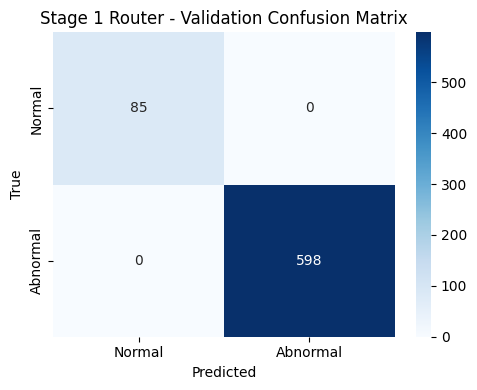

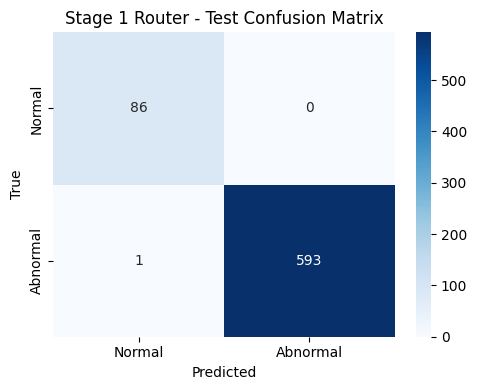


✅ Stage 1 Router evaluation saved
Metrics JSON: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/stage1_router_resnet18_val_test_metrics.json
Validation report: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/stage1_router_resnet18_val_classification_report.csv
Test report: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/stage1_router_resnet18_test_classification_report.csv
Validation CM: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/confusion_matrices/stage1_router_resnet18_val_confusion_matrix.png
Test CM: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/confusion_matrices/stage1_router_resnet18_test_confusion_matrix.png

✅ Cell 8 complete


In [ ]:
# ============================================================
# Cell 8: Evaluate Stage 1 Router on Validation and Test Sets
# ============================================================

import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report, confusion_matrix

set_seed(SEED)

ROUTER_EVAL_RESULTS_PATH = os.path.join(
    METRICS_DIR,
    "stage1_router_resnet18_val_test_metrics.json"
)

ROUTER_VAL_REPORT_PATH = os.path.join(
    METRICS_DIR,
    "stage1_router_resnet18_val_classification_report.csv"
)

ROUTER_TEST_REPORT_PATH = os.path.join(
    METRICS_DIR,
    "stage1_router_resnet18_test_classification_report.csv"
)

ROUTER_VAL_CM_PATH = os.path.join(
    CM_DIR,
    "stage1_router_resnet18_val_confusion_matrix.png"
)

ROUTER_TEST_CM_PATH = os.path.join(
    CM_DIR,
    "stage1_router_resnet18_test_confusion_matrix.png"
)

binary_class_names = ["Normal", "Abnormal"]

# -------------------------
# Evaluate validation
# -------------------------

val_metrics, y_val_true, y_val_pred = evaluate_model(
    router,
    router_val_loader,
    criterion=router_criterion
)

# -------------------------
# Evaluate test
# -------------------------

test_metrics, y_test_true, y_test_pred = evaluate_model(
    router,
    router_test_loader,
    criterion=router_criterion
)

# -------------------------
# Print metrics
# -------------------------

print("================ Stage 1 Router Validation Metrics ================")
for k, v in val_metrics.items():
    print(f"{k}: {v:.4f}")

print("\n================ Stage 1 Router Test Metrics ================")
for k, v in test_metrics.items():
    print(f"{k}: {v:.4f}")

# -------------------------
# Classification reports
# -------------------------

val_report_dict = classification_report(
    y_val_true,
    y_val_pred,
    target_names=binary_class_names,
    output_dict=True,
    zero_division=0
)

test_report_dict = classification_report(
    y_test_true,
    y_test_pred,
    target_names=binary_class_names,
    output_dict=True,
    zero_division=0
)

val_report_df = pd.DataFrame(val_report_dict).transpose()
test_report_df = pd.DataFrame(test_report_dict).transpose()

val_report_df.to_csv(ROUTER_VAL_REPORT_PATH)
test_report_df.to_csv(ROUTER_TEST_REPORT_PATH)

print("\n================ Validation Classification Report ================")
display(val_report_df)

print("\n================ Test Classification Report ================")
display(test_report_df)

# -------------------------
# Confusion matrix plotting helper
# -------------------------

def plot_confusion_matrix(y_true, y_pred, class_names, title, save_path):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(title)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

    return cm

val_cm = plot_confusion_matrix(
    y_val_true,
    y_val_pred,
    binary_class_names,
    "Stage 1 Router - Validation Confusion Matrix",
    ROUTER_VAL_CM_PATH
)

test_cm = plot_confusion_matrix(
    y_test_true,
    y_test_pred,
    binary_class_names,
    "Stage 1 Router - Test Confusion Matrix",
    ROUTER_TEST_CM_PATH
)

# -------------------------
# Save summary metrics
# -------------------------

router_eval_summary = {
    "model": "Stage1_Router_ResNet18",
    "task": "Normal vs Abnormal",
    "checkpoint": ROUTER_BEST_PATH,
    "seed": SEED,
    "validation_metrics": val_metrics,
    "test_metrics": test_metrics,
    "validation_confusion_matrix": val_cm.tolist(),
    "test_confusion_matrix": test_cm.tolist(),
    "class_names": binary_class_names
}

with open(ROUTER_EVAL_RESULTS_PATH, "w") as f:
    json.dump(router_eval_summary, f, indent=4)

print("\n✅ Stage 1 Router evaluation saved")
print(f"Metrics JSON: {ROUTER_EVAL_RESULTS_PATH}")
print(f"Validation report: {ROUTER_VAL_REPORT_PATH}")
print(f"Test report: {ROUTER_TEST_REPORT_PATH}")
print(f"Validation CM: {ROUTER_VAL_CM_PATH}")
print(f"Test CM: {ROUTER_TEST_CM_PATH}")

print("\n✅ Cell 8 complete")

## 9. Stage 2 Expert Training: 14-Class Abnormal Tumor Classification

This section trains the Stage 2 expert using EfficientNetB0. Normal images are removed from this stage, making the hierarchy functionally meaningful. The expert only learns to distinguish among the 14 abnormal tumor subtypes.

The model uses weighted sampling, class-weighted cross-entropy, label smoothing, early stopping, gradient clipping, and checkpoint saving.

In [ ]:
# ============================================================
# Cell 9: Stage 2 Expert - EfficientNetB0 Abnormal-Only Classifier
# Normal class is removed from Stage 2.
# ============================================================

import os
import torch
import torch.nn as nn
from torchvision import models
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau

set_seed(SEED)

# -------------------------
# Paths
# -------------------------

EXPERT_BEST_PATH = os.path.join(
    EXPERT_CKPT_DIR,
    "best_stage2_expert_efficientnetb0_14class_abnormal_only.pth"
)

EXPERT_HISTORY_PATH = os.path.join(
    METRICS_DIR,
    "stage2_expert_efficientnetb0_14class_abnormal_only_training_history.csv"
)

# -------------------------
# Stage 2 Expert Model
# -------------------------

class ExpertEfficientNetB0AbnormalOnly(nn.Module):
    def __init__(self, num_classes=14, dropout=0.4):
        super().__init__()

        weights = models.EfficientNet_B0_Weights.IMAGENET1K_V1
        self.backbone = models.efficientnet_b0(weights=weights)

        in_features = self.backbone.classifier[1].in_features

        self.backbone.classifier = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(in_features, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        return self.backbone(x)


expert = ExpertEfficientNetB0AbnormalOnly(
    num_classes=ABNORMAL_NUM_CLASSES,
    dropout=0.4
).to(device)

if torch.cuda.device_count() > 1:
    expert = nn.DataParallel(expert)
    print(f"✅ Using {torch.cuda.device_count()} GPUs for Stage 2 Expert")

print("✅ Stage 2 Expert ready")
print("Backbone: EfficientNetB0")
print("Task: 14-class abnormal tumor subtype classification")
print(f"Classes: {ABNORMAL_NUM_CLASSES}")
print(f"Parameters: {sum(p.numel() for p in expert.parameters()):,}")

# -------------------------
# Loss, optimizer, scheduler
# -------------------------

expert_class_weights = get_class_weights(
    expert_train_df["expert_label"].values,
    num_classes=ABNORMAL_NUM_CLASSES
)

print("\nExpert class weights:")
for cls_name, weight in zip(ABNORMAL_CLASS_NAMES, expert_class_weights.detach().cpu().numpy()):
    print(f"{cls_name:20s}: {weight:.4f}")

expert_criterion = nn.CrossEntropyLoss(
    weight=expert_class_weights,
    label_smoothing=0.05
)

expert_optimizer = AdamW(
    expert.parameters(),
    lr=1e-4,
    weight_decay=1e-4
)

expert_scheduler = ReduceLROnPlateau(
    expert_optimizer,
    mode="max",
    factor=0.5,
    patience=3,
    min_lr=1e-7
)

# -------------------------
# Train or load existing checkpoint
# -------------------------

if os.path.exists(EXPERT_BEST_PATH):
    print("\n✅ Existing Stage 2 abnormal-only checkpoint found.")
    print("Loading from Drive instead of retraining.")
    print(EXPERT_BEST_PATH)

    expert = load_model_weights(expert, EXPERT_BEST_PATH)

    if os.path.exists(EXPERT_HISTORY_PATH):
        expert_history = pd.read_csv(EXPERT_HISTORY_PATH)
        display(expert_history.tail())

else:
    expert, expert_history = train_model(
        model=expert,
        train_loader=expert_train_loader,
        val_loader=expert_val_loader,
        criterion=expert_criterion,
        optimizer=expert_optimizer,
        scheduler=expert_scheduler,
        epochs=40,
        checkpoint_path=EXPERT_BEST_PATH,
        history_path=EXPERT_HISTORY_PATH,
        monitor="macro_f1",
        mode="max",
        early_stopping=True,
        patience=7,
        grad_clip=1.0,
        use_amp=True,
        scheduler_step_on="val_metric",
        model_name="Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly"
    )

# -------------------------
# Load best expert after training
# -------------------------

expert = load_model_weights(expert, EXPERT_BEST_PATH)
expert = expert.to(device)

print("\n✅ Best Stage 2 abnormal-only expert loaded")
print(f"Checkpoint: {EXPERT_BEST_PATH}")
print("✅ Cell 9 complete")
print("Next cell should evaluate Stage 2 on abnormal-only validation/test sets.")

✅ Stage 2 Expert ready
Backbone: EfficientNetB0
Task: 14-class abnormal tumor subtype classification
Classes: 14
Parameters: 4,670,602

Expert class weights:
Astrocitoma         : 0.4858
Carcinoma           : 1.1585
Ependimoma          : 1.8470
Ganglioglioma       : 8.1577
Germinoma           : 3.1578
Glioblastoma        : 1.2237
Granuloma           : 4.0789
Meduloblastoma      : 2.2248
Meningioma          : 0.3241
Neurocitoma         : 0.6357
Oligodendroglioma   : 1.1866
Papiloma            : 1.1124
Schwannoma          : 0.6118
Tuberculoma         : 1.8128

🚀 Training Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly
Epochs: 40
Monitor: val_macro_f1 | Mode: max
AMP enabled: True
Early stopping: True


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 1/40: 100%|██████████| 172/172 [00:53<00:00,  3.23it/s, loss=2.98]


Epoch 001 | Train Loss: 1.8707 | Train Acc: 0.2050 | Train Macro-F1: 0.1314 | Val Loss: 2.7294 | Val Acc: 0.1538 | Val Macro-F1: 0.1611
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.1611


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 2/40: 100%|██████████| 172/172 [00:41<00:00,  4.15it/s, loss=1.21]


Epoch 002 | Train Loss: 1.2236 | Train Acc: 0.4115 | Train Macro-F1: 0.3220 | Val Loss: 2.5322 | Val Acc: 0.2893 | Val Macro-F1: 0.3238
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.3238


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 3/40: 100%|██████████| 172/172 [00:40<00:00,  4.25it/s, loss=0.465]


Epoch 003 | Train Loss: 0.8466 | Train Acc: 0.5961 | Train Macro-F1: 0.5181 | Val Loss: 2.0635 | Val Acc: 0.4381 | Val Macro-F1: 0.4918
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.4918


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 4/40: 100%|██████████| 172/172 [00:39<00:00,  4.40it/s, loss=0.362]


Epoch 004 | Train Loss: 0.6671 | Train Acc: 0.7202 | Train Macro-F1: 0.6608 | Val Loss: 1.7715 | Val Acc: 0.5234 | Val Macro-F1: 0.5580
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.5580


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 5/40: 100%|██████████| 172/172 [00:38<00:00,  4.45it/s, loss=0.511]


Epoch 005 | Train Loss: 0.5697 | Train Acc: 0.7713 | Train Macro-F1: 0.7180 | Val Loss: 1.6251 | Val Acc: 0.5719 | Val Macro-F1: 0.6264
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.6264


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 6/40: 100%|██████████| 172/172 [00:38<00:00,  4.42it/s, loss=0.594]


Epoch 006 | Train Loss: 0.5165 | Train Acc: 0.8172 | Train Macro-F1: 0.7784 | Val Loss: 1.5137 | Val Acc: 0.6104 | Val Macro-F1: 0.6491
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.6491


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 7/40: 100%|██████████| 172/172 [00:40<00:00,  4.30it/s, loss=0.257]


Epoch 007 | Train Loss: 0.4793 | Train Acc: 0.8457 | Train Macro-F1: 0.8123 | Val Loss: 1.3620 | Val Acc: 0.6890 | Val Macro-F1: 0.7407
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.7407


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 8/40: 100%|██████████| 172/172 [00:40<00:00,  4.26it/s, loss=0.395]


Epoch 008 | Train Loss: 0.4548 | Train Acc: 0.8719 | Train Macro-F1: 0.8560 | Val Loss: 1.2538 | Val Acc: 0.7759 | Val Macro-F1: 0.8193
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.8193


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 9/40: 100%|██████████| 172/172 [00:40<00:00,  4.24it/s, loss=1.01]


Epoch 009 | Train Loss: 0.4328 | Train Acc: 0.8931 | Train Macro-F1: 0.8858 | Val Loss: 1.1805 | Val Acc: 0.8278 | Val Macro-F1: 0.8509
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.8509


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 10/40: 100%|██████████| 172/172 [00:41<00:00,  4.19it/s, loss=0.587]


Epoch 010 | Train Loss: 0.3960 | Train Acc: 0.9143 | Train Macro-F1: 0.9069 | Val Loss: 1.0958 | Val Acc: 0.8679 | Val Macro-F1: 0.8852
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.8852


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 11/40: 100%|██████████| 172/172 [00:41<00:00,  4.19it/s, loss=0.849]


Epoch 011 | Train Loss: 0.3926 | Train Acc: 0.9296 | Train Macro-F1: 0.9274 | Val Loss: 1.0954 | Val Acc: 0.8512 | Val Macro-F1: 0.8662
Early stopping patience: 1/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 12/40: 100%|██████████| 172/172 [00:39<00:00,  4.37it/s, loss=0.27]


Epoch 012 | Train Loss: 0.3680 | Train Acc: 0.9405 | Train Macro-F1: 0.9367 | Val Loss: 1.0537 | Val Acc: 0.8746 | Val Macro-F1: 0.8943
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.8943


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 13/40: 100%|██████████| 172/172 [00:40<00:00,  4.25it/s, loss=0.181]


Epoch 013 | Train Loss: 0.3657 | Train Acc: 0.9504 | Train Macro-F1: 0.9474 | Val Loss: 1.0098 | Val Acc: 0.8980 | Val Macro-F1: 0.9129
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9129


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 14/40: 100%|██████████| 172/172 [00:40<00:00,  4.23it/s, loss=0.988]


Epoch 014 | Train Loss: 0.3561 | Train Acc: 0.9602 | Train Macro-F1: 0.9586 | Val Loss: 1.0008 | Val Acc: 0.9097 | Val Macro-F1: 0.9236
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9236


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 15/40: 100%|██████████| 172/172 [00:40<00:00,  4.26it/s, loss=0.608]


Epoch 015 | Train Loss: 0.3473 | Train Acc: 0.9599 | Train Macro-F1: 0.9585 | Val Loss: 1.0175 | Val Acc: 0.9047 | Val Macro-F1: 0.9124
Early stopping patience: 1/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 16/40: 100%|██████████| 172/172 [00:39<00:00,  4.38it/s, loss=0.226]


Epoch 016 | Train Loss: 0.3509 | Train Acc: 0.9694 | Train Macro-F1: 0.9685 | Val Loss: 0.9822 | Val Acc: 0.9197 | Val Macro-F1: 0.9251
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9251


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 17/40: 100%|██████████| 172/172 [00:39<00:00,  4.33it/s, loss=0.841]


Epoch 017 | Train Loss: 0.3406 | Train Acc: 0.9683 | Train Macro-F1: 0.9666 | Val Loss: 0.9446 | Val Acc: 0.9197 | Val Macro-F1: 0.9289
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9289


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 18/40: 100%|██████████| 172/172 [00:39<00:00,  4.33it/s, loss=0.899]


Epoch 018 | Train Loss: 0.3383 | Train Acc: 0.9759 | Train Macro-F1: 0.9761 | Val Loss: 0.9777 | Val Acc: 0.9164 | Val Macro-F1: 0.9316
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9316


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 19/40: 100%|██████████| 172/172 [00:39<00:00,  4.30it/s, loss=0.185]


Epoch 019 | Train Loss: 0.3351 | Train Acc: 0.9785 | Train Macro-F1: 0.9781 | Val Loss: 0.9109 | Val Acc: 0.9348 | Val Macro-F1: 0.9381
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9381


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 20/40: 100%|██████████| 172/172 [00:39<00:00,  4.32it/s, loss=0.382]


Epoch 020 | Train Loss: 0.3406 | Train Acc: 0.9799 | Train Macro-F1: 0.9800 | Val Loss: 0.9138 | Val Acc: 0.9247 | Val Macro-F1: 0.9326
Early stopping patience: 1/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 21/40: 100%|██████████| 172/172 [00:39<00:00,  4.40it/s, loss=0.576]


Epoch 021 | Train Loss: 0.3291 | Train Acc: 0.9781 | Train Macro-F1: 0.9779 | Val Loss: 0.9043 | Val Acc: 0.9348 | Val Macro-F1: 0.9406
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9406


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 22/40: 100%|██████████| 172/172 [00:41<00:00,  4.19it/s, loss=1.45]


Epoch 022 | Train Loss: 0.3256 | Train Acc: 0.9814 | Train Macro-F1: 0.9811 | Val Loss: 0.8962 | Val Acc: 0.9398 | Val Macro-F1: 0.9311
Early stopping patience: 1/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 23/40: 100%|██████████| 172/172 [00:38<00:00,  4.42it/s, loss=0.674]


Epoch 023 | Train Loss: 0.3307 | Train Acc: 0.9821 | Train Macro-F1: 0.9822 | Val Loss: 0.8812 | Val Acc: 0.9482 | Val Macro-F1: 0.9501
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9501


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 24/40: 100%|██████████| 172/172 [00:40<00:00,  4.22it/s, loss=0.204]


Epoch 024 | Train Loss: 0.3228 | Train Acc: 0.9821 | Train Macro-F1: 0.9821 | Val Loss: 0.8959 | Val Acc: 0.9415 | Val Macro-F1: 0.9522
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9522


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 25/40: 100%|██████████| 172/172 [00:41<00:00,  4.10it/s, loss=0.754]


Epoch 025 | Train Loss: 0.3123 | Train Acc: 0.9861 | Train Macro-F1: 0.9861 | Val Loss: 0.8794 | Val Acc: 0.9448 | Val Macro-F1: 0.9509
Early stopping patience: 1/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 26/40: 100%|██████████| 172/172 [00:39<00:00,  4.35it/s, loss=0.25]


Epoch 026 | Train Loss: 0.3090 | Train Acc: 0.9839 | Train Macro-F1: 0.9832 | Val Loss: 0.8437 | Val Acc: 0.9582 | Val Macro-F1: 0.9614
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9614


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 27/40: 100%|██████████| 172/172 [00:40<00:00,  4.20it/s, loss=0.24]


Epoch 027 | Train Loss: 0.3132 | Train Acc: 0.9876 | Train Macro-F1: 0.9874 | Val Loss: 0.8678 | Val Acc: 0.9448 | Val Macro-F1: 0.9493
Early stopping patience: 1/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 28/40: 100%|██████████| 172/172 [00:39<00:00,  4.37it/s, loss=0.507]


Epoch 028 | Train Loss: 0.3154 | Train Acc: 0.9887 | Train Macro-F1: 0.9884 | Val Loss: 0.8607 | Val Acc: 0.9548 | Val Macro-F1: 0.9527
Early stopping patience: 2/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 29/40: 100%|██████████| 172/172 [00:39<00:00,  4.39it/s, loss=0.216]


Epoch 029 | Train Loss: 0.3172 | Train Acc: 0.9909 | Train Macro-F1: 0.9909 | Val Loss: 0.8488 | Val Acc: 0.9582 | Val Macro-F1: 0.9506
Early stopping patience: 3/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 30/40: 100%|██████████| 172/172 [00:38<00:00,  4.43it/s, loss=0.538]


Epoch 030 | Train Loss: 0.3076 | Train Acc: 0.9916 | Train Macro-F1: 0.9915 | Val Loss: 0.8272 | Val Acc: 0.9615 | Val Macro-F1: 0.9689
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9689


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 31/40: 100%|██████████| 172/172 [00:39<00:00,  4.31it/s, loss=0.481]


Epoch 031 | Train Loss: 0.3169 | Train Acc: 0.9898 | Train Macro-F1: 0.9898 | Val Loss: 0.8413 | Val Acc: 0.9599 | Val Macro-F1: 0.9638
Early stopping patience: 1/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 32/40: 100%|██████████| 172/172 [00:38<00:00,  4.46it/s, loss=0.403]


Epoch 032 | Train Loss: 0.3139 | Train Acc: 0.9938 | Train Macro-F1: 0.9938 | Val Loss: 0.8281 | Val Acc: 0.9632 | Val Macro-F1: 0.9699
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9699


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 33/40: 100%|██████████| 172/172 [00:39<00:00,  4.33it/s, loss=0.537]


Epoch 033 | Train Loss: 0.3114 | Train Acc: 0.9927 | Train Macro-F1: 0.9928 | Val Loss: 0.8436 | Val Acc: 0.9599 | Val Macro-F1: 0.9612
Early stopping patience: 1/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 34/40: 100%|██████████| 172/172 [00:38<00:00,  4.50it/s, loss=0.816]


Epoch 034 | Train Loss: 0.3119 | Train Acc: 0.9901 | Train Macro-F1: 0.9901 | Val Loss: 0.8338 | Val Acc: 0.9649 | Val Macro-F1: 0.9669
Early stopping patience: 2/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 35/40: 100%|██████████| 172/172 [00:37<00:00,  4.55it/s, loss=0.292]


Epoch 035 | Train Loss: 0.2965 | Train Acc: 0.9945 | Train Macro-F1: 0.9945 | Val Loss: 0.8233 | Val Acc: 0.9666 | Val Macro-F1: 0.9682
Early stopping patience: 3/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 36/40: 100%|██████████| 172/172 [00:37<00:00,  4.61it/s, loss=0.599]


Epoch 036 | Train Loss: 0.2983 | Train Acc: 0.9945 | Train Macro-F1: 0.9946 | Val Loss: 0.8239 | Val Acc: 0.9615 | Val Macro-F1: 0.9675
Early stopping patience: 4/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 37/40: 100%|██████████| 172/172 [00:36<00:00,  4.65it/s, loss=0.551]


Epoch 037 | Train Loss: 0.3175 | Train Acc: 0.9949 | Train Macro-F1: 0.9948 | Val Loss: 0.8033 | Val Acc: 0.9716 | Val Macro-F1: 0.9745
💾 Best Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly saved | Val macro_f1: 0.9745


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 38/40: 100%|██████████| 172/172 [00:37<00:00,  4.54it/s, loss=0.276]


Epoch 038 | Train Loss: 0.3004 | Train Acc: 0.9960 | Train Macro-F1: 0.9959 | Val Loss: 0.8248 | Val Acc: 0.9599 | Val Macro-F1: 0.9639
Early stopping patience: 1/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 39/40: 100%|██████████| 172/172 [00:37<00:00,  4.64it/s, loss=0.339]


Epoch 039 | Train Loss: 0.2973 | Train Acc: 0.9971 | Train Macro-F1: 0.9971 | Val Loss: 0.8055 | Val Acc: 0.9716 | Val Macro-F1: 0.9714
Early stopping patience: 2/7


Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly Epoch 40/40: 100%|██████████| 172/172 [00:37<00:00,  4.55it/s, loss=0.552]


Epoch 040 | Train Loss: 0.2924 | Train Acc: 0.9971 | Train Macro-F1: 0.9971 | Val Loss: 0.7955 | Val Acc: 0.9732 | Val Macro-F1: 0.9727
Early stopping patience: 3/7

✅ Training complete for Stage2_Expert_EfficientNetB0_14Class_AbnormalOnly
Best epoch: 37
Best val_macro_f1: 0.9745

✅ Best Stage 2 abnormal-only expert loaded
Checkpoint: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/checkpoints/expert/best_stage2_expert_efficientnetb0_14class_abnormal_only.pth
✅ Cell 9 complete
Next cell should evaluate Stage 2 on abnormal-only validation/test sets.


## 10. Stage 2 Expert Evaluation

This section evaluates the abnormal-only Stage 2 expert on abnormal validation and test samples. Since Normal is removed from Stage 2, evaluation is performed only over the 14 abnormal tumor classes using local expert labels.

================ Stage 2 Expert Evaluation Setup ================
Task: 14-class abnormal tumor subtype classification
Number of abnormal classes: 14
Classes:
00: Astrocitoma
01: Carcinoma
02: Ependimoma
03: Ganglioglioma
04: Germinoma
05: Glioblastoma
06: Granuloma
07: Meduloblastoma
08: Meningioma
09: Neurocitoma
10: Oligodendroglioma
11: Papiloma
12: Schwannoma
13: Tuberculoma

================ Stage 2 Expert Validation Metrics ================
accuracy: 0.9716
macro_precision: 0.9711
macro_recall: 0.9785
macro_f1: 0.9745
weighted_f1: 0.9715
loss: 0.8033

================ Stage 2 Expert Test Metrics ================
accuracy: 0.9596
macro_precision: 0.9371
macro_recall: 0.9631
macro_f1: 0.9482
weighted_f1: 0.9599
loss: 0.8530

================ Validation Classification Report ================


,precision,recall,f1-score,support
Astrocitoma,0.966667,0.956044,0.961326,91.000000
Carcinoma,1.000000,0.945946,0.972222,37.000000
Ependimoma,0.960000,1.000000,0.979592,24.000000
Ganglioglioma,1.000000,1.000000,1.000000,8.000000
Germinoma,0.958333,1.000000,0.978723,23.000000
Glioblastoma,1.000000,1.000000,1.000000,25.000000
Granuloma,0.923077,0.923077,0.923077,13.000000
Meduloblastoma,1.000000,1.000000,1.000000,22.000000
Meningioma,0.977612,0.956204,0.966790,137.000000
Neurocitoma,0.960526,0.986486,0.973333,74.000000



================ Test Classification Report ================


,precision,recall,f1-score,support
Astrocitoma,0.941860,0.952941,0.947368,85.000000
Carcinoma,1.000000,0.911111,0.953488,45.000000
Ependimoma,0.952381,1.000000,0.975610,20.000000
Ganglioglioma,0.750000,1.000000,0.857143,6.000000
Germinoma,0.882353,1.000000,0.937500,15.000000
Glioblastoma,1.000000,1.000000,1.000000,19.000000
Granuloma,0.777778,0.823529,0.800000,17.000000
Meduloblastoma,0.952381,0.952381,0.952381,21.000000
Meningioma,0.976744,0.947368,0.961832,133.000000
Neurocitoma,0.973684,0.986667,0.980132,75.000000


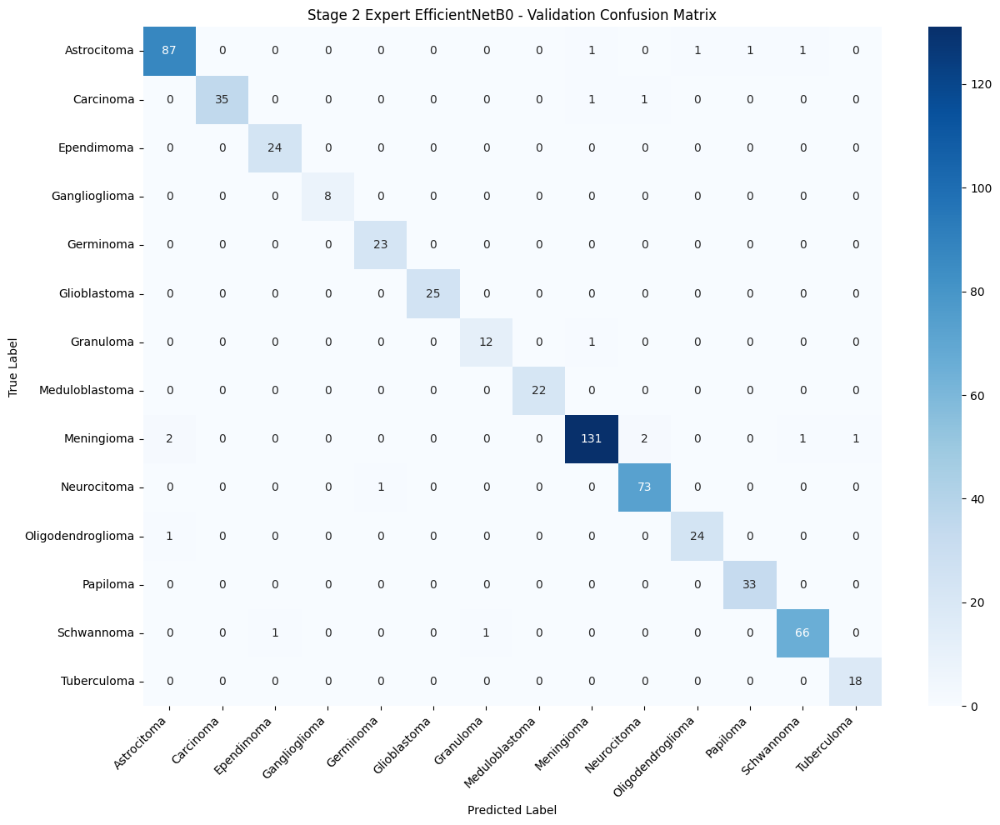

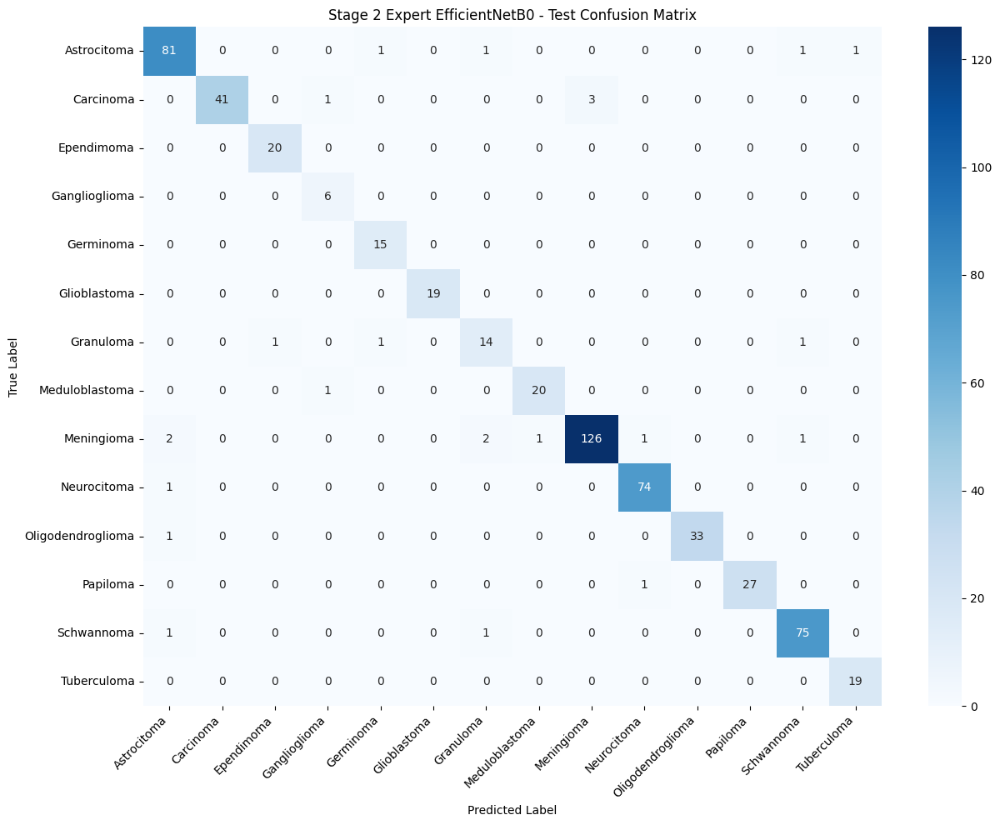


✅ Stage 2 Expert evaluation saved
Metrics JSON: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/stage2_expert_efficientnetb0_14class_abnormal_only_val_test_metrics.json
Validation report: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/stage2_expert_efficientnetb0_14class_abnormal_only_val_classification_report.csv
Test report: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/stage2_expert_efficientnetb0_14class_abnormal_only_test_classification_report.csv
Validation CM: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/confusion_matrices/stage2_expert_efficientnetb0_14class_abnormal_only_val_confusion_matrix.png
Test CM: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/confusion_matrices/stage2_expert_efficientnetb0_14class_abnormal_only_test_confusion_matrix.png
Test predictions CSV: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/stage2_expert_efficientnetb0_1

In [ ]:
# ============================================================
# Cell 10: Evaluate Stage 2 Expert on Validation and Test Sets
# Stage 2 is abnormal-only: 14 tumor classes, Normal removed
# ============================================================

import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report, confusion_matrix

set_seed(SEED)

# -------------------------
# Paths
# -------------------------

EXPERT_EVAL_RESULTS_PATH = os.path.join(
    METRICS_DIR,
    "stage2_expert_efficientnetb0_14class_abnormal_only_val_test_metrics.json"
)

EXPERT_VAL_REPORT_PATH = os.path.join(
    METRICS_DIR,
    "stage2_expert_efficientnetb0_14class_abnormal_only_val_classification_report.csv"
)

EXPERT_TEST_REPORT_PATH = os.path.join(
    METRICS_DIR,
    "stage2_expert_efficientnetb0_14class_abnormal_only_test_classification_report.csv"
)

EXPERT_VAL_CM_PATH = os.path.join(
    CM_DIR,
    "stage2_expert_efficientnetb0_14class_abnormal_only_val_confusion_matrix.png"
)

EXPERT_TEST_CM_PATH = os.path.join(
    CM_DIR,
    "stage2_expert_efficientnetb0_14class_abnormal_only_test_confusion_matrix.png"
)

# -------------------------
# Safety checks
# -------------------------

assert ABNORMAL_NUM_CLASSES == 14, f"Expected 14 abnormal classes, got {ABNORMAL_NUM_CLASSES}"
assert NORMAL_CLASS not in ABNORMAL_CLASS_NAMES, "Normal is still present in Stage 2 class names."

print("================ Stage 2 Expert Evaluation Setup ================")
print("Task: 14-class abnormal tumor subtype classification")
print(f"Number of abnormal classes: {ABNORMAL_NUM_CLASSES}")
print("Classes:")
for i, cls_name in enumerate(ABNORMAL_CLASS_NAMES):
    print(f"{i:02d}: {cls_name}")

# -------------------------
# Evaluate validation
# -------------------------

val_metrics, y_val_true, y_val_pred = evaluate_model(
    expert,
    expert_val_loader,
    criterion=expert_criterion
)

# -------------------------
# Evaluate test
# -------------------------

test_metrics, y_test_true, y_test_pred = evaluate_model(
    expert,
    expert_test_loader,
    criterion=expert_criterion
)

# -------------------------
# Print metrics
# -------------------------

print("\n================ Stage 2 Expert Validation Metrics ================")
for k, v in val_metrics.items():
    print(f"{k}: {v:.4f}")

print("\n================ Stage 2 Expert Test Metrics ================")
for k, v in test_metrics.items():
    print(f"{k}: {v:.4f}")

# -------------------------
# Classification reports
# Local labels: 0 to 13
# -------------------------

val_report_dict = classification_report(
    y_val_true,
    y_val_pred,
    labels=list(range(ABNORMAL_NUM_CLASSES)),
    target_names=ABNORMAL_CLASS_NAMES,
    output_dict=True,
    zero_division=0
)

test_report_dict = classification_report(
    y_test_true,
    y_test_pred,
    labels=list(range(ABNORMAL_NUM_CLASSES)),
    target_names=ABNORMAL_CLASS_NAMES,
    output_dict=True,
    zero_division=0
)

val_report_df = pd.DataFrame(val_report_dict).transpose()
test_report_df = pd.DataFrame(test_report_dict).transpose()

val_report_df.to_csv(EXPERT_VAL_REPORT_PATH)
test_report_df.to_csv(EXPERT_TEST_REPORT_PATH)

print("\n================ Validation Classification Report ================")
display(val_report_df)

print("\n================ Test Classification Report ================")
display(test_report_df)

# -------------------------
# Confusion matrix helper
# -------------------------

def plot_abnormal_confusion_matrix(y_true, y_pred, class_names, title, save_path):
    cm = confusion_matrix(
        y_true,
        y_pred,
        labels=list(range(len(class_names)))
    )

    plt.figure(figsize=(13, 10))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(title)
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

    return cm

val_cm = plot_abnormal_confusion_matrix(
    y_val_true,
    y_val_pred,
    ABNORMAL_CLASS_NAMES,
    "Stage 2 Expert EfficientNetB0 - Validation Confusion Matrix",
    EXPERT_VAL_CM_PATH
)

test_cm = plot_abnormal_confusion_matrix(
    y_test_true,
    y_test_pred,
    ABNORMAL_CLASS_NAMES,
    "Stage 2 Expert EfficientNetB0 - Test Confusion Matrix",
    EXPERT_TEST_CM_PATH
)

# -------------------------
# Save prediction-level details with local + global labels
# -------------------------

stage2_test_predictions_df = expert_test_df.copy()

stage2_test_predictions_df["true_local_label"] = y_test_true
stage2_test_predictions_df["pred_local_label"] = y_test_pred

stage2_test_predictions_df["true_class"] = [
    abnormal_local_idx_to_class[int(i)] for i in y_test_true
]

stage2_test_predictions_df["pred_class"] = [
    abnormal_local_idx_to_class[int(i)] for i in y_test_pred
]

stage2_test_predictions_df["true_global_label"] = [
    abnormal_local_to_global[int(i)] for i in y_test_true
]

stage2_test_predictions_df["pred_global_label"] = [
    abnormal_local_to_global[int(i)] for i in y_test_pred
]

stage2_test_predictions_df["correct"] = (
    stage2_test_predictions_df["true_local_label"] ==
    stage2_test_predictions_df["pred_local_label"]
)

STAGE2_TEST_PREDICTIONS_PATH = os.path.join(
    METRICS_DIR,
    "stage2_expert_efficientnetb0_14class_abnormal_only_test_predictions.csv"
)

stage2_test_predictions_df.to_csv(STAGE2_TEST_PREDICTIONS_PATH, index=False)

# -------------------------
# Save summary metrics
# -------------------------

expert_eval_summary = {
    "model": "Stage2_Expert_EfficientNetB0_AbnormalOnly",
    "task": "14-class abnormal tumor subtype classification",
    "normal_removed_from_stage2": True,
    "checkpoint": EXPERT_BEST_PATH,
    "seed": SEED,
    "validation_metrics": val_metrics,
    "test_metrics": test_metrics,
    "validation_confusion_matrix": val_cm.tolist(),
    "test_confusion_matrix": test_cm.tolist(),
    "abnormal_class_names": ABNORMAL_CLASS_NAMES,
    "abnormal_num_classes": ABNORMAL_NUM_CLASSES,
    "normal_class": NORMAL_CLASS,
    "normal_global_index": int(NORMAL_IDX),
    "abnormal_local_to_global": {
        int(k): int(v) for k, v in abnormal_local_to_global.items()
    },
    "abnormal_global_to_local": {
        int(k): int(v) for k, v in abnormal_global_to_local.items()
    }
}

with open(EXPERT_EVAL_RESULTS_PATH, "w") as f:
    json.dump(expert_eval_summary, f, indent=4)

print("\n✅ Stage 2 Expert evaluation saved")
print(f"Metrics JSON: {EXPERT_EVAL_RESULTS_PATH}")
print(f"Validation report: {EXPERT_VAL_REPORT_PATH}")
print(f"Test report: {EXPERT_TEST_REPORT_PATH}")
print(f"Validation CM: {EXPERT_VAL_CM_PATH}")
print(f"Test CM: {EXPERT_TEST_CM_PATH}")
print(f"Test predictions CSV: {STAGE2_TEST_PREDICTIONS_PATH}")

print("\n✅ Cell 10 complete")
print("Next cell must evaluate the full hierarchical pipeline with local-to-global label mapping.")

## 11. Full Hierarchical Pipeline Evaluation

This section evaluates the complete two-stage pipeline on the full 15-class test set.

The final decision rule is:

1. If the router predicts Normal, the final output is Normal.
2. If the router predicts Abnormal, the image is passed to the Stage 2 expert.
3. The Stage 2 local abnormal prediction is mapped back to the original 15-class label space.

This evaluates the final proposed model exactly as it would be used during inference.

================ Full Pipeline Evaluation Setup ================
Stage 1: ResNet18 router, Normal vs Abnormal
Stage 2: EfficientNetB0 abnormal-only expert, 14 classes
Normal class: Normal | Global index: 10


Evaluating Full Pipeline: 100%|██████████| 43/43 [00:11<00:00,  3.81it/s]



================ Full Hierarchical Pipeline Test Metrics ================
accuracy: 0.9647
macro_precision: 0.9412
macro_recall: 0.9655
macro_f1: 0.9516
weighted_f1: 0.9650

================ Full Pipeline Test Classification Report ================


,precision,recall,f1-score,support
Astrocitoma,0.952941,0.952941,0.952941,85.000000
Carcinoma,1.000000,0.911111,0.953488,45.000000
Ependimoma,0.952381,1.000000,0.975610,20.000000
Ganglioglioma,0.750000,1.000000,0.857143,6.000000
Germinoma,0.882353,1.000000,0.937500,15.000000
Glioblastoma,1.000000,1.000000,1.000000,19.000000
Granuloma,0.777778,0.823529,0.800000,17.000000
Meduloblastoma,0.952381,0.952381,0.952381,21.000000
Meningioma,0.976744,0.947368,0.961832,133.000000
Neurocitoma,0.973684,0.986667,0.980132,75.000000


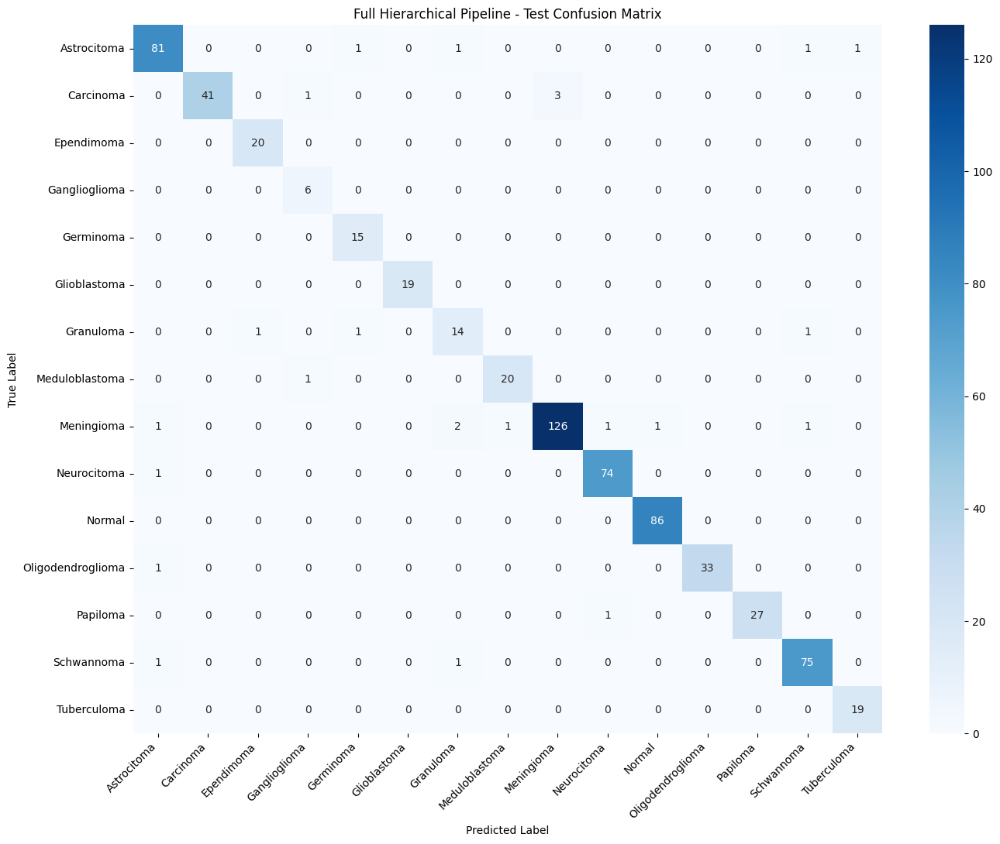


================ Router Performance Inside Pipeline ================
Router accuracy: 0.9985
Router macro-F1: 0.9967

✅ Full hierarchical pipeline evaluation saved
Metrics JSON: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/full_hierarchical_pipeline_14class_expert_test_metrics.json
Report CSV: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/full_hierarchical_pipeline_14class_expert_test_classification_report.csv
Confusion Matrix: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/confusion_matrices/full_hierarchical_pipeline_14class_expert_test_confusion_matrix.png
Predictions CSV: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/full_hierarchical_pipeline_14class_expert_test_predictions.csv

✅ Cell 11 complete
Send me the full pipeline metrics. Then we will update the final comparison table.


In [ ]:
# ============================================================
# Cell 11: Full Hierarchical Pipeline Evaluation
# Stage 1 Router + Stage 2 Abnormal-Only Expert
# ============================================================

import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

set_seed(SEED)

# -------------------------
# Output paths
# -------------------------

PIPELINE_METRICS_PATH = os.path.join(
    METRICS_DIR,
    "full_hierarchical_pipeline_14class_expert_test_metrics.json"
)

PIPELINE_REPORT_PATH = os.path.join(
    METRICS_DIR,
    "full_hierarchical_pipeline_14class_expert_test_classification_report.csv"
)

PIPELINE_CM_PATH = os.path.join(
    CM_DIR,
    "full_hierarchical_pipeline_14class_expert_test_confusion_matrix.png"
)

PIPELINE_PREDICTIONS_PATH = os.path.join(
    METRICS_DIR,
    "full_hierarchical_pipeline_14class_expert_test_predictions.csv"
)

# -------------------------
# Safety checks
# -------------------------

assert ABNORMAL_NUM_CLASSES == 14, f"Expected 14 abnormal classes, got {ABNORMAL_NUM_CLASSES}"
assert NORMAL_CLASS not in ABNORMAL_CLASS_NAMES, "Normal is still present in Stage 2 class list."

print("================ Full Pipeline Evaluation Setup ================")
print("Stage 1: ResNet18 router, Normal vs Abnormal")
print("Stage 2: EfficientNetB0 abnormal-only expert, 14 classes")
print(f"Normal class: {NORMAL_CLASS} | Global index: {NORMAL_IDX}")

# -------------------------
# Full pipeline prediction
# -------------------------

@torch.no_grad()
def evaluate_full_pipeline_abnormal_only(router_model, expert_model, dataloader):
    router_model.eval()
    expert_model.eval()

    all_true = []
    all_final_pred = []

    all_router_pred = []
    all_expert_local_pred = []
    all_expert_global_pred = []

    for images, labels in tqdm(dataloader, desc="Evaluating Full Pipeline"):
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        # Stage 1: Normal vs Abnormal
        router_outputs = router_model(images)
        router_preds = torch.argmax(router_outputs, dim=1)

        # Stage 2: 14-class abnormal-only expert
        expert_outputs = expert_model(images)
        expert_local_preds = torch.argmax(expert_outputs, dim=1)

        final_preds = []
        expert_global_preds = []

        for r_pred, local_pred in zip(router_preds, expert_local_preds):
            local_pred = int(local_pred.item())

            # Convert Stage 2 local abnormal label to original 15-class global label
            global_expert_pred = int(abnormal_local_to_global[local_pred])
            expert_global_preds.append(global_expert_pred)

            # Final hierarchical decision
            if int(r_pred.item()) == 0:
                # Router says Normal
                final_preds.append(int(NORMAL_IDX))
            else:
                # Router says Abnormal, use mapped Stage 2 prediction
                final_preds.append(global_expert_pred)

        all_true.extend(labels.detach().cpu().numpy())
        all_router_pred.extend(router_preds.detach().cpu().numpy())
        all_expert_local_pred.extend(expert_local_preds.detach().cpu().numpy())
        all_expert_global_pred.extend(expert_global_preds)
        all_final_pred.extend(final_preds)

    return (
        np.array(all_true),
        np.array(all_final_pred),
        np.array(all_router_pred),
        np.array(all_expert_local_pred),
        np.array(all_expert_global_pred)
    )


# IMPORTANT:
# Use pipeline_test_loader, not expert_test_loader.
# pipeline_test_loader contains all 15 original classes.
y_true, y_final_pred, y_router_pred, y_expert_local_pred, y_expert_global_pred = evaluate_full_pipeline_abnormal_only(
    router,
    expert,
    pipeline_test_loader
)

# -------------------------
# Metrics
# -------------------------

pipeline_metrics = {
    "accuracy": accuracy_score(y_true, y_final_pred),
    "macro_precision": precision_score(y_true, y_final_pred, average="macro", zero_division=0),
    "macro_recall": recall_score(y_true, y_final_pred, average="macro", zero_division=0),
    "macro_f1": f1_score(y_true, y_final_pred, average="macro", zero_division=0),
    "weighted_f1": f1_score(y_true, y_final_pred, average="weighted", zero_division=0)
}

print("\n================ Full Hierarchical Pipeline Test Metrics ================")
for k, v in pipeline_metrics.items():
    print(f"{k}: {v:.4f}")

# -------------------------
# Classification report
# -------------------------

pipeline_report_dict = classification_report(
    y_true,
    y_final_pred,
    labels=list(range(NUM_CLASSES)),
    target_names=CLASS_NAMES,
    output_dict=True,
    zero_division=0
)

pipeline_report_df = pd.DataFrame(pipeline_report_dict).transpose()
pipeline_report_df.to_csv(PIPELINE_REPORT_PATH)

print("\n================ Full Pipeline Test Classification Report ================")
display(pipeline_report_df)

# -------------------------
# Confusion matrix
# -------------------------

pipeline_cm = confusion_matrix(
    y_true,
    y_final_pred,
    labels=list(range(NUM_CLASSES))
)

plt.figure(figsize=(14, 11))
sns.heatmap(
    pipeline_cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=CLASS_NAMES,
    yticklabels=CLASS_NAMES
)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Full Hierarchical Pipeline - Test Confusion Matrix")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(PIPELINE_CM_PATH, dpi=300, bbox_inches="tight")
plt.show()

# -------------------------
# Save prediction-level details
# -------------------------

pipeline_predictions_df = test_df.copy()

pipeline_predictions_df["true_label"] = y_true
pipeline_predictions_df["true_class"] = [idx_to_class[int(i)] for i in y_true]

pipeline_predictions_df["router_pred_binary"] = y_router_pred
pipeline_predictions_df["router_pred_name"] = [
    "Normal" if int(p) == 0 else "Abnormal" for p in y_router_pred
]

pipeline_predictions_df["expert_pred_local_label"] = y_expert_local_pred
pipeline_predictions_df["expert_pred_global_label"] = y_expert_global_pred

pipeline_predictions_df["expert_pred_class"] = [
    idx_to_class[int(i)] for i in y_expert_global_pred
]

pipeline_predictions_df["final_pred_label"] = y_final_pred
pipeline_predictions_df["final_pred_class"] = [
    idx_to_class[int(i)] for i in y_final_pred
]

pipeline_predictions_df["correct"] = (
    pipeline_predictions_df["true_label"] ==
    pipeline_predictions_df["final_pred_label"]
)

# Helpful error flags
pipeline_predictions_df["router_correct_binary"] = (
    pipeline_predictions_df["binary_label"] ==
    pipeline_predictions_df["router_pred_binary"]
)

pipeline_predictions_df["used_expert"] = (
    pipeline_predictions_df["router_pred_binary"] == 1
)

pipeline_predictions_df.to_csv(PIPELINE_PREDICTIONS_PATH, index=False)

# -------------------------
# Router error analysis inside final pipeline
# -------------------------

router_true_binary = test_df["binary_label"].values

router_pipeline_accuracy = accuracy_score(router_true_binary, y_router_pred)
router_pipeline_macro_f1 = f1_score(
    router_true_binary,
    y_router_pred,
    average="macro",
    zero_division=0
)

print("\n================ Router Performance Inside Pipeline ================")
print(f"Router accuracy: {router_pipeline_accuracy:.4f}")
print(f"Router macro-F1: {router_pipeline_macro_f1:.4f}")

# -------------------------
# Save JSON summary
# -------------------------

pipeline_summary = {
    "model": "Full_Hierarchical_Pipeline_AbnormalOnlyExpert",
    "stage1": "ResNet18 router: Normal vs Abnormal",
    "stage2": "EfficientNetB0 expert: 14-class abnormal-only classification",
    "normal_removed_from_stage2": True,
    "seed": SEED,
    "test_metrics": pipeline_metrics,
    "router_pipeline_accuracy": router_pipeline_accuracy,
    "router_pipeline_macro_f1": router_pipeline_macro_f1,
    "confusion_matrix": pipeline_cm.tolist(),
    "class_names": CLASS_NAMES,
    "abnormal_class_names": ABNORMAL_CLASS_NAMES,
    "abnormal_local_to_global": {
        int(k): int(v) for k, v in abnormal_local_to_global.items()
    },
    "normal_class": NORMAL_CLASS,
    "normal_global_index": int(NORMAL_IDX),
    "router_checkpoint": ROUTER_BEST_PATH,
    "expert_checkpoint": EXPERT_BEST_PATH
}

with open(PIPELINE_METRICS_PATH, "w") as f:
    json.dump(pipeline_summary, f, indent=4)

print("\n✅ Full hierarchical pipeline evaluation saved")
print(f"Metrics JSON: {PIPELINE_METRICS_PATH}")
print(f"Report CSV: {PIPELINE_REPORT_PATH}")
print(f"Confusion Matrix: {PIPELINE_CM_PATH}")
print(f"Predictions CSV: {PIPELINE_PREDICTIONS_PATH}")

print("\n✅ Cell 11 complete")
print("Send me the full pipeline metrics. Then we will update the final comparison table.")

## 12. Internal Model Summary

This section summarizes the performance of the individual components and the full hierarchical pipeline. Since Stage 1, Stage 2, and the full pipeline solve different tasks, this table is used as an internal component summary rather than the main baseline comparison.

================ Final Internal Model Comparison ================


,Model,Backbone,Task,Evaluation Set,Classes,Accuracy,Macro Precision,Macro Recall,Macro F1,Weighted F1
0,Stage 1 Router,ResNet18,Normal vs Abnormal,Full test set,2,0.9985,0.9943,0.9992,0.9967,0.9985
1,Stage 2 Expert,EfficientNetB0,Abnormal tumor subtype classification,Abnormal-only test set,14,0.9596,0.9371,0.9631,0.9482,0.9599
2,Full Hierarchical Pipeline,ResNet18 + EfficientNetB0,Normal routing + abnormal subtype prediction,Full test set,15,0.9647,0.9412,0.9655,0.9516,0.9650



✅ Comparison table saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/final_model_comparison_table_14class_expert.csv

Note:
Stage 1, Stage 2, and the full pipeline solve different tasks.
Use this table as an internal model summary, not as the main baseline comparison table.


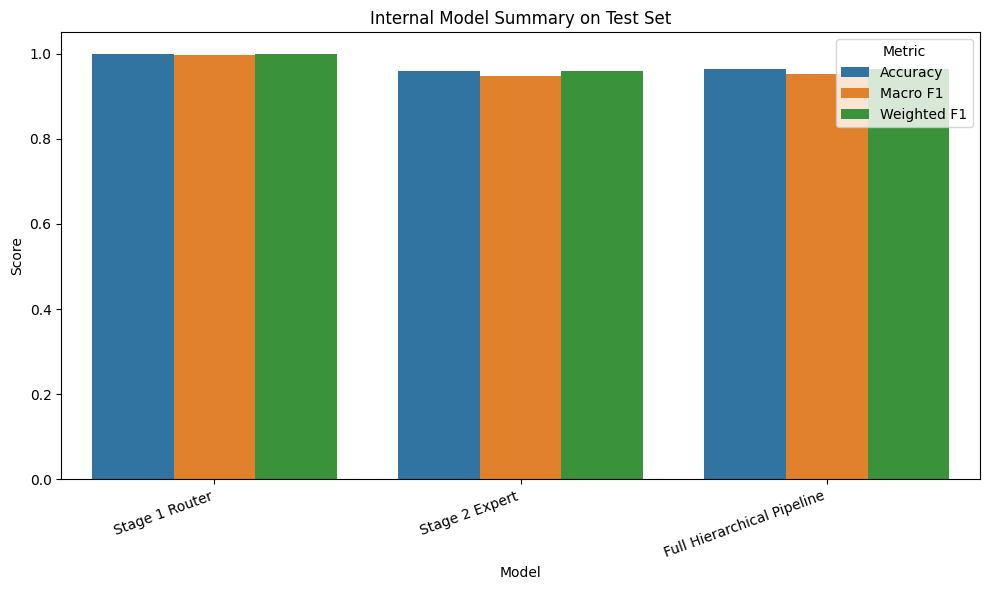

✅ Comparison plot saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/plots/final_model_comparison_plot_14class_expert.png

✅ Cell 12 complete
Next: update baseline comparison and architecture ablation for the 14-class expert setup.


In [ ]:
# ============================================================
# Cell 12: Final Internal Model Comparison Table
# Stage 1 Router vs Stage 2 Abnormal Expert vs Full Pipeline
# ============================================================

import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

set_seed(SEED)

# -------------------------
# Input metric files
# -------------------------

STAGE1_METRICS_JSON = os.path.join(
    METRICS_DIR,
    "stage1_router_resnet18_val_test_metrics.json"
)

STAGE2_METRICS_JSON = os.path.join(
    METRICS_DIR,
    "stage2_expert_efficientnetb0_14class_abnormal_only_val_test_metrics.json"
)

PIPELINE_METRICS_JSON = os.path.join(
    METRICS_DIR,
    "full_hierarchical_pipeline_14class_expert_test_metrics.json"
)

# -------------------------
# Output paths
# -------------------------

FINAL_COMPARISON_CSV = os.path.join(
    METRICS_DIR,
    "final_model_comparison_table_14class_expert.csv"
)

FINAL_COMPARISON_PLOT = os.path.join(
    PLOTS_DIR,
    "final_model_comparison_plot_14class_expert.png"
)

# -------------------------
# Load JSON helper
# -------------------------

def load_json(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Missing metrics file: {path}")

    with open(path, "r") as f:
        return json.load(f)

stage1_data = load_json(STAGE1_METRICS_JSON)
stage2_data = load_json(STAGE2_METRICS_JSON)
pipeline_data = load_json(PIPELINE_METRICS_JSON)

# -------------------------
# Build comparison rows
# Important:
# These are not all the same task.
# Stage 1 = binary
# Stage 2 = abnormal-only 14-class
# Pipeline = final 15-class prediction
# -------------------------

rows = []

rows.append({
    "Model": "Stage 1 Router",
    "Backbone": "ResNet18",
    "Task": "Normal vs Abnormal",
    "Evaluation Set": "Full test set",
    "Classes": 2,
    "Accuracy": stage1_data["test_metrics"]["accuracy"],
    "Macro Precision": stage1_data["test_metrics"]["macro_precision"],
    "Macro Recall": stage1_data["test_metrics"]["macro_recall"],
    "Macro F1": stage1_data["test_metrics"]["macro_f1"],
    "Weighted F1": stage1_data["test_metrics"]["weighted_f1"]
})

rows.append({
    "Model": "Stage 2 Expert",
    "Backbone": "EfficientNetB0",
    "Task": "Abnormal tumor subtype classification",
    "Evaluation Set": "Abnormal-only test set",
    "Classes": ABNORMAL_NUM_CLASSES,
    "Accuracy": stage2_data["test_metrics"]["accuracy"],
    "Macro Precision": stage2_data["test_metrics"]["macro_precision"],
    "Macro Recall": stage2_data["test_metrics"]["macro_recall"],
    "Macro F1": stage2_data["test_metrics"]["macro_f1"],
    "Weighted F1": stage2_data["test_metrics"]["weighted_f1"]
})

rows.append({
    "Model": "Full Hierarchical Pipeline",
    "Backbone": "ResNet18 + EfficientNetB0",
    "Task": "Normal routing + abnormal subtype prediction",
    "Evaluation Set": "Full test set",
    "Classes": NUM_CLASSES,
    "Accuracy": pipeline_data["test_metrics"]["accuracy"],
    "Macro Precision": pipeline_data["test_metrics"]["macro_precision"],
    "Macro Recall": pipeline_data["test_metrics"]["macro_recall"],
    "Macro F1": pipeline_data["test_metrics"]["macro_f1"],
    "Weighted F1": pipeline_data["test_metrics"]["weighted_f1"]
})

comparison_df = pd.DataFrame(rows)

# -------------------------
# Display/save table
# -------------------------

display_df = comparison_df.copy()
metric_cols = ["Accuracy", "Macro Precision", "Macro Recall", "Macro F1", "Weighted F1"]

for col in metric_cols:
    display_df[col] = display_df[col].round(4)

comparison_df.to_csv(FINAL_COMPARISON_CSV, index=False)

print("================ Final Internal Model Comparison ================")
display(display_df)

print(f"\n✅ Comparison table saved to: {FINAL_COMPARISON_CSV}")

print("\nNote:")
print("Stage 1, Stage 2, and the full pipeline solve different tasks.")
print("Use this table as an internal model summary, not as the main baseline comparison table.")

# -------------------------
# Plot comparison
# -------------------------

plot_df = comparison_df.melt(
    id_vars=["Model"],
    value_vars=["Accuracy", "Macro F1", "Weighted F1"],
    var_name="Metric",
    value_name="Score"
)

plt.figure(figsize=(10, 6))
sns.barplot(
    data=plot_df,
    x="Model",
    y="Score",
    hue="Metric"
)

plt.ylim(0, 1.05)
plt.title("Internal Model Summary on Test Set")
plt.xlabel("Model")
plt.ylabel("Score")
plt.xticks(rotation=20, ha="right")
plt.legend(title="Metric")
plt.tight_layout()
plt.savefig(FINAL_COMPARISON_PLOT, dpi=300, bbox_inches="tight")
plt.show()

print(f"✅ Comparison plot saved to: {FINAL_COMPARISON_PLOT}")

print("\n✅ Cell 12 complete")
print("Next: update baseline comparison and architecture ablation for the 14-class expert setup.")

## 17. Baseline Comparison with Flat 15-Class Models

This section compares the proposed hierarchical pipeline against flat single-stage 15-class classifiers trained under the same experimental setup. The baselines include models such as ResNet50, DenseNet121, and EfficientNetB0.

The goal is to determine whether the proposed router-expert hierarchy provides an advantage over direct flat classification.

In [ ]:
# ============================================================
# Cell 13: Valid Same-Budget Baseline Comparisons
# Flat 15-class baselines on FULL dataset
# Baselines: ResNet50, DenseNet121, EfficientNetB0
# Proposed: Full hierarchical pipeline with 14-class abnormal-only expert
# ============================================================

import os
import gc
import json
import torch
import torch.nn as nn
import pandas as pd

from torch.utils.data import DataLoader
from torchvision import models
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau

set_seed(SEED)

# -------------------------
# Baseline settings
# -------------------------

BASELINE_EPOCHS = 40
BASELINE_PATIENCE = 7
BASELINE_LR = 1e-4
BASELINE_WEIGHT_DECAY = 1e-4
BASELINE_LABEL_SMOOTHING = 0.05

# Keep this aligned with what you want for flat baselines.
# If final protocol uses augmentation, keep True.
# If final protocol uses no augmentation, set False.
USE_BASELINE_AUGMENTATION = USE_STAGE2_AUGMENTATION if "USE_STAGE2_AUGMENTATION" in globals() else True

BASELINE_SUMMARY_CSV = os.path.join(
    METRICS_DIR,
    "flat15_baseline_vs_hierarchical14expert_summary.csv"
)

BASELINE_SUMMARY_JSON = os.path.join(
    METRICS_DIR,
    "flat15_baseline_vs_hierarchical14expert_summary.json"
)

PIPELINE_METRICS_JSON = os.path.join(
    METRICS_DIR,
    "full_hierarchical_pipeline_14class_expert_test_metrics.json"
)

# -------------------------
# Helper
# -------------------------

def load_json(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Missing metrics file: {path}")
    with open(path, "r") as f:
        return json.load(f)

# -------------------------
# FULL 15-class baseline loaders
# IMPORTANT:
# These use train_df / val_df / test_df, not expert_train_df.
# -------------------------

baseline_train_transform = expert_train_transform if USE_BASELINE_AUGMENTATION else expert_eval_transform

baseline_train_dataset = BrainTumorDataset(
    train_df,
    transform=baseline_train_transform,
    target_col="label"
)

baseline_val_dataset = BrainTumorDataset(
    val_df,
    transform=expert_eval_transform,
    target_col="label"
)

baseline_test_dataset = BrainTumorDataset(
    test_df,
    transform=expert_eval_transform,
    target_col="label"
)

baseline_train_sampler = make_weighted_sampler(train_df["label"].values)

baseline_train_loader = DataLoader(
    baseline_train_dataset,
    batch_size=BATCH_SIZE,
    sampler=baseline_train_sampler,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

baseline_val_loader = DataLoader(
    baseline_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

baseline_test_loader = DataLoader(
    baseline_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    worker_init_fn=seed_worker,
    generator=g
)

print("================ Flat 15-Class Baseline Loader Check ================")
print(f"Baseline train samples: {len(baseline_train_dataset)}")
print(f"Baseline val samples:   {len(baseline_val_dataset)}")
print(f"Baseline test samples:  {len(baseline_test_dataset)}")
print(f"Baseline augmentation:  {USE_BASELINE_AUGMENTATION}")

x_check, y_check = next(iter(baseline_train_loader))
print(f"Batch image shape: {x_check.shape}")
print(f"Batch label min/max: {y_check.min().item()} / {y_check.max().item()}")
print(f"Expected labels: 0 to {NUM_CLASSES - 1}")

# -------------------------
# Baseline model factory
# -------------------------

class BaselineClassifier(nn.Module):
    def __init__(self, model_name, num_classes=15, dropout=0.4):
        super().__init__()

        self.model_name = model_name

        if model_name == "resnet50":
            weights = models.ResNet50_Weights.IMAGENET1K_V2
            self.backbone = models.resnet50(weights=weights)
            in_features = self.backbone.fc.in_features
            self.backbone.fc = nn.Sequential(
                nn.Dropout(dropout),
                nn.Linear(in_features, num_classes)
            )

        elif model_name == "densenet121":
            weights = models.DenseNet121_Weights.IMAGENET1K_V1
            self.backbone = models.densenet121(weights=weights)
            in_features = self.backbone.classifier.in_features
            self.backbone.classifier = nn.Sequential(
                nn.Dropout(dropout),
                nn.Linear(in_features, num_classes)
            )


        elif model_name == "efficientnet_b0":
            weights = models.EfficientNet_B0_Weights.IMAGENET1K_V1
            self.backbone = models.efficientnet_b0(weights=weights)
            in_features = self.backbone.classifier[1].in_features

            self.backbone.classifier = nn.Sequential(
                nn.Dropout(dropout),
                nn.Linear(in_features, 512),
                nn.ReLU(),
                nn.Dropout(0.3),
                nn.Linear(512, num_classes)
            )

        else:
            raise ValueError(f"Unknown baseline model: {model_name}")

    def forward(self, x):
        return self.backbone(x)

# -------------------------
# Baseline list
# New names prevent accidental abnormal-only checkpoint confusion
# -------------------------

baseline_suffix = "aug" if USE_BASELINE_AUGMENTATION else "noaug"

baseline_models = [
    {
        "name": "resnet50",
        "display_name": "ResNet50",
        "checkpoint": os.path.join(BASELINE_CKPT_DIR, f"best_flat15_{baseline_suffix}_baseline_resnet50.pth"),
        "history": os.path.join(METRICS_DIR, f"flat15_{baseline_suffix}_baseline_resnet50_training_history.csv"),
        "metrics_json": os.path.join(METRICS_DIR, f"flat15_{baseline_suffix}_baseline_resnet50_test_metrics.json")
    },
    {
        "name": "densenet121",
        "display_name": "DenseNet121",
        "checkpoint": os.path.join(BASELINE_CKPT_DIR, f"best_flat15_{baseline_suffix}_baseline_densenet121.pth"),
        "history": os.path.join(METRICS_DIR, f"flat15_{baseline_suffix}_baseline_densenet121_training_history.csv"),
        "metrics_json": os.path.join(METRICS_DIR, f"flat15_{baseline_suffix}_baseline_densenet121_test_metrics.json")
    },
    {
        "name": "efficientnet_b0",
        "display_name": "EfficientNetB0",
        "checkpoint": os.path.join(BASELINE_CKPT_DIR, f"best_flat15_{baseline_suffix}_baseline_efficientnetb0.pth"),
        "history": os.path.join(METRICS_DIR, f"flat15_{baseline_suffix}_baseline_efficientnetb0_training_history.csv"),
        "metrics_json": os.path.join(METRICS_DIR, f"flat15_{baseline_suffix}_baseline_efficientnetb0_test_metrics.json")
    }
]

# -------------------------
# Loss setup for flat 15-class baselines
# -------------------------

baseline_class_weights = get_class_weights(
    train_df["label"].values,
    num_classes=NUM_CLASSES
)

baseline_criterion = nn.CrossEntropyLoss(
    weight=baseline_class_weights,
    label_smoothing=BASELINE_LABEL_SMOOTHING
)

baseline_results = []

# -------------------------
# Train/evaluate each flat 15-class baseline
# -------------------------

for baseline_cfg in baseline_models:
    model_name = baseline_cfg["name"]
    display_name = baseline_cfg["display_name"]

    print("\n" + "=" * 70)
    print(f"Flat 15-class Baseline: {display_name}")
    print("=" * 70)

    set_seed(SEED)

    baseline_model = BaselineClassifier(
        model_name=model_name,
        num_classes=NUM_CLASSES,
        dropout=0.4
    ).to(device)

    print(f"✅ {display_name} ready")
    print(f"Task: flat 15-class classification")
    print(f"Augmentation: {USE_BASELINE_AUGMENTATION}")
    print(f"Parameters: {sum(p.numel() for p in baseline_model.parameters()):,}")

    baseline_optimizer = AdamW(
        baseline_model.parameters(),
        lr=BASELINE_LR,
        weight_decay=BASELINE_WEIGHT_DECAY
    )

    baseline_scheduler = ReduceLROnPlateau(
        baseline_optimizer,
        mode="max",
        factor=0.5,
        patience=3,
        min_lr=1e-7
    )

    if os.path.exists(baseline_cfg["checkpoint"]):
        print(f"✅ Existing checkpoint found for {display_name}. Loading from Drive.")
        print(baseline_cfg["checkpoint"])
        baseline_model = load_model_weights(baseline_model, baseline_cfg["checkpoint"])

    else:
        baseline_model, baseline_history = train_model(
            model=baseline_model,
            train_loader=baseline_train_loader,
            val_loader=baseline_val_loader,
            criterion=baseline_criterion,
            optimizer=baseline_optimizer,
            scheduler=baseline_scheduler,
            epochs=BASELINE_EPOCHS,
            checkpoint_path=baseline_cfg["checkpoint"],
            history_path=baseline_cfg["history"],
            monitor="macro_f1",
            mode="max",
            early_stopping=True,
            patience=BASELINE_PATIENCE,
            grad_clip=1.0,
            use_amp=True,
            scheduler_step_on="val_metric",
            model_name=f"Flat15_Baseline_{display_name}"
        )

        baseline_model = load_model_weights(baseline_model, baseline_cfg["checkpoint"])

    # Evaluate on full 15-class test set
    test_metrics, y_true_base, y_pred_base = evaluate_model(
        baseline_model,
        baseline_test_loader,
        criterion=baseline_criterion
    )

    print(f"\n================ {display_name} Flat 15-Class Test Metrics ================")
    for k, v in test_metrics.items():
        print(f"{k}: {v:.4f}")

    baseline_result = {
        "Model": display_name,
        "Backbone": display_name,
        "Task": "Flat single-stage 15-class classification",
        "Evaluation Set": "Full test set",
        "Classes": NUM_CLASSES,
        "Training Protocol": f"{'Augmentation' if USE_BASELINE_AUGMENTATION else 'No augmentation'} + weighted sampler + class-weighted CE + label smoothing",
        "Training Budget": f"{BASELINE_EPOCHS} epochs, patience {BASELINE_PATIENCE}",
        "Accuracy": test_metrics["accuracy"],
        "Macro Precision": test_metrics["macro_precision"],
        "Macro Recall": test_metrics["macro_recall"],
        "Macro F1": test_metrics["macro_f1"],
        "Weighted F1": test_metrics["weighted_f1"],
        "Loss": test_metrics["loss"],
        "Checkpoint": baseline_cfg["checkpoint"]
    }

    baseline_results.append(baseline_result)

    with open(baseline_cfg["metrics_json"], "w") as f:
        json.dump(baseline_result, f, indent=4)

    del baseline_model
    torch.cuda.empty_cache()
    gc.collect()

# -------------------------
# Add full hierarchical pipeline result
# -------------------------

pipeline_data = load_json(PIPELINE_METRICS_JSON)

baseline_results.append({
    "Model": "Full Hierarchical Pipeline",
    "Backbone": "ResNet18 + EfficientNetB0",
    "Task": "Normal router + 14-class abnormal expert",
    "Evaluation Set": "Full test set",
    "Classes": NUM_CLASSES,
    "Training Protocol": "Stage-wise: router + abnormal-only expert",
    "Training Budget": "Stage-wise training",
    "Accuracy": pipeline_data["test_metrics"]["accuracy"],
    "Macro Precision": pipeline_data["test_metrics"]["macro_precision"],
    "Macro Recall": pipeline_data["test_metrics"]["macro_recall"],
    "Macro F1": pipeline_data["test_metrics"]["macro_f1"],
    "Weighted F1": pipeline_data["test_metrics"]["weighted_f1"],
    "Loss": None,
    "Checkpoint": "Router + 14-class abnormal expert"
})

# -------------------------
# Save final baseline table
# -------------------------

baseline_summary_df = pd.DataFrame(baseline_results)

metric_cols = [
    "Accuracy",
    "Macro Precision",
    "Macro Recall",
    "Macro F1",
    "Weighted F1",
    "Loss"
]

display_baseline_df = baseline_summary_df.copy()

for col in metric_cols:
    if col in display_baseline_df.columns:
        display_baseline_df[col] = display_baseline_df[col].apply(
            lambda x: round(x, 4) if pd.notnull(x) else x
        )

baseline_summary_df.to_csv(BASELINE_SUMMARY_CSV, index=False)

with open(BASELINE_SUMMARY_JSON, "w") as f:
    json.dump(baseline_results, f, indent=4)

print("\n================ Flat 15-Class Baseline vs Hierarchical Pipeline Summary ================")
display(display_baseline_df)

print(f"\n✅ Baseline comparison CSV saved to: {BASELINE_SUMMARY_CSV}")
print(f"✅ Baseline comparison JSON saved to: {BASELINE_SUMMARY_JSON}")

print("\n✅ Cell 13 complete")

================ Flat 15-Class Baseline Loader Check ================
Baseline train samples: 3092
Baseline val samples:   683
Baseline test samples:  680
Baseline augmentation:  True
Batch image shape: torch.Size([16, 3, 224, 224])
Batch label min/max: 0 / 14
Expected labels: 0 to 14

Flat 15-class Baseline: ResNet50
✅ ResNet50 ready
Task: flat 15-class classification
Augmentation: True
Parameters: 23,538,767
✅ Existing checkpoint found for ResNet50. Loading from Drive.
/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/checkpoints/baselines/best_flat15_aug_baseline_resnet50.pth

================ ResNet50 Flat 15-Class Test Metrics ================
accuracy: 0.9456
macro_precision: 0.9258
macro_recall: 0.9439
macro_f1: 0.9300
weighted_f1: 0.9463
loss: 0.8776

Flat 15-class Baseline: DenseNet121
✅ DenseNet121 ready
Task: flat 15-class classification
Augmentation: True
Parameters: 6,969,231
✅ Existing checkpoint found for DenseNet121. Loading from Drive.
/content/drive/MyDrive/Brai

,Model,Backbone,Task,Evaluation Set,Classes,Training Protocol,Training Budget,Accuracy,Macro Precision,Macro Recall,Macro F1,Weighted F1,Loss,Checkpoint
0,ResNet50,ResNet50,Flat single-stage 15-class classification,Full test set,15,Augmentation + weighted sampler + class-weight...,"40 epochs, patience 7",0.9456,0.9258,0.9439,0.9300,0.9463,0.8776,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
1,DenseNet121,DenseNet121,Flat single-stage 15-class classification,Full test set,15,Augmentation + weighted sampler + class-weight...,"40 epochs, patience 7",0.9515,0.9431,0.9540,0.9460,0.9517,0.8900,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2,EfficientNetB0,EfficientNetB0,Flat single-stage 15-class classification,Full test set,15,Augmentation + weighted sampler + class-weight...,"40 epochs, patience 7",0.9588,0.9326,0.9591,0.9429,0.9596,0.8831,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
3,Full Hierarchical Pipeline,ResNet18 + EfficientNetB0,Normal router + 14-class abnormal expert,Full test set,15,Stage-wise: router + abnormal-only expert,Stage-wise training,0.9647,0.9412,0.9655,0.9516,0.9650,NaN,Router + 14-class abnormal expert



✅ Baseline comparison CSV saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/flat15_baseline_vs_hierarchical14expert_summary.csv
✅ Baseline comparison JSON saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/flat15_baseline_vs_hierarchical14expert_summary.json

✅ Cell 13 complete


## 18. Architecture-Level Ablation Study

This section evaluates the contribution of the main architectural components of the proposed hierarchy.

The ablation variants are:

- **Proposed Full Hierarchy:** Router + abnormal-only expert
- **Without Router:** All images are forced through the abnormal expert
- **Without Expert:** Router is used alone and abnormal cases are assigned to the majority abnormal class
- **Oracle Router:** Ground-truth Normal/Abnormal routing with the expert

This ablation tests whether the router and expert provide complementary benefits.

================ Ablation Setup ================
Normal class: Normal | index: 10
Majority abnormal class for 'Without Expert': Meningioma
Majority abnormal index: 8


Running architecture ablation: 100%|██████████| 43/43 [00:06<00:00,  7.08it/s]



================ Architecture Ablation Summary ================


,Variant,Description,Overall Accuracy,Macro Precision,Macro Recall,Macro F1,Weighted F1,Normal Recall,Abnormal Accuracy,Expert Call Rate,Expert Skip Rate,Accuracy Delta vs Proposed,Macro F1 Delta vs Proposed,Normal Recall Delta vs Proposed
0,Proposed Full Hierarchy,Router stops Normal cases; abnormal cases sent...,0.9647,0.9412,0.9655,0.9516,0.9650,1.0,0.9596,0.8721,0.1279,0.0000,0.0000,0.0
1,Without Router,All samples forced through abnormal expert; No...,0.8382,0.7699,0.8989,0.8241,0.7847,0.0,0.9596,1.0000,0.0000,-0.1265,-0.1275,-1.0
2,Without Expert,Router only; abnormal cases assigned majority ...,0.3206,0.0807,0.1328,0.0905,0.1969,1.0,0.2222,0.0000,1.0000,-0.6441,-0.8611,0.0
3,Oracle Router,Ground-truth normal/abnormal routing + abnorma...,0.9647,0.9412,0.9655,0.9516,0.9650,1.0,0.9596,0.8735,0.1265,0.0000,0.0000,0.0



✅ Ablation CSV saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/architecture_ablation_router_expert_summary.csv
✅ Ablation JSON saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/architecture_ablation_router_expert_summary.json
✅ Ablation prediction details saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/metrics/architecture_ablation_router_expert_predictions.csv


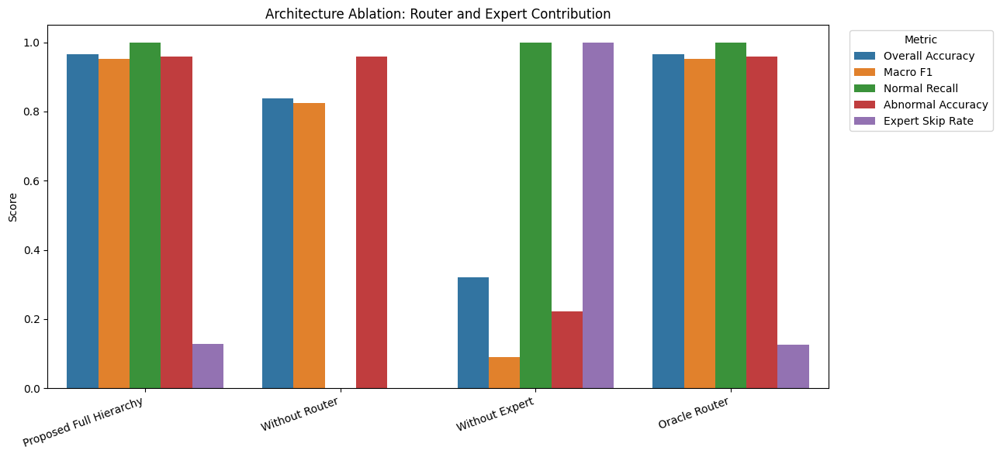

✅ Ablation plot saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/plots/architecture_ablation_router_expert_plot.png

✅ Architecture ablation complete.


In [ ]:
# ============================================================
# Architecture Ablation Study: Router Contribution + Expert Contribution
# No retraining required
#
# Variants:
# 1. Proposed Full Hierarchy
# 2. Without Router: all samples forced through abnormal expert
# 3. Without Expert: router only, abnormal assigned majority abnormal class
# 4. Oracle Router: true normal/abnormal routing + expert
#
# Key extra metrics:
# - Normal Recall
# - Abnormal Accuracy
# - Expert Call Rate
# ============================================================

import os
import json
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

set_seed(SEED)

# -------------------------
# Output paths
# -------------------------

ABLATION_CSV = os.path.join(
    METRICS_DIR,
    "architecture_ablation_router_expert_summary.csv"
)

ABLATION_JSON = os.path.join(
    METRICS_DIR,
    "architecture_ablation_router_expert_summary.json"
)

ABLATION_PLOT = os.path.join(
    PLOTS_DIR,
    "architecture_ablation_router_expert_plot.png"
)

ABLATION_PRED_CSV = os.path.join(
    METRICS_DIR,
    "architecture_ablation_router_expert_predictions.csv"
)

# -------------------------
# Majority abnormal class for router-only variant
# -------------------------

abnormal_train_df = train_df[train_df["class_name"] != NORMAL_CLASS].copy()
majority_abnormal_class = abnormal_train_df["class_name"].value_counts().idxmax()
majority_abnormal_idx = int(class_to_idx[majority_abnormal_class])

print("================ Ablation Setup ================")
print(f"Normal class: {NORMAL_CLASS} | index: {NORMAL_IDX}")
print(f"Majority abnormal class for 'Without Expert': {majority_abnormal_class}")
print(f"Majority abnormal index: {majority_abnormal_idx}")

# -------------------------
# Prediction collection
# -------------------------

router.eval()
expert.eval()

y_true_all = []

pred_full = []
pred_no_router = []
pred_no_expert = []
pred_oracle_router = []

router_preds_all = []
expert_local_all = []
expert_global_all = []

expert_called_full = []
expert_called_no_router = []
expert_called_no_expert = []
expert_called_oracle = []

with torch.no_grad():
    for images, labels in tqdm(pipeline_test_loader, desc="Running architecture ablation"):
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        router_logits = router(images)
        router_preds = torch.argmax(router_logits, dim=1)

        expert_logits = expert(images)
        expert_local_preds = torch.argmax(expert_logits, dim=1)

        for true_label, r_pred, local_pred in zip(labels, router_preds, expert_local_preds):
            true_label = int(true_label.item())
            r_pred = int(r_pred.item())
            local_pred = int(local_pred.item())

            expert_global_pred = int(abnormal_local_to_global[local_pred])

            # -------------------------
            # 1. Proposed full hierarchy
            # -------------------------
            if r_pred == 0:
                full_pred = int(NORMAL_IDX)
                full_expert_called = 0
            else:
                full_pred = expert_global_pred
                full_expert_called = 1

            # -------------------------
            # 2. Without router
            # Every image goes to abnormal expert.
            # Normal cannot be predicted.
            # -------------------------
            no_router_pred = expert_global_pred
            no_router_expert_called = 1

            # -------------------------
            # 3. Without expert
            # Router can detect Normal, but cannot subtype abnormal.
            # Abnormal assigned majority abnormal class.
            # -------------------------
            if r_pred == 0:
                no_expert_pred = int(NORMAL_IDX)
            else:
                no_expert_pred = majority_abnormal_idx
            no_expert_called = 0

            # -------------------------
            # 4. Oracle router
            # Perfect normal/abnormal decision.
            # Upper bound of routing stage.
            # -------------------------
            if true_label == int(NORMAL_IDX):
                oracle_pred = int(NORMAL_IDX)
                oracle_expert_called = 0
            else:
                oracle_pred = expert_global_pred
                oracle_expert_called = 1

            y_true_all.append(true_label)

            pred_full.append(full_pred)
            pred_no_router.append(no_router_pred)
            pred_no_expert.append(no_expert_pred)
            pred_oracle_router.append(oracle_pred)

            router_preds_all.append(r_pred)
            expert_local_all.append(local_pred)
            expert_global_all.append(expert_global_pred)

            expert_called_full.append(full_expert_called)
            expert_called_no_router.append(no_router_expert_called)
            expert_called_no_expert.append(no_expert_called)
            expert_called_oracle.append(oracle_expert_called)

y_true_all = np.array(y_true_all)

pred_full = np.array(pred_full)
pred_no_router = np.array(pred_no_router)
pred_no_expert = np.array(pred_no_expert)
pred_oracle_router = np.array(pred_oracle_router)

expert_called_full = np.array(expert_called_full)
expert_called_no_router = np.array(expert_called_no_router)
expert_called_no_expert = np.array(expert_called_no_expert)
expert_called_oracle = np.array(expert_called_oracle)

normal_mask = y_true_all == int(NORMAL_IDX)
abnormal_mask = y_true_all != int(NORMAL_IDX)

# -------------------------
# Metrics helper
# -------------------------

def safe_accuracy(y_true, y_pred):
    if len(y_true) == 0:
        return np.nan
    return accuracy_score(y_true, y_pred)

def compute_ablation_metrics(name, description, y_pred, expert_called):
    overall_accuracy = accuracy_score(y_true_all, y_pred)

    normal_recall = safe_accuracy(
        y_true_all[normal_mask],
        y_pred[normal_mask]
    )

    abnormal_accuracy = safe_accuracy(
        y_true_all[abnormal_mask],
        y_pred[abnormal_mask]
    )

    metrics = {
        "Variant": name,
        "Description": description,
        "Overall Accuracy": overall_accuracy,
        "Macro Precision": precision_score(y_true_all, y_pred, average="macro", zero_division=0),
        "Macro Recall": recall_score(y_true_all, y_pred, average="macro", zero_division=0),
        "Macro F1": f1_score(y_true_all, y_pred, average="macro", zero_division=0),
        "Weighted F1": f1_score(y_true_all, y_pred, average="weighted", zero_division=0),
        "Normal Recall": normal_recall,
        "Abnormal Accuracy": abnormal_accuracy,
        "Expert Call Rate": float(np.mean(expert_called)),
        "Expert Skip Rate": float(1.0 - np.mean(expert_called))
    }

    return metrics

# -------------------------
# Build ablation table
# -------------------------

rows = []

rows.append(compute_ablation_metrics(
    "Proposed Full Hierarchy",
    "Router stops Normal cases; abnormal cases sent to expert",
    pred_full,
    expert_called_full
))

rows.append(compute_ablation_metrics(
    "Without Router",
    "All samples forced through abnormal expert; Normal cannot be predicted",
    pred_no_router,
    expert_called_no_router
))

rows.append(compute_ablation_metrics(
    "Without Expert",
    "Router only; abnormal cases assigned majority abnormal class",
    pred_no_expert,
    expert_called_no_expert
))

rows.append(compute_ablation_metrics(
    "Oracle Router",
    "Ground-truth normal/abnormal routing + abnormal expert",
    pred_oracle_router,
    expert_called_oracle
))

ablation_df = pd.DataFrame(rows)

# Deltas vs proposed
proposed_row = ablation_df[ablation_df["Variant"] == "Proposed Full Hierarchy"].iloc[0]

ablation_df["Accuracy Delta vs Proposed"] = (
    ablation_df["Overall Accuracy"] - proposed_row["Overall Accuracy"]
)

ablation_df["Macro F1 Delta vs Proposed"] = (
    ablation_df["Macro F1"] - proposed_row["Macro F1"]
)

ablation_df["Normal Recall Delta vs Proposed"] = (
    ablation_df["Normal Recall"] - proposed_row["Normal Recall"]
)

# Save
ablation_df.to_csv(ABLATION_CSV, index=False)

with open(ABLATION_JSON, "w") as f:
    json.dump(rows, f, indent=4)

display_df = ablation_df.copy()

metric_cols = [
    "Overall Accuracy",
    "Macro Precision",
    "Macro Recall",
    "Macro F1",
    "Weighted F1",
    "Normal Recall",
    "Abnormal Accuracy",
    "Expert Call Rate",
    "Expert Skip Rate",
    "Accuracy Delta vs Proposed",
    "Macro F1 Delta vs Proposed",
    "Normal Recall Delta vs Proposed"
]

for col in metric_cols:
    display_df[col] = display_df[col].round(4)

print("\n================ Architecture Ablation Summary ================")
display(display_df)

print(f"\n✅ Ablation CSV saved to: {ABLATION_CSV}")
print(f"✅ Ablation JSON saved to: {ABLATION_JSON}")

# -------------------------
# Save prediction details
# -------------------------

ablation_pred_df = test_df.copy()

ablation_pred_df["true_label"] = y_true_all
ablation_pred_df["true_class"] = [idx_to_class[int(i)] for i in y_true_all]

ablation_pred_df["router_pred_binary"] = router_preds_all
ablation_pred_df["router_pred_name"] = [
    "Normal" if int(i) == 0 else "Abnormal" for i in router_preds_all
]

ablation_pred_df["expert_pred_local"] = expert_local_all
ablation_pred_df["expert_pred_global"] = expert_global_all
ablation_pred_df["expert_pred_class"] = [
    idx_to_class[int(i)] for i in expert_global_all
]

ablation_pred_df["pred_full_hierarchy"] = pred_full
ablation_pred_df["pred_without_router"] = pred_no_router
ablation_pred_df["pred_without_expert"] = pred_no_expert
ablation_pred_df["pred_oracle_router"] = pred_oracle_router

ablation_pred_df["correct_full_hierarchy"] = (
    ablation_pred_df["true_label"] == ablation_pred_df["pred_full_hierarchy"]
)

ablation_pred_df["correct_without_router"] = (
    ablation_pred_df["true_label"] == ablation_pred_df["pred_without_router"]
)

ablation_pred_df["correct_without_expert"] = (
    ablation_pred_df["true_label"] == ablation_pred_df["pred_without_expert"]
)

ablation_pred_df["correct_oracle_router"] = (
    ablation_pred_df["true_label"] == ablation_pred_df["pred_oracle_router"]
)

ablation_pred_df.to_csv(ABLATION_PRED_CSV, index=False)

print(f"✅ Ablation prediction details saved to: {ABLATION_PRED_CSV}")

# -------------------------
# Plot important metrics
# -------------------------

plot_df = ablation_df.melt(
    id_vars=["Variant"],
    value_vars=[
        "Overall Accuracy",
        "Macro F1",
        "Normal Recall",
        "Abnormal Accuracy",
        "Expert Skip Rate"
    ],
    var_name="Metric",
    value_name="Score"
)

plt.figure(figsize=(13, 6))
sns.barplot(
    data=plot_df,
    x="Variant",
    y="Score",
    hue="Metric"
)

plt.ylim(0, 1.05)
plt.title("Architecture Ablation: Router and Expert Contribution")
plt.xlabel("")
plt.ylabel("Score")
plt.xticks(rotation=20, ha="right")
plt.legend(title="Metric", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.savefig(ABLATION_PLOT, dpi=300, bbox_inches="tight")
plt.show()

print(f"✅ Ablation plot saved to: {ABLATION_PLOT}")

print("\n✅ Architecture ablation complete.")

## 19. Grad-CAM Explainability

This section generates Grad-CAM visualizations for the Stage 2 abnormal-only expert. Grad-CAM highlights image regions that contribute most strongly to the model’s predicted tumor subtype.

Both correctly classified and misclassified examples are visualized to analyze model behavior and failure cases.

In [ ]:
# ============================================================
# Grad-CAM Cell 1: Setup for Stage 2 Abnormal-Only Expert
# Works with EfficientNetB0 abnormal-only expert
# ============================================================

import os
import cv2
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from torchvision import transforms

set_seed(SEED)

# -------------------------
# Output folder
# -------------------------

GRADCAM_DIR = os.path.join(RESULTS_DIR, "gradcam")
os.makedirs(GRADCAM_DIR, exist_ok=True)

print(f"✅ Grad-CAM output directory: {GRADCAM_DIR}")

# -------------------------
# Get target conv layer
# For EfficientNetB0, last feature block is a good choice
# -------------------------

def get_expert_target_layer(model):
    if isinstance(model, torch.nn.DataParallel):
        return model.module.backbone.features[-1]
    else:
        return model.backbone.features[-1]

target_layer = get_expert_target_layer(expert)
print("✅ Target layer selected for Grad-CAM:")
print(target_layer)

# -------------------------
# Grad-CAM class
# -------------------------

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer

        self.activations = None
        self.gradients = None

        self.forward_hook = self.target_layer.register_forward_hook(self.save_activation)
        self.backward_hook = self.target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output.detach()

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def remove_hooks(self):
        self.forward_hook.remove()
        self.backward_hook.remove()

    def generate(self, input_tensor, class_idx=None):
        """
        input_tensor: shape [1, C, H, W]
        class_idx: target class index (local Stage 2 label, 0 to 13)
        """

        self.model.eval()
        self.model.zero_grad()

        output = self.model(input_tensor)

        if class_idx is None:
            class_idx = int(torch.argmax(output, dim=1).item())

        score = output[:, class_idx]
        score.backward(retain_graph=True)

        # gradients: [1, C, H, W]
        # activations: [1, C, H, W]
        gradients = self.gradients[0]
        activations = self.activations[0]

        # Global average pooling of gradients
        weights = gradients.mean(dim=(1, 2))  # [C]

        cam = torch.zeros(activations.shape[1:], dtype=torch.float32, device=activations.device)

        for i, w in enumerate(weights):
            cam += w * activations[i]

        cam = torch.relu(cam)
        cam = cam.detach().cpu().numpy()

        # Normalize
        cam -= cam.min()
        if cam.max() > 0:
            cam /= cam.max()

        return cam, output.detach().cpu()

# -------------------------
# Image denormalization helper
# -------------------------

def denormalize_image(tensor_img, mean=IMAGENET_MEAN, std=IMAGENET_STD):
    """
    tensor_img: [3, H, W]
    returns uint8 image in HWC format
    """
    img = tensor_img.detach().cpu().numpy().transpose(1, 2, 0)

    mean = np.array(mean)
    std = np.array(std)

    img = (img * std) + mean
    img = np.clip(img, 0, 1)
    img = (img * 255).astype(np.uint8)

    return img

# -------------------------
# Overlay helper
# -------------------------

def overlay_cam_on_image(image_rgb, cam, alpha=0.4):
    """
    image_rgb: uint8 HWC RGB image
    cam: normalized [H, W] array
    """
    heatmap = np.uint8(255 * cam)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(image_rgb, 1 - alpha, heatmap, alpha, 0)
    return heatmap, overlay

# -------------------------
# Prediction helper for Stage 2 abnormal-only expert
# -------------------------

@torch.no_grad()
def predict_stage2_expert(model, image_tensor):
    model.eval()
    output = model(image_tensor)
    probs = torch.softmax(output, dim=1)
    pred_local = int(torch.argmax(probs, dim=1).item())
    conf = float(probs[0, pred_local].item())

    pred_class = abnormal_local_idx_to_class[pred_local]
    pred_global = abnormal_local_to_global[pred_local]

    return {
        "pred_local": pred_local,
        "pred_global": pred_global,
        "pred_class": pred_class,
        "confidence": conf,
        "probs": probs.detach().cpu().numpy()
    }

# -------------------------
# One-sample Grad-CAM visualization helper
# -------------------------

def generate_gradcam_for_sample(df, sample_idx, save_name=None, use_true_class=False):
    """
    df should be expert_test_df or expert_val_df
    sample_idx is row index inside that dataframe
    use_true_class:
        False -> Grad-CAM for predicted class
        True  -> Grad-CAM for true class
    """

    row = df.iloc[sample_idx]

    image_path = row["path"]
    true_local = int(row["expert_label"])
    true_global = int(row["global_label"])
    true_class = row["class_name"]

    pil_img = Image.open(image_path).convert("RGB")
    input_tensor = expert_eval_transform(pil_img).unsqueeze(0).to(device)

    # prediction
    pred_info = predict_stage2_expert(expert, input_tensor)
    pred_local = pred_info["pred_local"]
    pred_class = pred_info["pred_class"]
    confidence = pred_info["confidence"]

    # choose target class
    target_class = true_local if use_true_class else pred_local

    gradcam = GradCAM(expert, target_layer)
    cam, raw_output = gradcam.generate(input_tensor, class_idx=target_class)
    gradcam.remove_hooks()

    # original image
    display_img = denormalize_image(input_tensor[0])

    # resize CAM to input size
    cam_resized = cv2.resize(cam, (display_img.shape[1], display_img.shape[0]))
    heatmap, overlay = overlay_cam_on_image(display_img, cam_resized, alpha=0.4)

    # plot
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(display_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap)
    plt.title("Grad-CAM Heatmap")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis("off")

    title_mode = "True Class" if use_true_class else "Predicted Class"
    plt.suptitle(
        f"{title_mode} Grad-CAM\n"
        f"True: {true_class} | Pred: {pred_class} | Conf: {confidence:.4f}",
        fontsize=12
    )

    plt.tight_layout()
    plt.show()

    # optionally save
    if save_name is not None:
        save_path = os.path.join(GRADCAM_DIR, save_name)
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(display_img)
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(heatmap)
        plt.title("Grad-CAM Heatmap")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(overlay)
        plt.title("Overlay")
        plt.axis("off")

        plt.suptitle(
            f"{title_mode} Grad-CAM\n"
            f"True: {true_class} | Pred: {pred_class} | Conf: {confidence:.4f}",
            fontsize=12
        )

        plt.tight_layout()
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        plt.close()

        print(f"✅ Saved Grad-CAM to: {save_path}")

    return {
        "image_path": image_path,
        "true_local": true_local,
        "true_global": true_global,
        "true_class": true_class,
        "pred_local": pred_local,
        "pred_class": pred_class,
        "confidence": confidence
    }

print("\n✅ Grad-CAM Cell 1 complete")
print("Next step: run sample visualization cell.")

✅ Grad-CAM output directory: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam
✅ Target layer selected for Grad-CAM:
Conv2dNormActivation(
  (0): Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (1): BatchNorm2d(1280, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): SiLU(inplace=True)
)

✅ Grad-CAM Cell 1 complete
Next step: run sample visualization cell.


Generating Stage 2 predictions on abnormal-only test set...
✅ Prediction summary created
✅ Saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/stage2_gradcam_prediction_summary.csv

================ Stage 2 Expert Test Summary ================
Total abnormal test samples: 594
Correct predictions:         570
Misclassifications:          24

Correct sample indices: [530, 74, 137]
Incorrect sample indices: [431, 489, 480]

================ Grad-CAM: Correctly Classified Samples ================

Showing correct sample 1 (expert_test_df index = 530)


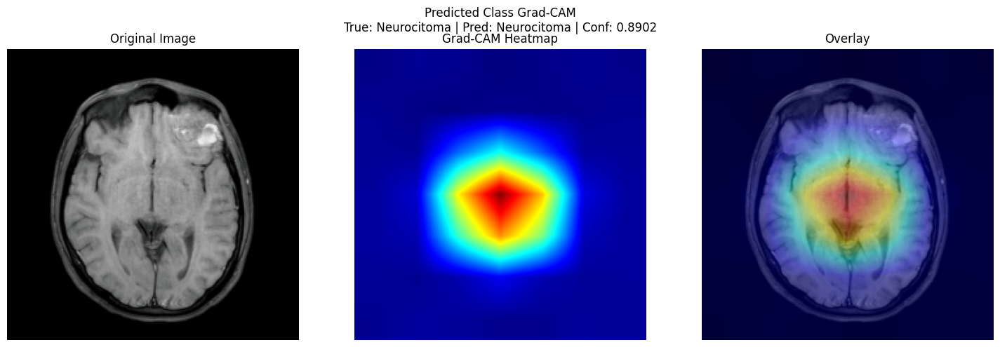

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/gradcam_correct_sample_1_idx_530.png
{'image_path': '/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor/Neurocitoma/T1FatSat-08_big_gallery.jpeg', 'true_local': 9, 'true_global': 9, 'true_class': 'Neurocitoma', 'pred_local': 9, 'pred_class': 'Neurocitoma', 'confidence': 0.8901957273483276}

Showing correct sample 2 (expert_test_df index = 74)


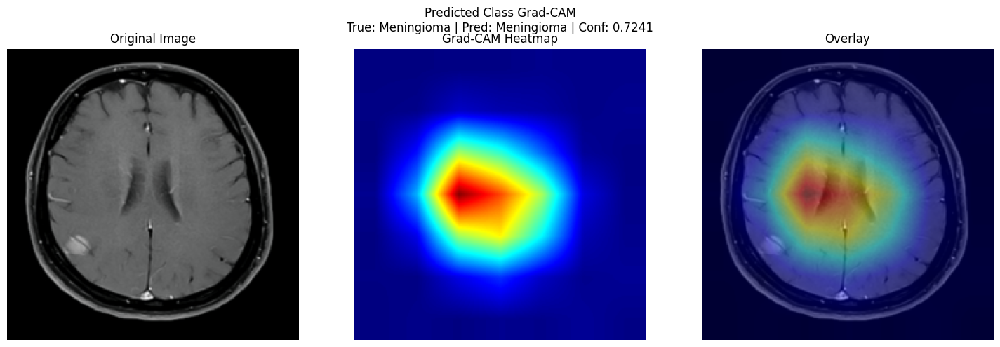

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/gradcam_correct_sample_2_idx_74.png
{'image_path': '/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor/Meningioma/2022-05-30 15_23_42-Meningioma _ Radiology Case _ Radiopaedia.org - Opera.jpg', 'true_local': 8, 'true_global': 8, 'true_class': 'Meningioma', 'pred_local': 8, 'pred_class': 'Meningioma', 'confidence': 0.7241129279136658}

Showing correct sample 3 (expert_test_df index = 137)


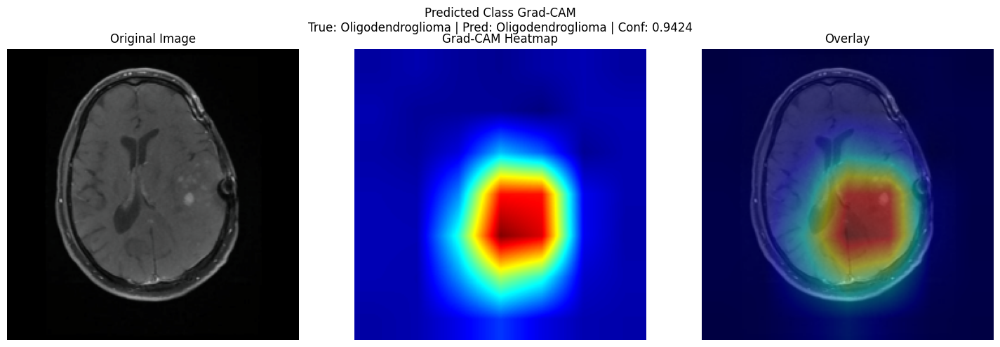

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/gradcam_correct_sample_3_idx_137.png
{'image_path': '/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor/Oligodendroglioma/021_big_gallery.jpeg', 'true_local': 10, 'true_global': 11, 'true_class': 'Oligodendroglioma', 'pred_local': 10, 'pred_class': 'Oligodendroglioma', 'confidence': 0.9424235224723816}

================ Grad-CAM: Misclassified Samples ================

Showing misclassified sample 1 (expert_test_df index = 431)
Predicted-class Grad-CAM:


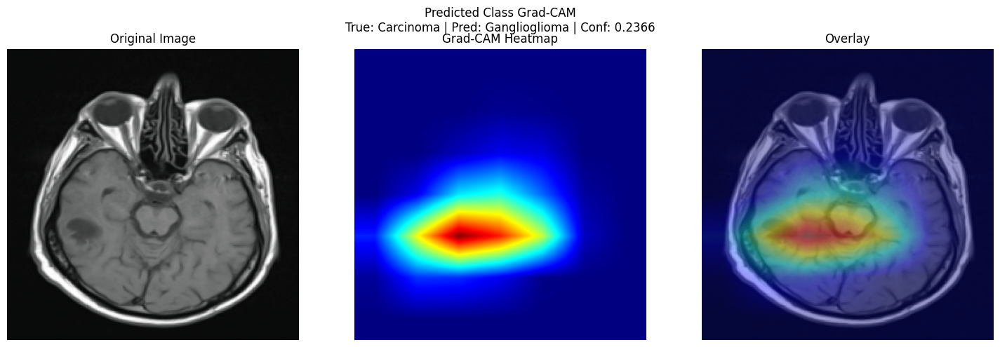

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/gradcam_misclassified_predclass_1_idx_431.png
{'image_path': '/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor/Carcinoma/de7ff0f731b01ddf6a752ac67914f7d0066d8eee4abd405227a86a0881e81166_big_gallery.jpeg', 'true_local': 1, 'true_global': 1, 'true_class': 'Carcinoma', 'pred_local': 3, 'pred_class': 'Ganglioglioma', 'confidence': 0.23664945363998413}
True-class Grad-CAM:


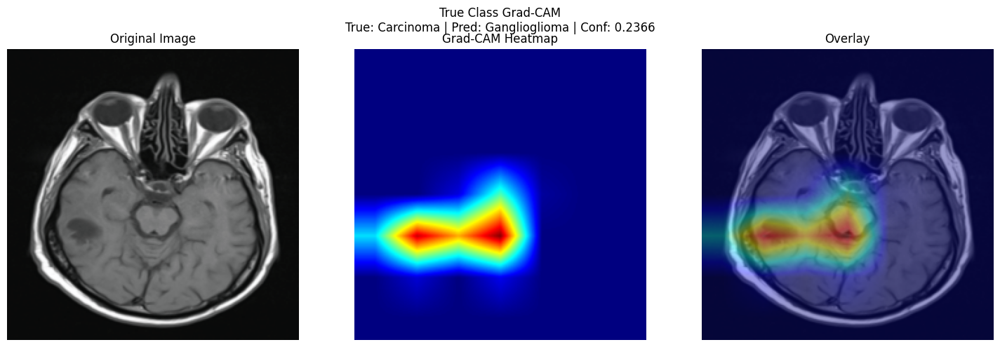

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/gradcam_misclassified_trueclass_1_idx_431.png
{'image_path': '/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor/Carcinoma/de7ff0f731b01ddf6a752ac67914f7d0066d8eee4abd405227a86a0881e81166_big_gallery.jpeg', 'true_local': 1, 'true_global': 1, 'true_class': 'Carcinoma', 'pred_local': 3, 'pred_class': 'Ganglioglioma', 'confidence': 0.23664945363998413}

Showing misclassified sample 2 (expert_test_df index = 489)
Predicted-class Grad-CAM:


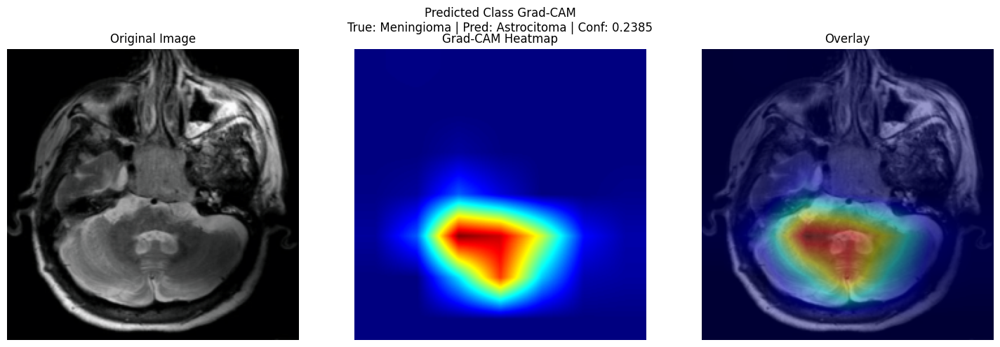

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/gradcam_misclassified_predclass_2_idx_489.png
{'image_path': '/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor/Meningioma/2022-05-30 15_36_28-Suprasellar meningioma _ Radiology Case _ Radiopaedia.org - Opera.jpg', 'true_local': 8, 'true_global': 8, 'true_class': 'Meningioma', 'pred_local': 0, 'pred_class': 'Astrocitoma', 'confidence': 0.2384679764509201}
True-class Grad-CAM:


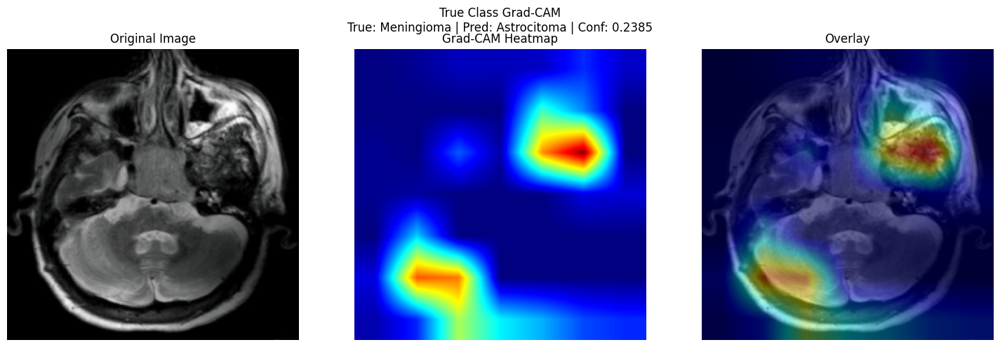

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/gradcam_misclassified_trueclass_2_idx_489.png
{'image_path': '/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor/Meningioma/2022-05-30 15_36_28-Suprasellar meningioma _ Radiology Case _ Radiopaedia.org - Opera.jpg', 'true_local': 8, 'true_global': 8, 'true_class': 'Meningioma', 'pred_local': 0, 'pred_class': 'Astrocitoma', 'confidence': 0.2384679764509201}

Showing misclassified sample 3 (expert_test_df index = 480)
Predicted-class Grad-CAM:


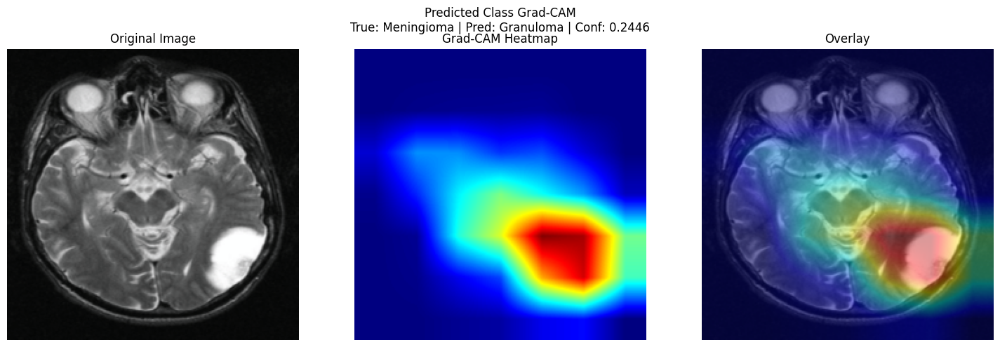

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/gradcam_misclassified_predclass_3_idx_480.png
{'image_path': '/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor/Meningioma/2022-05-30 13_16_55-Microcystic meningioma _ Radiology Case _ Radiopaedia.org - Opera.jpg', 'true_local': 8, 'true_global': 8, 'true_class': 'Meningioma', 'pred_local': 6, 'pred_class': 'Granuloma', 'confidence': 0.24458876252174377}
True-class Grad-CAM:


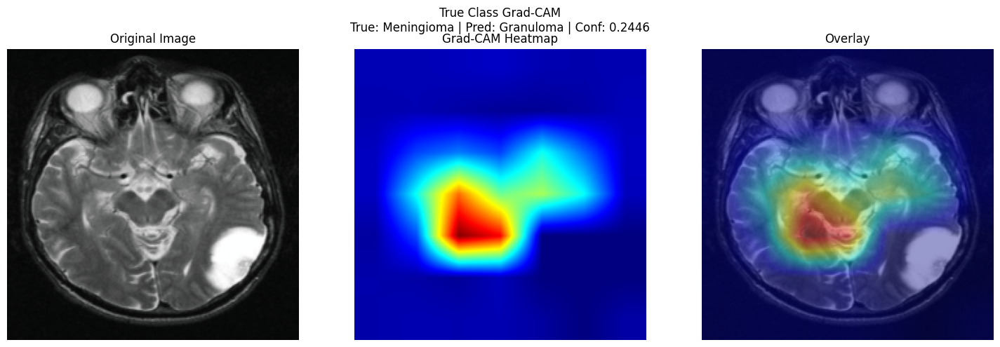

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/gradcam_misclassified_trueclass_3_idx_480.png
{'image_path': '/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/raw/brain-tumor-for-14-classes/BrainTumor/Meningioma/2022-05-30 13_16_55-Microcystic meningioma _ Radiology Case _ Radiopaedia.org - Opera.jpg', 'true_local': 8, 'true_global': 8, 'true_class': 'Meningioma', 'pred_local': 6, 'pred_class': 'Granuloma', 'confidence': 0.24458876252174377}

✅ Grad-CAM Cell 2 complete
Next: if you want, I can give you Cell 3 to generate class-wise Grad-CAM examples automatically.


In [ ]:
# ============================================================
# Grad-CAM Cell 2: Visualize Correct + Misclassified Samples
# For Stage 2 abnormal-only expert
# ============================================================

import random
import pandas as pd

set_seed(SEED)

# -------------------------
# Build prediction table on expert_test_df
# -------------------------

expert_test_results = []

print("Generating Stage 2 predictions on abnormal-only test set...")

for idx in range(len(expert_test_df)):
    row = expert_test_df.iloc[idx]

    image_path = row["path"]
    true_local = int(row["expert_label"])
    true_global = int(row["global_label"])
    true_class = row["class_name"]

    pil_img = Image.open(image_path).convert("RGB")
    input_tensor = expert_eval_transform(pil_img).unsqueeze(0).to(device)

    pred_info = predict_stage2_expert(expert, input_tensor)

    expert_test_results.append({
        "sample_idx": idx,
        "image_path": image_path,
        "true_local": true_local,
        "true_global": true_global,
        "true_class": true_class,
        "pred_local": pred_info["pred_local"],
        "pred_global": pred_info["pred_global"],
        "pred_class": pred_info["pred_class"],
        "confidence": pred_info["confidence"],
        "correct": int(true_local == pred_info["pred_local"])
    })

expert_test_results_df = pd.DataFrame(expert_test_results)

GRADCAM_PREDICTIONS_CSV = os.path.join(
    GRADCAM_DIR,
    "stage2_gradcam_prediction_summary.csv"
)
expert_test_results_df.to_csv(GRADCAM_PREDICTIONS_CSV, index=False)

print("✅ Prediction summary created")
print(f"✅ Saved to: {GRADCAM_PREDICTIONS_CSV}")

# -------------------------
# Split correct / incorrect
# -------------------------

correct_df = expert_test_results_df[expert_test_results_df["correct"] == 1].copy()
incorrect_df = expert_test_results_df[expert_test_results_df["correct"] == 0].copy()

print("\n================ Stage 2 Expert Test Summary ================")
print(f"Total abnormal test samples: {len(expert_test_results_df)}")
print(f"Correct predictions:         {len(correct_df)}")
print(f"Misclassifications:          {len(incorrect_df)}")

# -------------------------
# Helper to select samples
# -------------------------

def select_samples(df, n=3, sort_by_confidence=False, ascending=True):
    if len(df) == 0:
        return []

    if sort_by_confidence:
        df = df.sort_values("confidence", ascending=ascending)

    n = min(n, len(df))
    return df.head(n)["sample_idx"].tolist() if sort_by_confidence else df.sample(n=n, random_state=SEED)["sample_idx"].tolist()

# -------------------------
# Pick samples
# -------------------------

# Random correct samples
correct_sample_indices = select_samples(correct_df, n=3, sort_by_confidence=False)

# Hard misclassified samples: lowest confidence errors first
incorrect_sample_indices = select_samples(incorrect_df, n=3, sort_by_confidence=True, ascending=True)

print("\nCorrect sample indices:", correct_sample_indices)
print("Incorrect sample indices:", incorrect_sample_indices)

# -------------------------
# Visualize correct samples
# -------------------------

print("\n================ Grad-CAM: Correctly Classified Samples ================")

for i, sample_idx in enumerate(correct_sample_indices, start=1):
    print(f"\nShowing correct sample {i} (expert_test_df index = {sample_idx})")
    info = generate_gradcam_for_sample(
        df=expert_test_df,
        sample_idx=sample_idx,
        save_name=f"gradcam_correct_sample_{i}_idx_{sample_idx}.png",
        use_true_class=False   # Grad-CAM for predicted class
    )
    print(info)

# -------------------------
# Visualize incorrect samples
# -------------------------

print("\n================ Grad-CAM: Misclassified Samples ================")

if len(incorrect_sample_indices) == 0:
    print("No misclassified abnormal samples found in Stage 2 test set.")
else:
    for i, sample_idx in enumerate(incorrect_sample_indices, start=1):
        print(f"\nShowing misclassified sample {i} (expert_test_df index = {sample_idx})")

        print("Predicted-class Grad-CAM:")
        info_pred = generate_gradcam_for_sample(
            df=expert_test_df,
            sample_idx=sample_idx,
            save_name=f"gradcam_misclassified_predclass_{i}_idx_{sample_idx}.png",
            use_true_class=False
        )
        print(info_pred)

        print("True-class Grad-CAM:")
        info_true = generate_gradcam_for_sample(
            df=expert_test_df,
            sample_idx=sample_idx,
            save_name=f"gradcam_misclassified_trueclass_{i}_idx_{sample_idx}.png",
            use_true_class=True
        )
        print(info_true)

print("\n✅ Grad-CAM Cell 2 complete")
print("Next: if you want, I can give you Cell 3 to generate class-wise Grad-CAM examples automatically.")

Generating one correct Grad-CAM example per abnormal class...

Class: Astrocitoma | sample_idx: 20


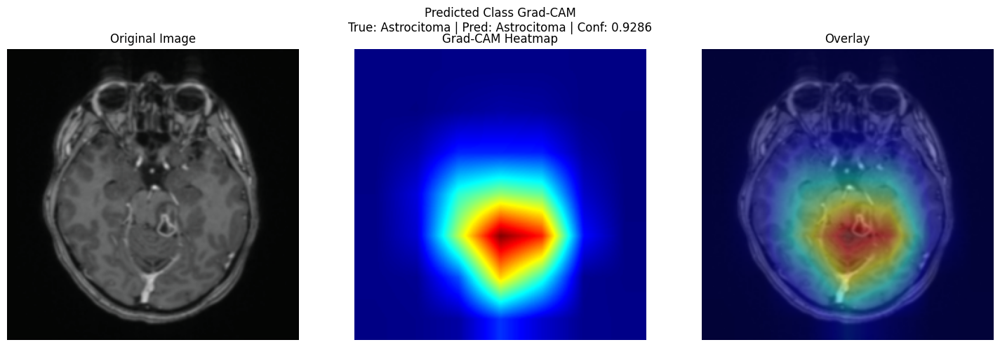

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Astrocitoma_idx_20.png

Class: Carcinoma | sample_idx: 32


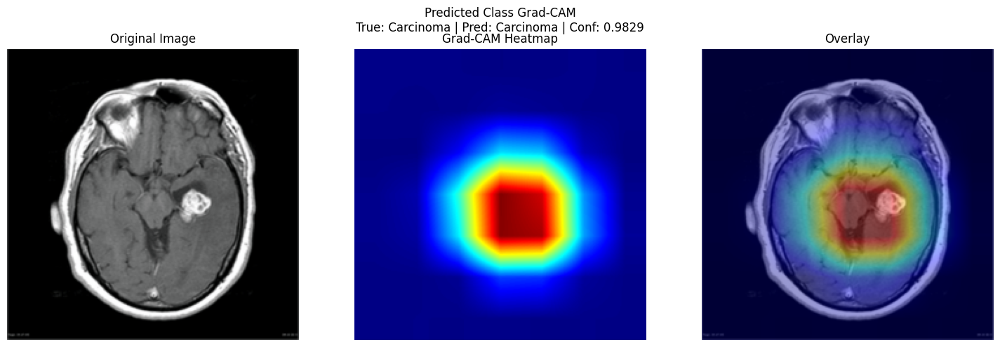

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Carcinoma_idx_32.png

Class: Ependimoma | sample_idx: 231


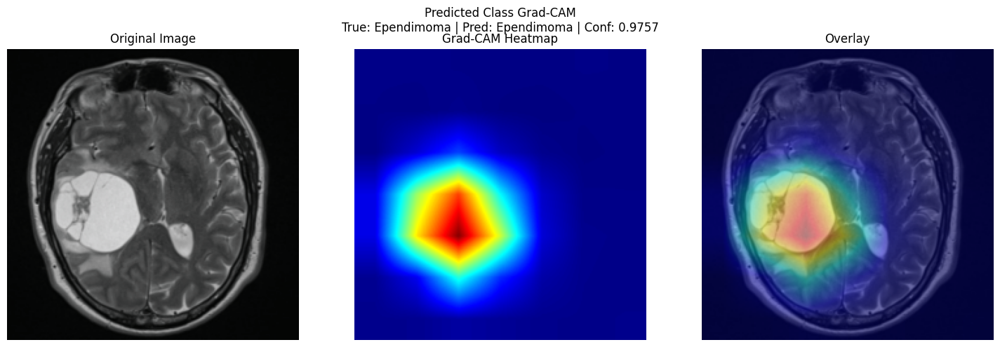

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Ependimoma_idx_231.png

Class: Ganglioglioma | sample_idx: 235


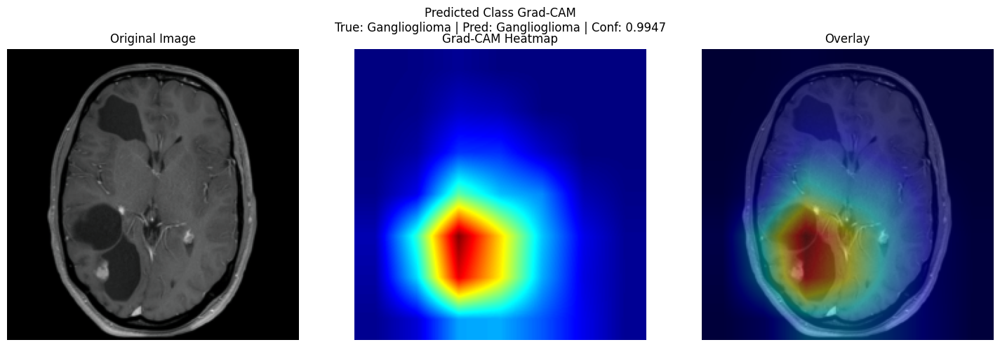

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Ganglioglioma_idx_235.png

Class: Germinoma | sample_idx: 441


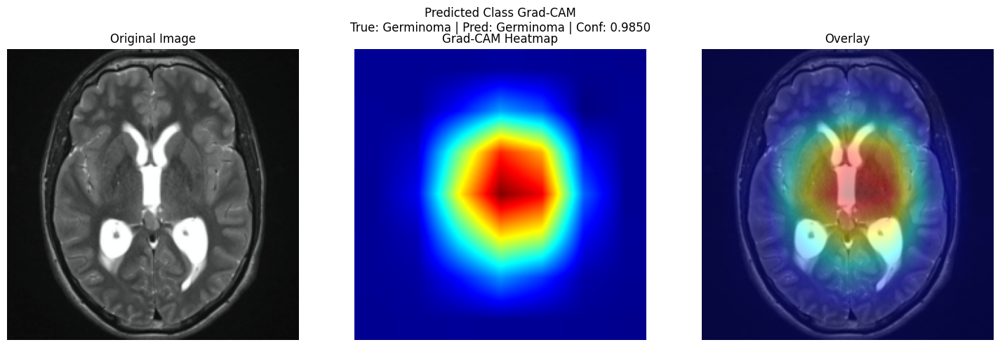

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Germinoma_idx_441.png

Class: Glioblastoma | sample_idx: 448


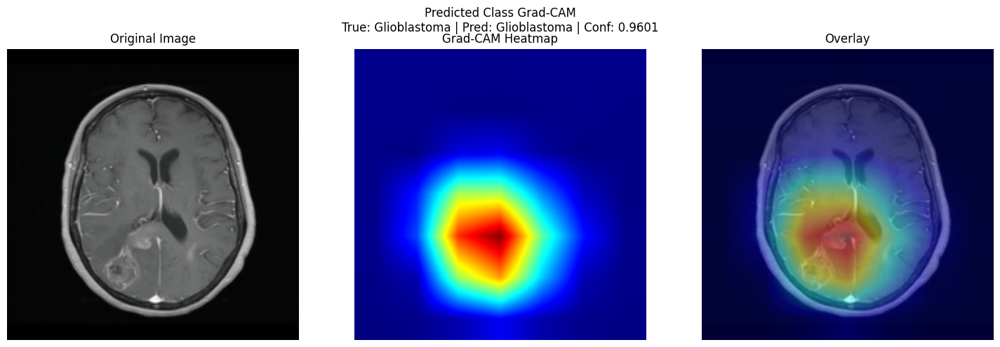

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Glioblastoma_idx_448.png

Class: Granuloma | sample_idx: 57


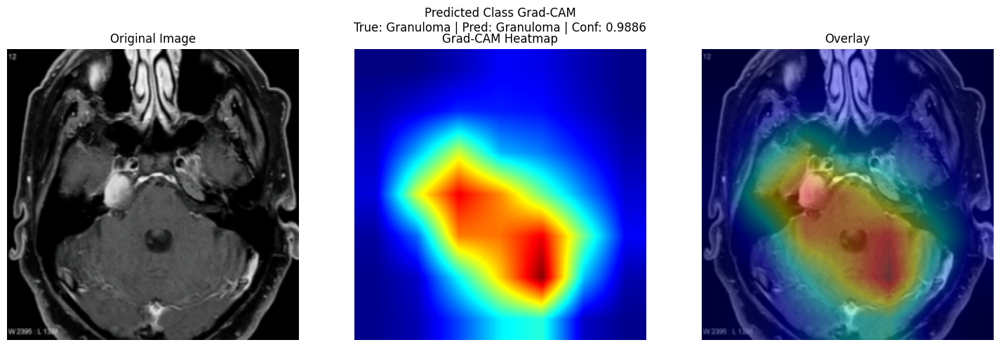

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Granuloma_idx_57.png

Class: Meduloblastoma | sample_idx: 255


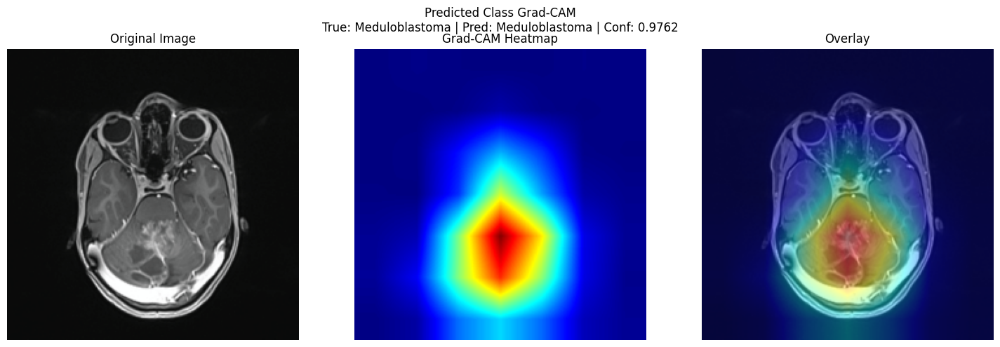

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Meduloblastoma_idx_255.png

Class: Meningioma | sample_idx: 491


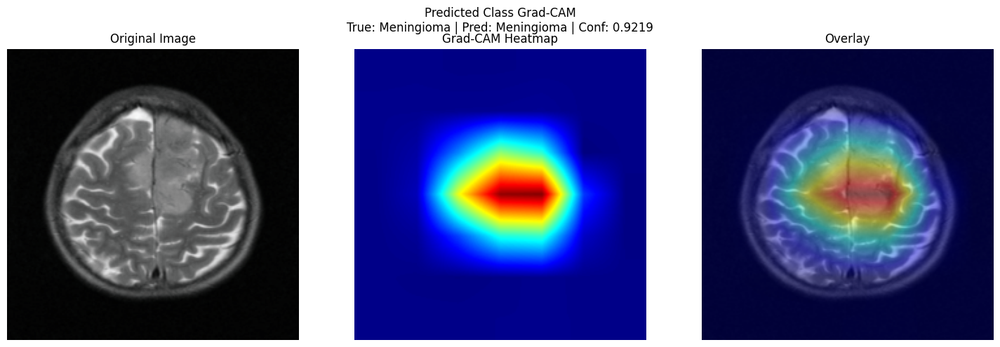

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Meningioma_idx_491.png

Class: Neurocitoma | sample_idx: 317


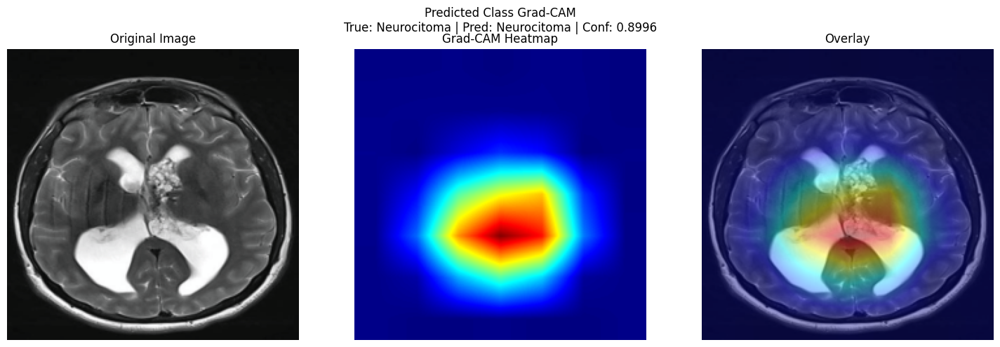

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Neurocitoma_idx_317.png

Class: Oligodendroglioma | sample_idx: 137


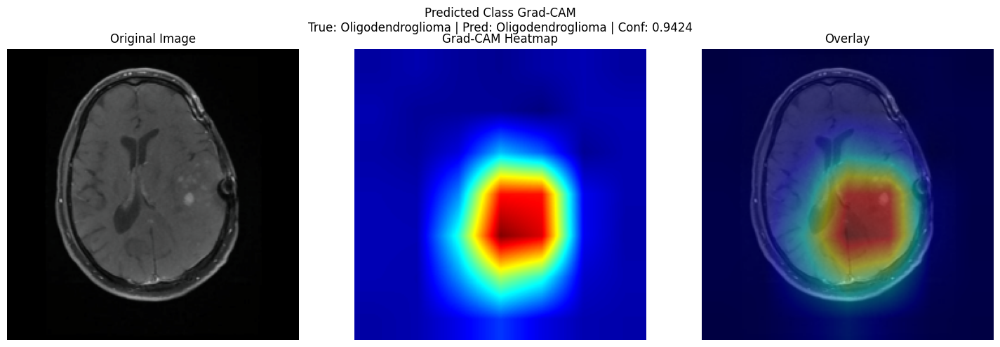

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Oligodendroglioma_idx_137.png

Class: Papiloma | sample_idx: 558


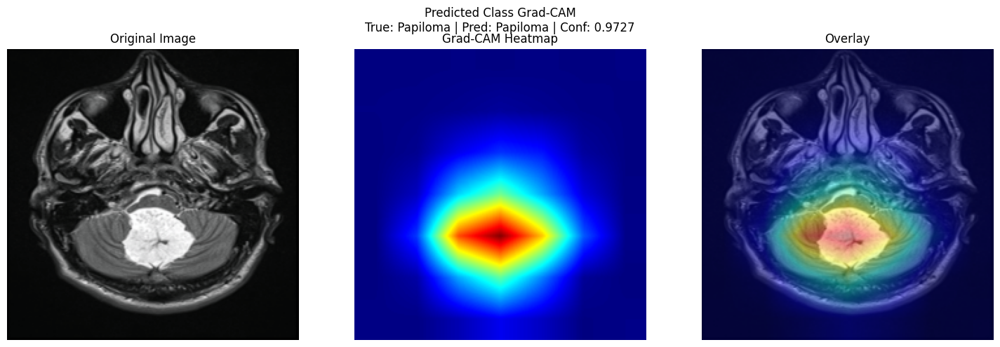

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Papiloma_idx_558.png

Class: Schwannoma | sample_idx: 160


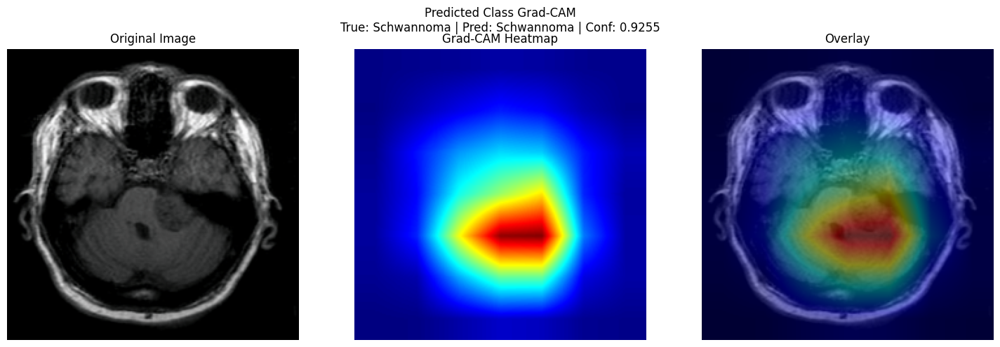

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Schwannoma_idx_160.png

Class: Tuberculoma | sample_idx: 378


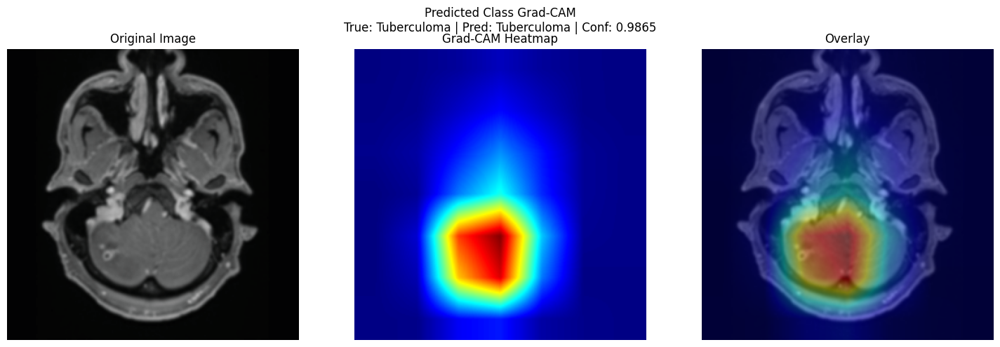

✅ Saved Grad-CAM to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/gradcam_classwise_Tuberculoma_idx_378.png

✅ Class-wise Grad-CAM generation complete
Summary CSV: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/classwise_examples/classwise_gradcam_examples_summary.csv


,class_name,sample_idx,image_path,true_class,pred_class,confidence,saved_file
0,Astrocitoma,20,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Astrocitoma,Astrocitoma,0.928567,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
1,Carcinoma,32,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Carcinoma,Carcinoma,0.982855,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
2,Ependimoma,231,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Ependimoma,Ependimoma,0.975650,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
3,Ganglioglioma,235,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Ganglioglioma,Ganglioglioma,0.994716,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
4,Germinoma,441,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Germinoma,Germinoma,0.984990,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
5,Glioblastoma,448,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Glioblastoma,Glioblastoma,0.960096,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
6,Granuloma,57,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Granuloma,Granuloma,0.988566,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
7,Meduloblastoma,255,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Meduloblastoma,Meduloblastoma,0.976199,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
8,Meningioma,491,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Meningioma,Meningioma,0.921862,/content/drive/MyDrive/Brain_Tumor_Hierarchica...
9,Neurocitoma,317,/content/drive/MyDrive/Brain_Tumor_Hierarchica...,Neurocitoma,Neurocitoma,0.899620,/content/drive/MyDrive/Brain_Tumor_Hierarchica...


In [ ]:
# ============================================================
# Grad-CAM Cell 3: One Correct Grad-CAM Example Per Abnormal Class
# Paper-ready class-wise examples
# ============================================================

import os
import pandas as pd
import matplotlib.pyplot as plt

set_seed(SEED)

CLASSWISE_GRADCAM_DIR = os.path.join(GRADCAM_DIR, "classwise_examples")
os.makedirs(CLASSWISE_GRADCAM_DIR, exist_ok=True)

# Use prediction summary from Cell 2
if "expert_test_results_df" not in globals():
    GRADCAM_PREDICTIONS_CSV = os.path.join(
        GRADCAM_DIR,
        "stage2_gradcam_prediction_summary.csv"
    )
    expert_test_results_df = pd.read_csv(GRADCAM_PREDICTIONS_CSV)

print("Generating one correct Grad-CAM example per abnormal class...")

classwise_records = []

for class_name in ABNORMAL_CLASS_NAMES:
    class_df = expert_test_results_df[
        (expert_test_results_df["true_class"] == class_name) &
        (expert_test_results_df["correct"] == 1)
    ].copy()

    if len(class_df) == 0:
        print(f"⚠️ No correctly classified sample found for: {class_name}")
        continue

    # Choose highest-confidence correct prediction for a clean paper figure
    selected_row = class_df.sort_values(
        "confidence",
        ascending=False
    ).iloc[0]

    sample_idx = int(selected_row["sample_idx"])

    safe_class_name = class_name.replace(" ", "_").replace("/", "_")

    save_name = f"gradcam_classwise_{safe_class_name}_idx_{sample_idx}.png"

    print(f"\nClass: {class_name} | sample_idx: {sample_idx}")

    info = generate_gradcam_for_sample(
        df=expert_test_df,
        sample_idx=sample_idx,
        save_name=os.path.join("classwise_examples", save_name),
        use_true_class=False
    )

    classwise_records.append({
        "class_name": class_name,
        "sample_idx": sample_idx,
        "image_path": info["image_path"],
        "true_class": info["true_class"],
        "pred_class": info["pred_class"],
        "confidence": info["confidence"],
        "saved_file": os.path.join(CLASSWISE_GRADCAM_DIR, save_name)
    })

classwise_df = pd.DataFrame(classwise_records)

CLASSWISE_GRADCAM_CSV = os.path.join(
    CLASSWISE_GRADCAM_DIR,
    "classwise_gradcam_examples_summary.csv"
)

classwise_df.to_csv(CLASSWISE_GRADCAM_CSV, index=False)

print("\n✅ Class-wise Grad-CAM generation complete")
print(f"Summary CSV: {CLASSWISE_GRADCAM_CSV}")
display(classwise_df)

## 20. Class-Wise Grad-CAM Visualization

This section generates one representative Grad-CAM example for each of the 14 abnormal tumor classes. Class-wise explanations help demonstrate that the expert model produces interpretable visual evidence across all tumor subtypes, rather than only for selected examples.

Loaded Grad-CAM images: 14


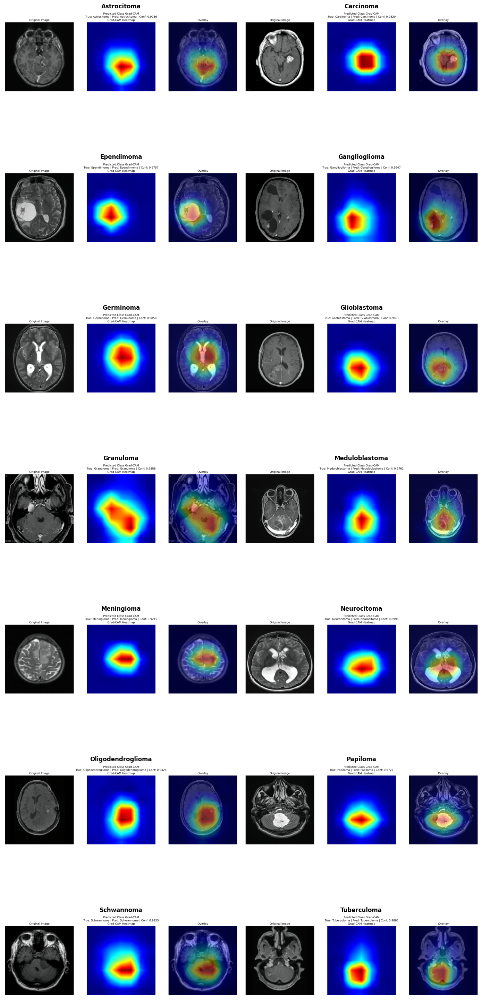

✅ Paper-ready Grad-CAM grid saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/gradcam/paper_ready_classwise_gradcam_grid.png


In [ ]:
# ============================================================
# Grad-CAM Cell 4: Create Paper-Ready Grid of Class-wise Grad-CAMs
# ============================================================

import os
import cv2
import math
import pandas as pd
import matplotlib.pyplot as plt

set_seed(SEED)

CLASSWISE_GRADCAM_DIR = os.path.join(GRADCAM_DIR, "classwise_examples")

CLASSWISE_GRADCAM_CSV = os.path.join(
    CLASSWISE_GRADCAM_DIR,
    "classwise_gradcam_examples_summary.csv"
)

classwise_df = pd.read_csv(CLASSWISE_GRADCAM_CSV)

GRID_SAVE_PATH = os.path.join(
    GRADCAM_DIR,
    "paper_ready_classwise_gradcam_grid.png"
)

# -------------------------
# Read saved Grad-CAM figures
# -------------------------

images = []

for _, row in classwise_df.iterrows():
    class_name = row["class_name"]
    img_path = row["saved_file"]

    if not os.path.exists(img_path):
        print(f"⚠️ Missing file: {img_path}")
        continue

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    images.append((class_name, img))

print(f"Loaded Grad-CAM images: {len(images)}")

# -------------------------
# Plot grid
# -------------------------

cols = 2
rows = math.ceil(len(images) / cols)

plt.figure(figsize=(14, rows * 4.5))

for i, (class_name, img) in enumerate(images, start=1):
    plt.subplot(rows, cols, i)
    plt.imshow(img)
    plt.title(class_name, fontsize=12, fontweight="bold")
    plt.axis("off")

plt.tight_layout()
plt.savefig(GRID_SAVE_PATH, dpi=300, bbox_inches="tight")
plt.show()

print(f"✅ Paper-ready Grad-CAM grid saved to: {GRID_SAVE_PATH}")

## 24. External Validation on Figshare Brain Tumor Dataset

This section evaluates generalization using the external Figshare brain tumor dataset.

Because Figshare contains glioma, meningioma, and pituitary tumor classes, and only Meningioma exactly overlaps with the proposed taxonomy, external subtype-level validation is restricted to Meningioma. Glioma and pituitary are used only for router-level abnormal-case evaluation.

This avoids invalid label mapping while still testing cross-dataset generalization.

In [ ]:
# ============================================================
# FIXED Figshare Download + Extraction + Metadata Builder
# Handles nested zip files and .mat Figshare format
# ============================================================

import os
import sys
import json
import shutil
import zipfile
import subprocess
import numpy as np
import pandas as pd
from PIL import Image

set_seed(SEED)

# -------------------------
# Figshare Kaggle mirror
# -------------------------

FIGSHARE_KAGGLE_SLUG = "ashkhagan/figshare-brain-tumor-dataset"

FIGSHARE_ROOT_DIR = "/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/external"
FIGSHARE_DATA_DIR = os.path.join(FIGSHARE_ROOT_DIR, "figshare_brain_tumor_dataset")

os.makedirs(FIGSHARE_DATA_DIR, exist_ok=True)

IMAGE_EXTENSIONS = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")
MAT_EXTENSIONS = (".mat",)

FIGSHARE_RESULTS_DIR = os.path.join(
    RESULTS_DIR,
    "external_validation_figshare_meningioma"
)
os.makedirs(FIGSHARE_RESULTS_DIR, exist_ok=True)

FIGSHARE_METADATA_CSV = os.path.join(
    FIGSHARE_RESULTS_DIR,
    "figshare_external_metadata.csv"
)

FIGSHARE_ROUTER_JSON = os.path.join(
    FIGSHARE_RESULTS_DIR,
    "figshare_router_abnormal_validation_metrics.json"
)

FIGSHARE_MENINGIOMA_JSON = os.path.join(
    FIGSHARE_RESULTS_DIR,
    "figshare_meningioma_overlap_pipeline_metrics.json"
)

FIGSHARE_MENINGIOMA_PRED_CSV = os.path.join(
    FIGSHARE_RESULTS_DIR,
    "figshare_meningioma_overlap_predictions.csv"
)

FIGSHARE_ROUTER_PRED_CSV = os.path.join(
    FIGSHARE_RESULTS_DIR,
    "figshare_router_all_abnormal_predictions.csv"
)

# -------------------------
# Kaggle setup
# -------------------------

def setup_kaggle_credentials():
    kaggle_dir = "/root/.kaggle"
    kaggle_json = os.path.join(kaggle_dir, "kaggle.json")

    possible_paths = [
        "/content/kaggle.json",
        "/content/drive/MyDrive/kaggle.json",
        "/content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/kaggle.json"
    ]

    os.makedirs(kaggle_dir, exist_ok=True)

    if os.path.exists(kaggle_json):
        os.chmod(kaggle_json, 0o600)
        print("✅ Kaggle credentials already found.")
        return

    for path in possible_paths:
        if os.path.exists(path):
            shutil.copy(path, kaggle_json)
            os.chmod(kaggle_json, 0o600)
            print(f"✅ Kaggle credentials copied from: {path}")
            return

    raise FileNotFoundError(
        "kaggle.json not found. Upload it to Colab or MyDrive, then rerun."
    )

def count_relevant_files(folder):
    count = 0
    for root, _, files in os.walk(folder):
        for file in files:
            if file.lower().endswith(IMAGE_EXTENSIONS + MAT_EXTENSIONS + (".zip",)):
                count += 1
    return count

# -------------------------
# Download if folder is empty
# -------------------------

existing_count = count_relevant_files(FIGSHARE_DATA_DIR)

if existing_count == 0:
    print("Figshare dataset not found in Drive. Downloading from Kaggle...")

    setup_kaggle_credentials()

    try:
        import kaggle
    except Exception:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "kaggle"])

    subprocess.run(
        [
            "kaggle",
            "datasets",
            "download",
            "-d",
            FIGSHARE_KAGGLE_SLUG,
            "-p",
            FIGSHARE_DATA_DIR,
            "--unzip"
        ],
        check=True
    )

    print("✅ Figshare dataset downloaded.")
else:
    print(f"✅ Figshare dataset already exists. Relevant files found: {existing_count}")

print(f"Figshare dataset folder: {FIGSHARE_DATA_DIR}")

# -------------------------
# Extract nested zip files if any
# -------------------------

def unzip_nested_files(folder):
    extracted_any = True

    while extracted_any:
        extracted_any = False

        for root, _, files in os.walk(folder):
            for file in files:
                if not file.lower().endswith(".zip"):
                    continue

                zip_path = os.path.join(root, file)
                extract_dir = os.path.join(root, file.replace(".zip", ""))

                if os.path.exists(extract_dir) and len(os.listdir(extract_dir)) > 0:
                    continue

                os.makedirs(extract_dir, exist_ok=True)

                print(f"Extracting nested zip: {zip_path}")
                try:
                    with zipfile.ZipFile(zip_path, "r") as z:
                        z.extractall(extract_dir)
                    extracted_any = True
                except Exception as e:
                    print(f"⚠️ Could not extract {zip_path}: {e}")

unzip_nested_files(FIGSHARE_DATA_DIR)

# -------------------------
# Show folder/file structure for sanity
# -------------------------

print("\n================ Figshare Folder Preview ================")

preview_count = 0
for root, dirs, files in os.walk(FIGSHARE_DATA_DIR):
    level = root.replace(FIGSHARE_DATA_DIR, "").count(os.sep)
    indent = "  " * level
    print(f"{indent}{os.path.basename(root)}/")

    subindent = "  " * (level + 1)
    for file in files[:5]:
        print(f"{subindent}{file}")

    preview_count += 1
    if preview_count >= 20:
        print("... preview truncated ...")
        break

# -------------------------
# Figshare label maps
# Official .mat labels:
# 1 = meningioma
# 2 = glioma
# 3 = pituitary
# -------------------------

FIGSHARE_MAT_LABEL_MAP = {
    1: "meningioma",
    2: "glioma",
    3: "pituitary"
}

FIGSHARE_FOLDER_LABELS = {
    "meningioma": "Meningioma",
    "meningioma_tumor": "Meningioma",
    "glioma": None,
    "glioma_tumor": None,
    "pituitary": None,
    "pituitary_tumor": None
}

ROUTER_ABNORMAL_KEYS = {
    "meningioma",
    "meningioma_tumor",
    "glioma",
    "glioma_tumor",
    "pituitary",
    "pituitary_tumor"
}

def normalize_label_name(name):
    name = str(name).strip().lower()
    name = name.replace(" ", "_").replace("-", "_")
    name = name.replace("__", "_")
    return name

# -------------------------
# Robust .mat label reader
# Handles old MATLAB and HDF5 v7.3 files
# -------------------------

def read_mat_label(mat_path):
    # Try scipy first
    try:
        import scipy.io as sio

        data = sio.loadmat(mat_path)
        cjdata = data["cjdata"]
        label = int(np.array(cjdata[0, 0]["label"]).squeeze())
        return FIGSHARE_MAT_LABEL_MAP.get(label, None)

    except Exception:
        pass

    # Try h5py for MATLAB v7.3
    try:
        import h5py

        with h5py.File(mat_path, "r") as f:
            if "cjdata" not in f:
                return None

            cjdata = f["cjdata"]

            if "label" not in cjdata:
                return None

            label = int(np.array(cjdata["label"]).squeeze())
            return FIGSHARE_MAT_LABEL_MAP.get(label, None)

    except Exception:
        return None

# -------------------------
# Robust .mat image reader
# Used later by validation Dataset
# -------------------------

def read_mat_image(mat_path):
    # Try scipy first
    try:
        import scipy.io as sio

        data = sio.loadmat(mat_path)
        cjdata = data["cjdata"]
        img = np.array(cjdata[0, 0]["image"])

    except Exception:
        # Try h5py for v7.3
        import h5py

        with h5py.File(mat_path, "r") as f:
            img = np.array(f["cjdata"]["image"])

        # Often HDF5 MATLAB arrays need transpose
        if img.ndim == 2:
            img = img.T

    img = img.astype(np.float32)
    img = img - img.min()

    if img.max() > 0:
        img = img / img.max()

    img = (img * 255).astype(np.uint8)

    return Image.fromarray(img).convert("RGB")

# -------------------------
# Build metadata
# -------------------------

figshare_rows = []

known_keys = set(FIGSHARE_FOLDER_LABELS.keys()) | ROUTER_ABNORMAL_KEYS

for root, _, files in os.walk(FIGSHARE_DATA_DIR):

    relative_parts = os.path.relpath(root, FIGSHARE_DATA_DIR).split(os.sep)

    folder_detected_key = None
    folder_detected_label = None

    for part in relative_parts:
        key = normalize_label_name(part)

        if key in known_keys:
            folder_detected_key = key
            folder_detected_label = part
            break

        if "meningioma" in key:
            folder_detected_key = "meningioma"
            folder_detected_label = part
            break

        if "glioma" in key:
            folder_detected_key = "glioma"
            folder_detected_label = part
            break

        if "pituitary" in key:
            folder_detected_key = "pituitary"
            folder_detected_label = part
            break

    for file in files:
        file_path = os.path.join(root, file)
        lower_file = file.lower()

        if not lower_file.endswith(IMAGE_EXTENSIONS + MAT_EXTENSIONS):
            continue

        detected_key = folder_detected_key
        detected_label = folder_detected_label

        # If .mat, get label from file itself
        if lower_file.endswith(MAT_EXTENSIONS):
            mat_key = read_mat_label(file_path)

            if mat_key is not None:
                detected_key = mat_key
                detected_label = mat_key

        if detected_key is None:
            continue

        mapped_class = FIGSHARE_FOLDER_LABELS.get(detected_key, None)

        # All Figshare samples are tumor images
        binary_label = 1
        router_usable = True

        # Exact overlap only: Meningioma
        if mapped_class == "Meningioma":
            full_pipeline_usable = True
            global_label = int(class_to_idx["Meningioma"])
        else:
            full_pipeline_usable = False
            global_label = None

        figshare_rows.append({
            "path": file_path,
            "external_label": detected_label,
            "external_key": detected_key,
            "mapped_class": mapped_class,
            "label": global_label,
            "binary_label": binary_label,
            "router_usable": router_usable,
            "full_pipeline_usable": full_pipeline_usable,
            "file_type": "mat" if lower_file.endswith(MAT_EXTENSIONS) else "image"
        })

figshare_df = pd.DataFrame(figshare_rows)

if len(figshare_df) == 0:
    print("\n❌ No usable files detected.")
    print("Run the folder preview above and send it to me.")
    raise RuntimeError(
        f"No usable Figshare images or .mat files found in: {FIGSHARE_DATA_DIR}"
    )

figshare_df.to_csv(FIGSHARE_METADATA_CSV, index=False)

print("\n================ Figshare Metadata ================")
print(f"Total usable files found: {len(figshare_df)}")
print(f"Router-usable abnormal files: {figshare_df['router_usable'].sum()}")
print(f"Meningioma overlap files: {figshare_df['full_pipeline_usable'].sum()}")

print("\nExternal labels:")
print(figshare_df["external_key"].value_counts())

print("\nMapped classes:")
print(figshare_df["mapped_class"].value_counts(dropna=False))

print("\nFile types:")
print(figshare_df["file_type"].value_counts())

print(f"\n✅ Metadata saved to: {FIGSHARE_METADATA_CSV}")

✅ Figshare dataset already exists. Relevant files found: 3065
Figshare dataset folder: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/data/external/figshare_brain_tumor_dataset

================ Figshare Folder Preview ================
figshare_brain_tumor_dataset/
  dataset/
    README.txt
    cvind.mat
    data/
      1.mat
      10.mat
      100.mat
      1000.mat
      1001.mat

================ Figshare Metadata ================
Total usable files found: 3064
Router-usable abnormal files: 3064
Meningioma overlap files: 708

External labels:
external_key
glioma        1426
pituitary      930
meningioma     708
Name: count, dtype: int64

Mapped classes:
mapped_class
None          2356
Meningioma     708
Name: count, dtype: int64

File types:
file_type
mat    3064
Name: count, dtype: int64

✅ Metadata saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/external_validation_figshare_meningioma/figshare_external_metadata.csv


In [ ]:
# ============================================================
# Figshare External Evaluation
# Uses existing figshare_df created from .mat metadata
# 1. Router validation on all Figshare images as abnormal
# 2. Full pipeline validation on Meningioma only
# ============================================================

import os
import json
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

set_seed(SEED)

# -------------------------
# Output paths
# -------------------------

FIGSHARE_RESULTS_DIR = os.path.join(
    RESULTS_DIR,
    "external_validation_figshare_meningioma"
)
os.makedirs(FIGSHARE_RESULTS_DIR, exist_ok=True)

FIGSHARE_ROUTER_JSON = os.path.join(
    FIGSHARE_RESULTS_DIR,
    "figshare_router_abnormal_validation_metrics.json"
)

FIGSHARE_MENINGIOMA_JSON = os.path.join(
    FIGSHARE_RESULTS_DIR,
    "figshare_meningioma_overlap_pipeline_metrics.json"
)

FIGSHARE_ROUTER_PRED_CSV = os.path.join(
    FIGSHARE_RESULTS_DIR,
    "figshare_router_all_abnormal_predictions.csv"
)

FIGSHARE_MENINGIOMA_PRED_CSV = os.path.join(
    FIGSHARE_RESULTS_DIR,
    "figshare_meningioma_overlap_predictions.csv"
)

# ============================================================
# Dataset class
# ============================================================

class FigshareValidationDataset(Dataset):
    def __init__(self, dataframe, transform, target_col):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform
        self.target_col = target_col

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        path = row["path"]

        if str(row.get("file_type", "image")) == "mat":
            image = read_mat_image(path)
        else:
            image = Image.open(path).convert("RGB")

        image = self.transform(image)
        label = int(row[self.target_col])

        return image, label

# ============================================================
# 1. Router validation on all Figshare images
# All Figshare images are tumor cases, so ground truth = Abnormal
# ============================================================

router_figshare_df = figshare_df[
    figshare_df["router_usable"] == True
].copy().reset_index(drop=True)

router_figshare_dataset = FigshareValidationDataset(
    router_figshare_df,
    transform=router_eval_transform,
    target_col="binary_label"
)

router_figshare_loader = DataLoader(
    router_figshare_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

router.eval()

y_true_router = []
y_pred_router = []

with torch.no_grad():
    for images, labels in tqdm(router_figshare_loader, desc="Figshare router abnormal validation"):
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        logits = router(images)
        preds = torch.argmax(logits, dim=1)

        y_true_router.extend(labels.cpu().numpy())
        y_pred_router.extend(preds.cpu().numpy())

y_true_router = np.array(y_true_router)
y_pred_router = np.array(y_pred_router)

router_abnormal_recall = float(np.mean(y_pred_router == 1))
router_false_normal_rate = float(np.mean(y_pred_router == 0))

router_metrics = {
    "task": "Figshare external router validation; all samples are abnormal tumors",
    "num_samples": int(len(y_true_router)),
    "abnormal_recall": router_abnormal_recall,
    "false_normal_rate": router_false_normal_rate,
    "accuracy": accuracy_score(y_true_router, y_pred_router),
    "macro_precision": precision_score(y_true_router, y_pred_router, average="macro", zero_division=0),
    "macro_recall": recall_score(y_true_router, y_pred_router, average="macro", zero_division=0),
    "macro_f1": f1_score(y_true_router, y_pred_router, average="macro", zero_division=0),
    "weighted_f1": f1_score(y_true_router, y_pred_router, average="weighted", zero_division=0),
    "predicted_normal_count": int(np.sum(y_pred_router == 0)),
    "predicted_abnormal_count": int(np.sum(y_pred_router == 1)),
    "external_label_distribution": router_figshare_df["external_key"].value_counts().to_dict()
}

router_pred_df = router_figshare_df.copy()
router_pred_df["router_pred_binary"] = y_pred_router
router_pred_df["router_pred_name"] = [
    "Normal" if int(i) == 0 else "Abnormal" for i in y_pred_router
]

router_pred_df.to_csv(FIGSHARE_ROUTER_PRED_CSV, index=False)

print("\n================ Figshare Router Validation ================")
print(f"Samples:             {len(y_true_router)}")
print(f"Abnormal recall:     {router_abnormal_recall:.4f}")
print(f"False Normal rate:   {router_false_normal_rate:.4f}")
print(f"Accuracy:            {router_metrics['accuracy']:.4f}")
print(f"Predicted Normal:    {router_metrics['predicted_normal_count']}")
print(f"Predicted Abnormal:  {router_metrics['predicted_abnormal_count']}")

with open(FIGSHARE_ROUTER_JSON, "w") as f:
    json.dump(router_metrics, f, indent=4)

print(f"\n✅ Figshare router metrics saved to: {FIGSHARE_ROUTER_JSON}")
print(f"✅ Figshare router predictions saved to: {FIGSHARE_ROUTER_PRED_CSV}")

# ============================================================
# 2. Full pipeline validation on exact overlapping class: Meningioma
# Since only one exact class overlaps, report recognition rate / recall
# ============================================================

meningioma_df = figshare_df[
    figshare_df["full_pipeline_usable"] == True
].copy().reset_index(drop=True)

if len(meningioma_df) == 0:
    raise RuntimeError("No Meningioma files found for Figshare overlap validation.")

meningioma_dataset = FigshareValidationDataset(
    meningioma_df,
    transform=expert_eval_transform,
    target_col="label"
)

meningioma_loader = DataLoader(
    meningioma_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

router.eval()
expert.eval()

y_true = []
y_final = []
router_preds_all = []
expert_local_preds_all = []
expert_global_preds_all = []

with torch.no_grad():
    for images, labels in tqdm(meningioma_loader, desc="Figshare Meningioma overlap validation"):
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        router_logits = router(images)
        router_preds = torch.argmax(router_logits, dim=1)

        expert_logits = expert(images)
        expert_local_preds = torch.argmax(expert_logits, dim=1)

        final_preds = []
        expert_global_preds = []

        for r_pred, local_pred in zip(router_preds, expert_local_preds):
            local_pred = int(local_pred.item())
            global_pred = int(abnormal_local_to_global[local_pred])
            expert_global_preds.append(global_pred)

            if int(r_pred.item()) == 0:
                final_preds.append(int(NORMAL_IDX))
            else:
                final_preds.append(global_pred)

        y_true.extend(labels.cpu().numpy())
        y_final.extend(final_preds)
        router_preds_all.extend(router_preds.cpu().numpy())
        expert_local_preds_all.extend(expert_local_preds.cpu().numpy())
        expert_global_preds_all.extend(expert_global_preds)

y_true = np.array(y_true)
y_final = np.array(y_final)
router_preds_all = np.array(router_preds_all)
expert_local_preds_all = np.array(expert_local_preds_all)
expert_global_preds_all = np.array(expert_global_preds_all)

MENINGIOMA_IDX = int(class_to_idx["Meningioma"])

pipeline_meningioma_accuracy = float(np.mean(y_final == MENINGIOMA_IDX))
router_abnormal_rate_on_meningioma = float(np.mean(router_preds_all == 1))
router_false_normal_rate_on_meningioma = float(np.mean(router_preds_all == 0))
expert_only_meningioma_accuracy = float(np.mean(expert_global_preds_all == MENINGIOMA_IDX))

final_class_distribution = pd.Series(
    [idx_to_class[int(i)] for i in y_final]
).value_counts().to_dict()

expert_class_distribution = pd.Series(
    [idx_to_class[int(i)] for i in expert_global_preds_all]
).value_counts().to_dict()

meningioma_metrics = {
    "task": "Figshare external validation on exact overlapping class: Meningioma",
    "num_samples": int(len(y_true)),
    "overlap_class": "Meningioma",
    "meningioma_global_index": MENINGIOMA_IDX,
    "pipeline_meningioma_accuracy": pipeline_meningioma_accuracy,
    "pipeline_meningioma_recall": pipeline_meningioma_accuracy,
    "router_abnormal_rate_on_meningioma": router_abnormal_rate_on_meningioma,
    "router_false_normal_rate_on_meningioma": router_false_normal_rate_on_meningioma,
    "expert_only_meningioma_accuracy_ignoring_router": expert_only_meningioma_accuracy,
    "final_predicted_class_distribution": final_class_distribution,
    "expert_predicted_class_distribution": expert_class_distribution
}

pred_df = meningioma_df.copy()
pred_df["true_label"] = y_true
pred_df["true_class"] = "Meningioma"
pred_df["router_pred_binary"] = router_preds_all
pred_df["router_pred_name"] = [
    "Normal" if int(i) == 0 else "Abnormal" for i in router_preds_all
]
pred_df["expert_pred_local"] = expert_local_preds_all
pred_df["expert_pred_global"] = expert_global_preds_all
pred_df["expert_pred_class"] = [idx_to_class[int(i)] for i in expert_global_preds_all]
pred_df["final_pred_label"] = y_final
pred_df["final_pred_class"] = [idx_to_class[int(i)] for i in y_final]
pred_df["correct_meningioma"] = pred_df["final_pred_label"] == MENINGIOMA_IDX

pred_df.to_csv(FIGSHARE_MENINGIOMA_PRED_CSV, index=False)

print("\n================ Figshare Meningioma Overlap Validation ================")
print(f"Samples: {len(y_true)}")
print(f"Pipeline Meningioma accuracy/recall: {pipeline_meningioma_accuracy:.4f}")
print(f"Router abnormal rate on Meningioma:  {router_abnormal_rate_on_meningioma:.4f}")
print(f"Router false-normal rate:            {router_false_normal_rate_on_meningioma:.4f}")
print(f"Expert-only Meningioma accuracy:     {expert_only_meningioma_accuracy:.4f}")

print("\nFinal predicted class distribution:")
print(pd.Series([idx_to_class[int(i)] for i in y_final]).value_counts())

with open(FIGSHARE_MENINGIOMA_JSON, "w") as f:
    json.dump(meningioma_metrics, f, indent=4)

print(f"\n✅ Figshare Meningioma metrics saved to: {FIGSHARE_MENINGIOMA_JSON}")
print(f"✅ Figshare Meningioma predictions saved to: {FIGSHARE_MENINGIOMA_PRED_CSV}")

Figshare router abnormal validation: 100%|██████████| 192/192 [00:53<00:00,  3.56it/s]



================ Figshare Router Validation ================
Samples:             3064
Abnormal recall:     0.9990
False Normal rate:   0.0010
Accuracy:            0.9990
Predicted Normal:    3
Predicted Abnormal:  3061

✅ Figshare router metrics saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/external_validation_figshare_meningioma/figshare_router_abnormal_validation_metrics.json
✅ Figshare router predictions saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/external_validation_figshare_meningioma/figshare_router_all_abnormal_predictions.csv


Figshare Meningioma overlap validation: 100%|██████████| 45/45 [00:13<00:00,  3.42it/s]



================ Figshare Meningioma Overlap Validation ================
Samples: 708
Pipeline Meningioma accuracy/recall: 0.4760
Router abnormal rate on Meningioma:  0.9986
Router false-normal rate:            0.0014
Expert-only Meningioma accuracy:     0.4760

Final predicted class distribution:
Meningioma           337
Granuloma            110
Ganglioglioma         57
Glioblastoma          56
Schwannoma            54
Astrocitoma           43
Papiloma              14
Neurocitoma            9
Tuberculoma            8
Oligodendroglioma      7
Carcinoma              6
Ependimoma             5
Meduloblastoma         1
Normal                 1
Name: count, dtype: int64

✅ Figshare Meningioma metrics saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/external_validation_figshare_meningioma/figshare_meningioma_overlap_pipeline_metrics.json
✅ Figshare Meningioma predictions saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/external_validation_f

## 25. Final Results Summary

This section summarizes the main experimental findings, including internal performance, baseline comparison, ablation results, uncertainty, calibration, robustness, explainability, latency, and external validation.

The final results are used to support the paper’s main claims and limitations.

In [ ]:
# ============================================================
# Cell 25: Final Results Summary
# Collects all key experiment outputs into paper-ready summaries
# ============================================================

import os
import json
import numpy as np
import pandas as pd

set_seed(SEED)

# ============================================================
# Output folder
# ============================================================

FINAL_SUMMARY_DIR = os.path.join(RESULTS_DIR, "final_summary")
os.makedirs(FINAL_SUMMARY_DIR, exist_ok=True)

FINAL_SUMMARY_CSV = os.path.join(
    FINAL_SUMMARY_DIR,
    "final_project_summary.csv"
)

FINAL_SUMMARY_MD = os.path.join(
    FINAL_SUMMARY_DIR,
    "final_project_summary.md"
)

FINAL_KEY_TABLES_XLSX = os.path.join(
    FINAL_SUMMARY_DIR,
    "final_project_summary_tables.xlsx"
)

print(f"✅ Final summary folder: {FINAL_SUMMARY_DIR}")

# ============================================================
# Helper functions
# ============================================================

def load_json_safe(path):
    if path is None or not os.path.exists(path):
        print(f"⚠️ Missing JSON: {path}")
        return None
    with open(path, "r") as f:
        return json.load(f)

def load_csv_safe(path):
    if path is None or not os.path.exists(path):
        print(f"⚠️ Missing CSV: {path}")
        return None
    return pd.read_csv(path)

def get_nested(d, keys, default=np.nan):
    if d is None:
        return default

    cur = d
    for key in keys:
        if isinstance(cur, dict) and key in cur:
            cur = cur[key]
        else:
            return default
    return cur

def round_value(x, digits=4):
    try:
        if pd.isna(x):
            return x
        return round(float(x), digits)
    except Exception:
        return x

def add_summary_row(rows, section, metric, value, interpretation=""):
    rows.append({
        "Section": section,
        "Metric": metric,
        "Value": round_value(value),
        "Interpretation": interpretation
    })

# ============================================================
# Known result paths
# ============================================================

PIPELINE_METRICS_JSON = os.path.join(
    METRICS_DIR,
    "full_hierarchical_pipeline_14class_expert_test_metrics.json"
)

STATS_RESULTS_JSON = os.path.join(
    METRICS_DIR,
    "statistical_confidence_intervals_pipeline.json"
)

CALIBRATION_JSON = os.path.join(
    METRICS_DIR,
    "calibration_ece_full_hierarchical_pipeline.json"
)

UNCERTAINTY_JSON = os.path.join(
    METRICS_DIR,
    "uncertainty_analysis_full_pipeline.json"
)

ROBUSTNESS_CSV = os.path.join(
    METRICS_DIR,
    "noise_robustness_full_hierarchical_pipeline.csv"
)

BASELINE_CSV = os.path.join(
    METRICS_DIR,
    "flat15_baseline_vs_hierarchical14expert_summary.csv"
)

ABLATION_CSV = os.path.join(
    METRICS_DIR,
    "architecture_ablation_router_expert_summary.csv"
)

LATENCY_JSON = os.path.join(
    METRICS_DIR,
    "latency_comparison_flat_vs_hierarchical.json"
)

FIGSHARE_ROUTER_JSON = os.path.join(
    RESULTS_DIR,
    "external_validation_figshare_meningioma",
    "figshare_router_abnormal_validation_metrics.json"
)

FIGSHARE_MENINGIOMA_JSON = os.path.join(
    RESULTS_DIR,
    "external_validation_figshare_meningioma",
    "figshare_meningioma_overlap_pipeline_metrics.json"
)

GRADCAM_CLASSWISE_CSV = os.path.join(
    RESULTS_DIR,
    "gradcam",
    "classwise_examples",
    "classwise_gradcam_examples_summary.csv"
)

IG_CLASSWISE_CSV = os.path.join(
    RESULTS_DIR,
    "integrated_gradients",
    "classwise_examples",
    "integrated_gradients_classwise_examples_summary.csv"
)

# ============================================================
# Load all available outputs
# ============================================================

pipeline_data = load_json_safe(PIPELINE_METRICS_JSON)
stats_data = load_json_safe(STATS_RESULTS_JSON)
calibration_data = load_json_safe(CALIBRATION_JSON)
uncertainty_data = load_json_safe(UNCERTAINTY_JSON)
latency_data = load_json_safe(LATENCY_JSON)
figshare_router_data = load_json_safe(FIGSHARE_ROUTER_JSON)
figshare_meningioma_data = load_json_safe(FIGSHARE_MENINGIOMA_JSON)

robustness_df = load_csv_safe(ROBUSTNESS_CSV)
baseline_df = load_csv_safe(BASELINE_CSV)
ablation_df = load_csv_safe(ABLATION_CSV)
gradcam_df = load_csv_safe(GRADCAM_CLASSWISE_CSV)
ig_df = load_csv_safe(IG_CLASSWISE_CSV)

summary_rows = []

# ============================================================
# 1. Internal full pipeline performance
# ============================================================

add_summary_row(
    summary_rows,
    "Internal Test Performance",
    "Full pipeline accuracy",
    get_nested(pipeline_data, ["test_metrics", "accuracy"]),
    "Final 15-class hierarchical pipeline accuracy on held-out internal test set."
)

add_summary_row(
    summary_rows,
    "Internal Test Performance",
    "Full pipeline macro-F1",
    get_nested(pipeline_data, ["test_metrics", "macro_f1"]),
    "Macro-F1 is important because the dataset is class-imbalanced."
)

add_summary_row(
    summary_rows,
    "Internal Test Performance",
    "Full pipeline weighted-F1",
    get_nested(pipeline_data, ["test_metrics", "weighted_f1"]),
    "Weighted-F1 reflects performance considering class frequency."
)

# ============================================================
# 2. Statistical confidence intervals
# ============================================================

if stats_data is not None:
    ci = stats_data.get("bootstrap_95ci", {})

    for metric_name in ["accuracy", "macro_f1", "weighted_f1"]:
        metric_ci = ci.get(metric_name, {})
        ci_text = (
            f"{round_value(metric_ci.get('ci_lower'))}–"
            f"{round_value(metric_ci.get('ci_upper'))}"
        )

        add_summary_row(
            summary_rows,
            "Statistical Confidence",
            f"{metric_name} 95% CI",
            ci_text,
            "Bootstrap confidence interval from held-out test predictions."
        )

# ============================================================
# 3. Calibration
# ============================================================

add_summary_row(
    summary_rows,
    "Calibration",
    "Expected Calibration Error",
    get_nested(calibration_data, ["ece"]),
    "Lower ECE indicates better confidence calibration."
)

add_summary_row(
    summary_rows,
    "Calibration",
    "Maximum Calibration Error",
    get_nested(calibration_data, ["mce"]),
    "Largest confidence-accuracy gap across calibration bins."
)

add_summary_row(
    summary_rows,
    "Calibration",
    "Negative Log-Likelihood",
    get_nested(calibration_data, ["nll"]),
    "Measures probabilistic prediction quality."
)

add_summary_row(
    summary_rows,
    "Calibration",
    "Mean confidence",
    get_nested(calibration_data, ["mean_confidence"]),
    "Average confidence of final pipeline predictions."
)

# ============================================================
# 4. Uncertainty
# ============================================================

add_summary_row(
    summary_rows,
    "Uncertainty",
    "Mean entropy, correct predictions",
    get_nested(uncertainty_data, ["mean_entropy_correct"]),
    "Lower entropy for correct predictions suggests useful uncertainty behavior."
)

add_summary_row(
    summary_rows,
    "Uncertainty",
    "Mean entropy, incorrect predictions",
    get_nested(uncertainty_data, ["mean_entropy_wrong"]),
    "Higher entropy for incorrect predictions indicates errors tend to be more uncertain."
)

add_summary_row(
    summary_rows,
    "Uncertainty",
    "Mean confidence, correct predictions",
    get_nested(uncertainty_data, ["mean_confidence_correct"]),
    "Correct predictions should generally have higher confidence."
)

add_summary_row(
    summary_rows,
    "Uncertainty",
    "Mean confidence, incorrect predictions",
    get_nested(uncertainty_data, ["mean_confidence_wrong"]),
    "Lower confidence for incorrect predictions supports possible rejection/triage use."
)

# ============================================================
# 5. Robustness summary
# ============================================================

if robustness_df is not None:
    metric_col = "macro_f1" if "macro_f1" in robustness_df.columns else "Macro F1"

    clean_row = robustness_df[
        robustness_df["Condition"].astype(str).str.lower() == "clean"
    ]

    if len(clean_row) > 0:
        clean_macro_f1 = float(clean_row.iloc[0][metric_col])

        add_summary_row(
            summary_rows,
            "Robustness",
            "Clean macro-F1",
            clean_macro_f1,
            "Reference performance without perturbation."
        )

        non_clean_df = robustness_df[
            robustness_df["Condition"].astype(str).str.lower() != "clean"
        ].copy()

        if len(non_clean_df) > 0:
            worst_row = non_clean_df.sort_values(metric_col, ascending=True).iloc[0]
            best_row = non_clean_df.sort_values(metric_col, ascending=False).iloc[0]

            add_summary_row(
                summary_rows,
                "Robustness",
                "Most damaging perturbation",
                worst_row["Condition"],
                f"Macro-F1 under this perturbation = {round_value(worst_row[metric_col])}."
            )

            add_summary_row(
                summary_rows,
                "Robustness",
                "Best non-clean perturbation",
                best_row["Condition"],
                f"Macro-F1 under this perturbation = {round_value(best_row[metric_col])}."
            )

            add_summary_row(
                summary_rows,
                "Robustness",
                "Worst macro-F1 drop",
                clean_macro_f1 - float(worst_row[metric_col]),
                "Performance degradation under the hardest perturbation."
            )

# ============================================================
# 6. Baseline comparison
# ============================================================

if baseline_df is not None:
    macro_col = "Macro F1"
    acc_col = "Accuracy"

    hierarchy_mask = baseline_df["Model"].astype(str).str.lower().str.contains(
        "hierarchical|proposed|pipeline"
    )

    proposed_rows = baseline_df[hierarchy_mask]
    baseline_rows = baseline_df[~hierarchy_mask]

    if len(proposed_rows) > 0:
        proposed_row = proposed_rows.iloc[-1]

        add_summary_row(
            summary_rows,
            "Baseline Comparison",
            "Proposed hierarchy macro-F1",
            proposed_row.get(macro_col, np.nan),
            "Macro-F1 of the proposed full hierarchical pipeline."
        )

    if len(baseline_rows) > 0 and macro_col in baseline_rows.columns:
        best_baseline = baseline_rows.sort_values(macro_col, ascending=False).iloc[0]

        add_summary_row(
            summary_rows,
            "Baseline Comparison",
            "Best flat baseline",
            best_baseline["Model"],
            f"Best baseline macro-F1 = {round_value(best_baseline[macro_col])}."
        )

        if len(proposed_rows) > 0:
            proposed_macro = float(proposed_row[macro_col])
            best_macro = float(best_baseline[macro_col])

            add_summary_row(
                summary_rows,
                "Baseline Comparison",
                "Macro-F1 gain over best baseline",
                proposed_macro - best_macro,
                "Positive value means the hierarchy outperformed the best flat baseline."
            )

# ============================================================
# 7. Architecture ablation
# ============================================================

if ablation_df is not None:
    for variant in ["Proposed Full Hierarchy", "Without Router", "Without Expert", "Oracle Router"]:
        row_df = ablation_df[ablation_df["Variant"].astype(str) == variant]

        if len(row_df) > 0:
            row = row_df.iloc[0]

            acc_value = row.get("Overall Accuracy", row.get("Accuracy", np.nan))
            macro_value = row.get("Macro F1", np.nan)
            normal_recall = row.get("Normal Recall", np.nan)

            add_summary_row(
                summary_rows,
                "Architecture Ablation",
                f"{variant} accuracy",
                acc_value,
                f"Macro-F1 = {round_value(macro_value)}, Normal recall = {round_value(normal_recall)}."
            )

# ============================================================
# 8. Latency
# ============================================================

if latency_data is not None:
    true_normal_rate = latency_data.get("true_normal_rate", np.nan)
    expert_call_rate = latency_data.get("expert_call_rate", np.nan)

    add_summary_row(
        summary_rows,
        "Latency",
        "True Normal rate in test set",
        true_normal_rate,
        "Latency benefit depends on how often Normal cases can skip the expert."
    )

    add_summary_row(
        summary_rows,
        "Latency",
        "Expert call rate",
        expert_call_rate,
        "Fraction of samples that required Stage 2 expert inference."
    )

    latency_summary = latency_data.get("latency_summary", [])

    if isinstance(latency_summary, list):
        for item in latency_summary:
            method = item.get("Method", "")
            mean_ms = item.get("mean_ms", np.nan)

            if method:
                add_summary_row(
                    summary_rows,
                    "Latency",
                    f"{method} mean latency ms",
                    mean_ms,
                    "Batch-size-1 inference latency."
                )

# ============================================================
# 9. External Figshare validation
# ============================================================

add_summary_row(
    summary_rows,
    "External Validation - Figshare",
    "Router abnormal recall",
    get_nested(figshare_router_data, ["abnormal_recall"]),
    "All Figshare samples are tumor cases; this measures abnormal-case sensitivity."
)

add_summary_row(
    summary_rows,
    "External Validation - Figshare",
    "Router false-normal rate",
    get_nested(figshare_router_data, ["false_normal_rate"]),
    "Fraction of tumor cases incorrectly routed as Normal."
)

add_summary_row(
    summary_rows,
    "External Validation - Figshare",
    "Meningioma overlap samples",
    get_nested(figshare_meningioma_data, ["num_samples"]),
    "Only Meningioma exactly overlaps with the proposed taxonomy."
)

add_summary_row(
    summary_rows,
    "External Validation - Figshare",
    "Pipeline Meningioma recall",
    get_nested(figshare_meningioma_data, ["pipeline_meningioma_recall"]),
    "External subtype-level recognition rate for the overlapping Meningioma class."
)

add_summary_row(
    summary_rows,
    "External Validation - Figshare",
    "Expert-only Meningioma accuracy",
    get_nested(figshare_meningioma_data, ["expert_only_meningioma_accuracy_ignoring_router"]),
    "Stage 2 external Meningioma recognition without router effect."
)

# ============================================================
# 10. Explainability
# ============================================================

if gradcam_df is not None:
    add_summary_row(
        summary_rows,
        "Explainability",
        "Class-wise Grad-CAM examples",
        len(gradcam_df),
        "One Grad-CAM example was generated for each abnormal tumor class."
    )

if ig_df is not None:
    add_summary_row(
        summary_rows,
        "Explainability",
        "Class-wise Integrated Gradients examples",
        len(ig_df),
        "One Integrated Gradients example was generated for each abnormal tumor class."
    )

# ============================================================
# Build final summary dataframe
# ============================================================

final_summary_df = pd.DataFrame(summary_rows)

print("\n================ Final Project Summary ================")
display(final_summary_df)

final_summary_df.to_csv(FINAL_SUMMARY_CSV, index=False)

print(f"\n✅ Final summary CSV saved to: {FINAL_SUMMARY_CSV}")

# ============================================================
# Save important tables to Excel workbook
# ============================================================

tables_to_save = {
    "Final Summary": final_summary_df
}

if baseline_df is not None:
    tables_to_save["Baselines"] = baseline_df

if ablation_df is not None:
    tables_to_save["Ablation"] = ablation_df

if robustness_df is not None:
    tables_to_save["Robustness"] = robustness_df

if gradcam_df is not None:
    tables_to_save["GradCAM"] = gradcam_df

if ig_df is not None:
    tables_to_save["Integrated Gradients"] = ig_df

try:
    with pd.ExcelWriter(FINAL_KEY_TABLES_XLSX, engine="openpyxl") as writer:
        for sheet_name, table in tables_to_save.items():
            safe_sheet_name = sheet_name[:31]
            table.to_excel(writer, sheet_name=safe_sheet_name, index=False)

    print(f"✅ Excel summary workbook saved to: {FINAL_KEY_TABLES_XLSX}")

except Exception as e:
    print(f"⚠️ Could not save Excel workbook: {e}")

# ============================================================
# Create Markdown report for paper-writing
# ============================================================

def value_from_summary(section, metric):
    match = final_summary_df[
        (final_summary_df["Section"] == section) &
        (final_summary_df["Metric"] == metric)
    ]

    if len(match) == 0:
        return "N/A"

    return match.iloc[0]["Value"]

pipeline_acc = value_from_summary("Internal Test Performance", "Full pipeline accuracy")
pipeline_macro_f1 = value_from_summary("Internal Test Performance", "Full pipeline macro-F1")
ece_value = value_from_summary("Calibration", "Expected Calibration Error")
router_ext_recall = value_from_summary("External Validation - Figshare", "Router abnormal recall")
meningioma_ext_recall = value_from_summary("External Validation - Figshare", "Pipeline Meningioma recall")

summary_markdown = f"""
# Final Experimental Summary

## Proposed Model

The final model is a two-stage hierarchical brain tumor MRI classifier:

1. **Stage 1 Router:** ResNet18 binary classifier for Normal vs Abnormal routing.
2. **Stage 2 Expert:** EfficientNetB0 abnormal-only classifier for 14 tumor subtypes.

Normal images are removed from Stage 2, making the hierarchy functionally meaningful. During inference, images predicted as Normal by the router stop early, while abnormal images are passed to the expert.

## Internal Test Performance

- Full pipeline accuracy: **{pipeline_acc}**
- Full pipeline macro-F1: **{pipeline_macro_f1}**

These results represent the final 15-class prediction performance on the held-out internal test set.

## Statistical Reliability

Bootstrap confidence intervals were computed for key metrics to avoid relying only on single point estimates.

## Calibration and Uncertainty

- Expected Calibration Error: **{ece_value}**

Uncertainty analysis compared entropy and confidence between correct and incorrect predictions. Incorrect predictions showed higher entropy and lower confidence, supporting the possible use of uncertainty-based triage.

## Robustness

Noise robustness testing evaluated the model under Gaussian noise, blur, brightness changes, and contrast changes. The model was relatively stable under brightness and contrast changes but degraded under strong noise and blur.

## Explainability

Grad-CAM and Integrated Gradients visualizations were generated for all 14 abnormal tumor classes. These provide complementary visual explanations for the Stage 2 expert predictions.

## Architecture Ablation

The ablation study showed that removing the router collapses Normal recall, while removing the expert severely degrades abnormal subtype recognition. This supports the complementary role of both components in the hierarchy.

## External Validation

External validation was performed on the Figshare brain tumor dataset. Since Figshare contains glioma, meningioma, and pituitary tumor classes, router validation was performed on all tumor samples as abnormal cases, while full pipeline subtype validation was restricted to the exact overlapping class, Meningioma.

- Figshare router abnormal recall: **{router_ext_recall}**
- Figshare Meningioma recognition rate: **{meningioma_ext_recall}**

This indicates that the router generalizes well to external abnormal tumor cases, while fine-grained subtype recognition remains affected by cross-dataset domain shift.

## Main Limitation

The strongest limitation is external subtype generalization. The expert performs well internally but shows reduced recognition on external Meningioma cases, suggesting that domain adaptation or external fine-tuning would be needed before clinical deployment.
"""

with open(FINAL_SUMMARY_MD, "w") as f:
    f.write(summary_markdown)

print(f"✅ Markdown summary saved to: {FINAL_SUMMARY_MD}")

print("\n================ Markdown Summary Preview ================")
print(summary_markdown)

print("\n✅ Cell 25 final summary complete")

✅ Final summary folder: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/final_summary

================ Final Project Summary ================


,Section,Metric,Value,Interpretation
0,Internal Test Performance,Full pipeline accuracy,0.9647,Final 15-class hierarchical pipeline accuracy ...
1,Internal Test Performance,Full pipeline macro-F1,0.9516,Macro-F1 is important because the dataset is c...
2,Internal Test Performance,Full pipeline weighted-F1,0.965,Weighted-F1 reflects performance considering c...
3,Statistical Confidence,accuracy 95% CI,0.95–0.9779,Bootstrap confidence interval from held-out te...
4,Statistical Confidence,macro_f1 95% CI,0.9226–0.9721,Bootstrap confidence interval from held-out te...
5,Statistical Confidence,weighted_f1 95% CI,0.9502–0.9781,Bootstrap confidence interval from held-out te...
6,Calibration,Expected Calibration Error,0.1041,Lower ECE indicates better confidence calibrat...
7,Calibration,Maximum Calibration Error,0.5574,Largest confidence-accuracy gap across calibra...
8,Calibration,Negative Log-Likelihood,0.2464,Measures probabilistic prediction quality.
9,Calibration,Mean confidence,0.8641,Average confidence of final pipeline predictions.



✅ Final summary CSV saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/final_summary/final_project_summary.csv
✅ Excel summary workbook saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/final_summary/final_project_summary_tables.xlsx
✅ Markdown summary saved to: /content/drive/MyDrive/Brain_Tumor_Hierarchical_Project/results/final_summary/final_project_summary.md

================ Markdown Summary Preview ================

# Final Experimental Summary

## Proposed Model

The final model is a two-stage hierarchical brain tumor MRI classifier:

1. **Stage 1 Router:** ResNet18 binary classifier for Normal vs Abnormal routing.
2. **Stage 2 Expert:** EfficientNetB0 abnormal-only classifier for 14 tumor subtypes.

Normal images are removed from Stage 2, making the hierarchy functionally meaningful. During inference, images predicted as Normal by the router stop early, while abnormal images are passed to the expert.

## Internal Test Performance